# PREDICTIVE ANALYISIS OF INDUSTRIAL ROTARY EQUIPMENT DATA

## Data Collection

### Import Libraries

In [2]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mplcursors
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from scipy import stats
from IPython.display import display
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedShuffleSplit, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from bayes_opt import BayesianOptimization

### Load Datasets

In [3]:
# Load the datasets
pump_file = "PUMP-DATA-HPS-1008.xlsx"

# Read all sheets to check structure
pump_data = pd.read_excel(pump_file, None)

# Display available sheet names
print("Pump Data 2 Sheets:", pump_data.keys())

# Define the specific sheets you want to select
selected_sheets = [
    'PUMP_DE_BRG_MTL_TEMP_1', 
    'PUMP_NDE_BRG_MTL_TEMP_1', 
    'MECH_DIAGNOSTIC_1',
    'MECH_DIAGNOSTIC_2',
    'MECH_DIAGNOSTIC_3',
    'MECH_DIAGNOSTIC_4'
]

# Filter only the selected sheets
filtered_pump_data = {sheet: pump_data[sheet] for sheet in selected_sheets if sheet in pump_data}

# Confirm which sheets have been loaded
print("✅ Loaded Selected Sheets:", filtered_pump_data.keys())


Pump Data 2 Sheets: dict_keys(['SUCTION_PRESS_MT1_CV', 'DISCHARGE_PRESS_MT1_CV', 'DISCHARGE_FLOW_MT1_CV', 'PUMP_INPUT_POWER_CV', 'PUMP_DE_BRG_MTL_TEMP_1', 'PUMP_DE_BRG_VIB_1_SEIS_OVERALL', 'PUMP_DE_BRG_VIB_2_SEIS_OVERALL', 'PUMP_NDE_BRG_MTL_TEMP_1', 'PUMP_NDE_BRG_VIB_1_SEIS_OVERALL', 'PUMP_NDE_BRG_VIB_2_SEIS_OVERALL', 'MECH_DIAGNOSTIC_1', 'MECH_DIAGNOSTIC_2', 'MECH_DIAGNOSTIC_3', 'MECH_DIAGNOSTIC_4'])
✅ Loaded Selected Sheets: dict_keys(['PUMP_DE_BRG_MTL_TEMP_1', 'PUMP_NDE_BRG_MTL_TEMP_1', 'MECH_DIAGNOSTIC_1', 'MECH_DIAGNOSTIC_2', 'MECH_DIAGNOSTIC_3', 'MECH_DIAGNOSTIC_4'])


## EDA and Data Preprocessing

### EDA Before Cleaning

#### Check Data Head

In [4]:
# Exploratory Data Analysis (EDA) before cleaning
for sheet, df in filtered_pump_data.items():
    print(f"\nEDA for {sheet}")
    display(df.head())
    print("-" * 50)


EDA for PUMP_DE_BRG_MTL_TEMP_1


,Observation Date (UTC+07:00),PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual Smoothed,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual Smoothed,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Positive Indication,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Negative Indication,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Runtime Indication,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Advisory Indication,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual String
0,2024-11-01 13:26:54,64.998856,51.558433,13.440422,64.998856,13.438797,NaN,NaN,Virtual Signal,NaN,NaN,NaN
1,2024-11-01 13:27:54,64.998856,50.795694,14.203162,64.998856,13.439393,NaN,NaN,Virtual Signal,NaN,NaN,NaN
2,2024-11-01 13:28:54,64.998856,50.796665,14.202191,64.998856,13.630313,NaN,NaN,Virtual Signal,NaN,NaN,NaN
3,2024-11-01 13:29:56,64.998856,50.796373,14.202483,64.998856,13.821212,NaN,NaN,Virtual Signal,NaN,NaN,NaN
4,2024-11-01 13:30:54,64.998856,50.795702,14.203154,64.998856,14.012062,NaN,NaN,Virtual Signal,NaN,NaN,NaN


--------------------------------------------------

EDA for PUMP_NDE_BRG_MTL_TEMP_1


,Observation Date (UTC+07:00),PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual Smoothed,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual Smoothed,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Positive Indication,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Negative Indication,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Runtime Indication,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Advisory Indication,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Diagnostic Advisory Indication,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual String
0,2024-11-01 13:26:54,63.998627,53.149672,10.848955,63.998627,10.849098,NaN,NaN,Virtual Signal,NaN,NaN,NaN
1,2024-11-01 13:27:54,63.998627,49.804541,14.194086,63.998627,10.849098,NaN,NaN,Virtual Signal,NaN,NaN,NaN
2,2024-11-01 13:28:54,63.998627,49.804477,14.194150,63.998627,11.685339,NaN,NaN,Virtual Signal,NaN,NaN,NaN
3,2024-11-01 13:29:56,63.998627,49.804496,14.194131,63.998627,12.521599,NaN,NaN,Virtual Signal,NaN,NaN,NaN
4,2024-11-01 13:30:54,63.998627,49.804540,14.194087,63.998627,13.357829,NaN,NaN,Virtual Signal,NaN,NaN,NaN


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_1


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual Smoothed,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual Smoothed,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Positive Indication,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Negative Indication,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Runtime Indication,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Advisory Indication,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Diagnostic Advisory Indication,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual String
0,2024-11-01 13:26:54,0.062974,0.041707,0.021267,0.062974,0.021266,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_05 -...,Mechanical - Equipment Problem 1,NaN
1,2024-11-01 13:27:54,0.061067,0.043038,0.018028,0.062783,0.021266,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_05 -...,Mechanical - Equipment Problem 1,NaN
2,2024-11-01 13:28:54,0.061067,0.043038,0.018029,0.062593,0.020457,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_05 -...,Mechanical - Equipment Problem 1,NaN
3,2024-11-01 13:29:56,0.061067,0.043038,0.018029,0.062402,0.019648,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_05 -...,Mechanical - Equipment Problem 1,NaN
4,2024-11-01 13:30:54,0.061067,0.043038,0.018028,0.062211,0.018838,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_05 -...,Mechanical - Equipment Problem 1,NaN


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_2


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual Smoothed,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual Smoothed,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Positive Indication,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Negative Indication,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Runtime Indication,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Advisory Indication,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Diagnostic Advisory Indication,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual String
0,2024-11-01 13:26:54,0.090646,0.058780,0.031866,0.090646,0.031864,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_06 -...,Mechanical - Equipment Problem 2,NaN
1,2024-11-01 13:27:54,0.088739,0.060759,0.027980,0.090455,0.031864,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_06 -...,Mechanical - Equipment Problem 2,NaN
2,2024-11-01 13:28:54,0.088739,0.060759,0.027979,0.090265,0.030893,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_06 -...,Mechanical - Equipment Problem 2,NaN
3,2024-11-01 13:29:56,0.088739,0.060759,0.027980,0.090074,0.029922,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_06 -...,Mechanical - Equipment Problem 2,NaN
4,2024-11-01 13:30:54,0.088739,0.060759,0.027980,0.089883,0.028951,1.0,NaN,Virtual Signal,Very High fired for PTPHGS_ MPS_VT_P_1008_06 -...,Mechanical - Equipment Problem 2,NaN


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_3


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual Smoothed,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual Smoothed,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Positive Indication,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Negative Indication,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Runtime Indication,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Advisory Indication,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Diagnostic Advisory Indication,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual String
0,2024-11-01 13:26:54,0.041978,0.041682,0.000296,0.041978,0.000296,NaN,NaN,Virtual Signal,NaN,NaN,NaN
1,2024-11-01 13:27:54,0.051522,0.043722,0.007800,0.042932,0.000296,NaN,NaN,Virtual Signal,NaN,NaN,NaN
2,2024-11-01 13:28:54,0.051522,0.043722,0.007800,0.043886,0.002172,NaN,NaN,Virtual Signal,NaN,NaN,NaN
3,2024-11-01 13:29:56,0.051522,0.043722,0.007800,0.044841,0.004048,NaN,NaN,Virtual Signal,NaN,NaN,NaN
4,2024-11-01 13:30:54,0.051522,0.043722,0.007800,0.045795,0.005924,1.0,NaN,Virtual Signal,NaN,NaN,NaN


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_4


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Estimate,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual Smoothed,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual Smoothed,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Positive Indication,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Negative Indication,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Runtime Indication,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Advisory Indication,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Diagnostic Advisory Indication,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual String
0,2024-11-01 13:26:54,0.054383,0.046868,0.007515,0.054383,0.007515,1.0,NaN,Virtual Signal,High fired for PTPHGS_ MPS_VT_P_1008_10 - VT-P...,Mechanical - Equipment Problem 4,NaN
1,2024-11-01 13:27:54,0.057252,0.047099,0.010153,0.054670,0.007515,1.0,NaN,Virtual Signal,High fired for PTPHGS_ MPS_VT_P_1008_10 - VT-P...,Mechanical - Equipment Problem 4,NaN
2,2024-11-01 13:28:54,0.057252,0.047100,0.010152,0.054957,0.008174,1.0,NaN,Virtual Signal,High fired for PTPHGS_ MPS_VT_P_1008_10 - VT-P...,Mechanical - Equipment Problem 4,NaN
3,2024-11-01 13:29:56,0.057252,0.047099,0.010152,0.055244,0.008834,1.0,NaN,Virtual Signal,High fired for PTPHGS_ MPS_VT_P_1008_10 - VT-P...,Mechanical - Equipment Problem 4,NaN
4,2024-11-01 13:30:54,0.057252,0.047099,0.010153,0.055531,0.009493,1.0,NaN,Virtual Signal,High fired for PTPHGS_ MPS_VT_P_1008_10 - VT-P...,Mechanical - Equipment Problem 4,NaN


--------------------------------------------------


#### Check Data Info

In [5]:
# Exploratory Data Analysis (EDA) before cleaning
for sheet, df in filtered_pump_data.items():
    print(f"\nEDA for {sheet}")
    display(df.info())
    print("-" * 50)


EDA for PUMP_DE_BRG_MTL_TEMP_1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86393 entries, 0 to 86392
Data columns (total 12 columns):
 #   Column                                                                               Non-Null Count  Dtype         
---  ------                                                                               --------------  -----         
 0   Observation Date (UTC+07:00)                                                         86393 non-null  datetime64[ns]
 1   PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual                          86385 non-null  float64       
 2   PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate                        77134 non-null  float64       
 3   PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual                        77134 non-null  float64       
 4   PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual Smoothed                 86393 non-null  float64       
 5   PUMP_DE

None

--------------------------------------------------

EDA for PUMP_NDE_BRG_MTL_TEMP_1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86393 entries, 0 to 86392
Data columns (total 12 columns):
 #   Column                                                                                Non-Null Count  Dtype         
---  ------                                                                                --------------  -----         
 0   Observation Date (UTC+07:00)                                                          86393 non-null  datetime64[ns]
 1   PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual                          86385 non-null  float64       
 2   PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate                        77134 non-null  float64       
 3   PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual                        77134 non-null  float64       
 4   PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual Smoothed 

None

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86393 entries, 0 to 86392
Data columns (total 12 columns):
 #   Column                                                                       Non-Null Count  Dtype         
---  ------                                                                       --------------  -----         
 0   Observation Date (UTC+07:00)                                                 86393 non-null  datetime64[ns]
 1   MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual                          86385 non-null  float64       
 2   MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate                        77134 non-null  float64       
 3   MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual                        77134 non-null  float64       
 4   MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual Smoothed                 86393 non-null  float64       
 5   MECH_DIAGNOSTIC_1

None

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_2
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86393 entries, 0 to 86392
Data columns (total 12 columns):
 #   Column                                                                       Non-Null Count  Dtype         
---  ------                                                                       --------------  -----         
 0   Observation Date (UTC+07:00)                                                 86393 non-null  datetime64[ns]
 1   MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual                          86385 non-null  float64       
 2   MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate                        77134 non-null  float64       
 3   MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual                        77134 non-null  float64       
 4   MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual Smoothed                 86393 non-null  float64       
 5   MECH_DIAGNOSTIC_2

None

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_3
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86393 entries, 0 to 86392
Data columns (total 12 columns):
 #   Column                                                                       Non-Null Count  Dtype         
---  ------                                                                       --------------  -----         
 0   Observation Date (UTC+07:00)                                                 86393 non-null  datetime64[ns]
 1   MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual                          86385 non-null  float64       
 2   MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate                        77134 non-null  float64       
 3   MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual                        77134 non-null  float64       
 4   MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual Smoothed                 86393 non-null  float64       
 5   MECH_DIAGNOSTIC_3

None

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86393 entries, 0 to 86392
Data columns (total 12 columns):
 #   Column                                                                       Non-Null Count  Dtype         
---  ------                                                                       --------------  -----         
 0   Observation Date (UTC+07:00)                                                 86393 non-null  datetime64[ns]
 1   MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual                          86385 non-null  float64       
 2   MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Estimate                        77134 non-null  float64       
 3   MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual                        77134 non-null  float64       
 4   MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual Smoothed                 86393 non-null  float64       
 5   MECH_DIAGNOSTIC_4

None

--------------------------------------------------


#### Check Data Descriptions

In [6]:
# Exploratory Data Analysis (EDA) before cleaning
for sheet, df in filtered_pump_data.items():
    print(f"\nEDA for {sheet}")
    display(df.describe())
    print("-" * 50)


EDA for PUMP_DE_BRG_MTL_TEMP_1


,Observation Date (UTC+07:00),PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual Smoothed,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual Smoothed,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Positive Indication,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Negative Indication,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual String
count,86393,86385.000000,77134.000000,77134.000000,86393.000000,77134.000000,25844.0,0.0,0.0
mean,2024-12-01 13:25:21.857731328,54.094104,46.397550,9.606754,54.094448,9.597963,1.0,NaN,NaN
min,2024-11-01 13:26:54,0.000000,36.686503,-8.500242,16.000000,-8.481751,1.0,NaN,NaN
25%,2024-11-16 13:26:18,44.998856,45.024713,1.662304,44.598763,1.666885,1.0,NaN,NaN
50%,2024-12-01 13:24:35,52.998398,47.025652,6.932548,52.998398,6.923605,1.0,NaN,NaN
75%,2024-12-16 13:26:12,64.998856,48.417252,18.010860,64.998856,18.016993,1.0,NaN,NaN
max,2024-12-31 13:25:15,78.999771,57.194394,30.951650,78.999771,30.832430,1.0,NaN,NaN
std,NaN,11.711405,3.336828,8.713356,11.700450,8.702288,0.0,NaN,NaN


--------------------------------------------------

EDA for PUMP_NDE_BRG_MTL_TEMP_1


,Observation Date (UTC+07:00),PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual Smoothed,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual Smoothed,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Positive Indication,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Negative Indication,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual String
count,86393,86385.000000,77134.000000,77134.000000,86393.000000,77134.000000,3217.0,0.0,0.0
mean,2024-12-01 13:25:21.857731328,48.454377,46.569529,3.064261,48.455040,3.059170,1.0,NaN,NaN
min,2024-11-01 13:26:54,0.000000,38.575562,-11.842157,7.599908,-11.638846,1.0,NaN,NaN
25%,2024-11-16 13:26:18,40.997940,44.199331,-1.056869,40.997940,-1.056900,1.0,NaN,NaN
50%,2024-12-01 13:24:35,46.999313,46.207072,1.394588,46.999313,1.378023,1.0,NaN,NaN
75%,2024-12-16 13:26:12,54.998856,49.422654,6.286551,54.998856,6.238458,1.0,NaN,NaN
max,2024-12-31 13:25:15,71.998169,58.766621,23.368148,71.698097,23.367056,1.0,NaN,NaN
std,NaN,9.181643,3.704409,5.758003,9.174101,5.744880,0.0,NaN,NaN


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_1


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual Smoothed,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual Smoothed,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Positive Indication,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Negative Indication,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual String
count,86393,86385.000000,77134.000000,77134.000000,86393.000000,77134.000000,70744.0,244.0,0.0
mean,2024-12-01 13:25:21.857731328,0.051836,0.038045,0.019550,0.051837,0.019531,1.0,1.0,NaN
min,2024-11-01 13:26:54,0.000000,0.025813,-0.029271,0.000000,-0.029271,1.0,1.0,NaN
25%,2024-11-16 13:26:18,0.051522,0.037085,0.016111,0.051999,0.016161,1.0,1.0,NaN
50%,2024-12-01 13:24:35,0.057252,0.038761,0.020186,0.057436,0.020179,1.0,1.0,NaN
75%,2024-12-16 13:26:12,0.062974,0.039421,0.024528,0.063165,0.024516,1.0,1.0,NaN
max,2024-12-31 13:25:15,0.088739,0.044180,0.048775,0.088739,0.048743,1.0,1.0,NaN
std,NaN,0.019372,0.002642,0.008360,0.019314,0.008377,0.0,0.0,NaN


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_2


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual Smoothed,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual Smoothed,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Positive Indication,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Negative Indication,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual String
count,86393,86385.000000,77134.000000,77134.000000,86393.000000,77134.000000,74090.0,146.0,0.0
mean,2024-12-01 13:25:21.857731328,0.074675,0.057549,0.025458,0.074676,0.025426,1.0,1.0,NaN
min,2024-11-01 13:26:54,0.000000,0.048320,-0.049795,0.000000,-0.049795,1.0,1.0,NaN
25%,2024-11-16 13:26:18,0.076333,0.056023,0.022514,0.077192,0.022662,1.0,1.0,NaN
50%,2024-12-01 13:24:35,0.083963,0.058231,0.027125,0.084440,0.027130,1.0,1.0,NaN
75%,2024-12-16 13:26:12,0.087785,0.059137,0.030671,0.087974,0.030598,1.0,1.0,NaN
max,2024-12-31 13:25:15,0.104959,0.074994,0.046251,0.104959,0.046040,1.0,1.0,NaN
std,NaN,0.025790,0.002196,0.008479,0.025689,0.008530,0.0,0.0,NaN


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_3


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual Smoothed,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual Smoothed,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Positive Indication,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Negative Indication,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual String
count,86393,86385.000000,77134.000000,77134.000000,86393.000000,77134.000000,186.0,52336.0,0.0
mean,2024-12-01 13:25:21.857731328,0.032065,0.041421,-0.006136,0.032066,-0.006149,1.0,1.0,NaN
min,2024-11-01 13:26:54,0.000000,0.033195,-0.035549,0.000000,-0.035549,1.0,1.0,NaN
25%,2024-11-16 13:26:18,0.030533,0.040522,-0.008789,0.030533,-0.008763,1.0,1.0,NaN
50%,2024-12-01 13:24:35,0.034348,0.041617,-0.006361,0.034348,-0.006365,1.0,1.0,NaN
75%,2024-12-16 13:26:12,0.038163,0.042734,-0.003285,0.038354,-0.003308,1.0,1.0,NaN
max,2024-12-31 13:25:15,0.052476,0.048432,0.010750,0.052476,0.010750,1.0,1.0,NaN
std,NaN,0.010466,0.002132,0.004012,0.010376,0.003983,0.0,0.0,NaN


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_4


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Estimate,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual Smoothed,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual Smoothed,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Positive Indication,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Negative Indication,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual String
count,86393,86385.000000,77134.000000,77134.000000,86393.000000,77134.000000,32235.0,312.0,0.0
mean,2024-12-01 13:25:21.857731328,0.046596,0.046792,0.004616,0.046596,0.004596,1.0,1.0,NaN
min,2024-11-01 13:26:54,0.000000,0.041119,-0.043022,0.000000,-0.043022,1.0,1.0,NaN
25%,2024-11-16 13:26:18,0.046754,0.046006,0.001465,0.046944,0.001534,1.0,1.0,NaN
50%,2024-12-01 13:24:35,0.050568,0.047023,0.003797,0.050568,0.003812,1.0,1.0,NaN
75%,2024-12-16 13:26:12,0.054383,0.047818,0.007334,0.054002,0.007270,1.0,1.0,NaN
max,2024-12-31 13:25:15,0.069650,0.056979,0.022232,0.069650,0.022228,1.0,1.0,NaN
std,NaN,0.014852,0.001533,0.004555,0.014710,0.004530,0.0,0.0,NaN


--------------------------------------------------


#### Check Data Columns

In [7]:
# Exploratory Data Analysis (EDA) before cleaning
for sheet, df in filtered_pump_data.items():
    print(f"\nEDA for {sheet}")
    print(df.columns)
    print("-" * 50)


EDA for PUMP_DE_BRG_MTL_TEMP_1
Index(['Observation Date (UTC+07:00)',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual Smoothed',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual Smoothed',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Positive Indication',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Negative Indication',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Runtime Indication',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Advisory Indication',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication',
       'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual String'],
      dtype='object')
------------------------------

#### Check Missing Values

In [8]:
for sheet, df in filtered_pump_data.items():
    print(f"\nMissing Values for {sheet}")
    print("Missing Values:")
    display(df.isnull().sum())
    print("-" * 50)


Missing Values for PUMP_DE_BRG_MTL_TEMP_1
Missing Values:


Observation Date (UTC+07:00)                                                               0
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual                                8
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate                           9259
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual                           9259
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual Smoothed                       0
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual Smoothed                  9259
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Positive Indication               60549
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Negative Indication               86393
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Runtime Indication                 9259
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Advisory Indication               61754
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Adviso

--------------------------------------------------

Missing Values for PUMP_NDE_BRG_MTL_TEMP_1
Missing Values:


Observation Date (UTC+07:00)                                                                0
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual                                8
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate                           9259
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual                           9259
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual Smoothed                       0
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual Smoothed                  9259
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Positive Indication               83176
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Negative Indication               86393
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Runtime Indication                 9259
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Advisory Indication               84239
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Diagno

--------------------------------------------------

Missing Values for MECH_DIAGNOSTIC_1
Missing Values:


Observation Date (UTC+07:00)                                                       0
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual                                8
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate                           9259
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual                           9259
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual Smoothed                       0
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual Smoothed                  9259
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Positive Indication               15649
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Negative Indication               86149
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Runtime Indication                 9259
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Advisory Indication               16538
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Diagnostic Advisory Indication    16576
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual String       

--------------------------------------------------

Missing Values for MECH_DIAGNOSTIC_2
Missing Values:


Observation Date (UTC+07:00)                                                       0
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual                                8
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate                           9259
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual                           9259
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual Smoothed                       0
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual Smoothed                  9259
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Positive Indication               12303
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Negative Indication               86247
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Runtime Indication                 9259
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Advisory Indication               14194
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Diagnostic Advisory Indication    14229
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual String       

--------------------------------------------------

Missing Values for MECH_DIAGNOSTIC_3
Missing Values:


Observation Date (UTC+07:00)                                                       0
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual                                8
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate                           9259
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual                           9259
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual Smoothed                       0
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual Smoothed                  9259
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Positive Indication               86207
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Negative Indication               34057
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Runtime Indication                 9259
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Advisory Indication               42416
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Diagnostic Advisory Indication    42446
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual String       

--------------------------------------------------

Missing Values for MECH_DIAGNOSTIC_4
Missing Values:


Observation Date (UTC+07:00)                                                       0
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual                                8
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Estimate                           9259
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual                           9259
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual Smoothed                       0
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual Smoothed                  9259
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Positive Indication               54158
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Negative Indication               86081
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Runtime Indication                 9259
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Advisory Indication               66355
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Diagnostic Advisory Indication    66387
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual String       

--------------------------------------------------


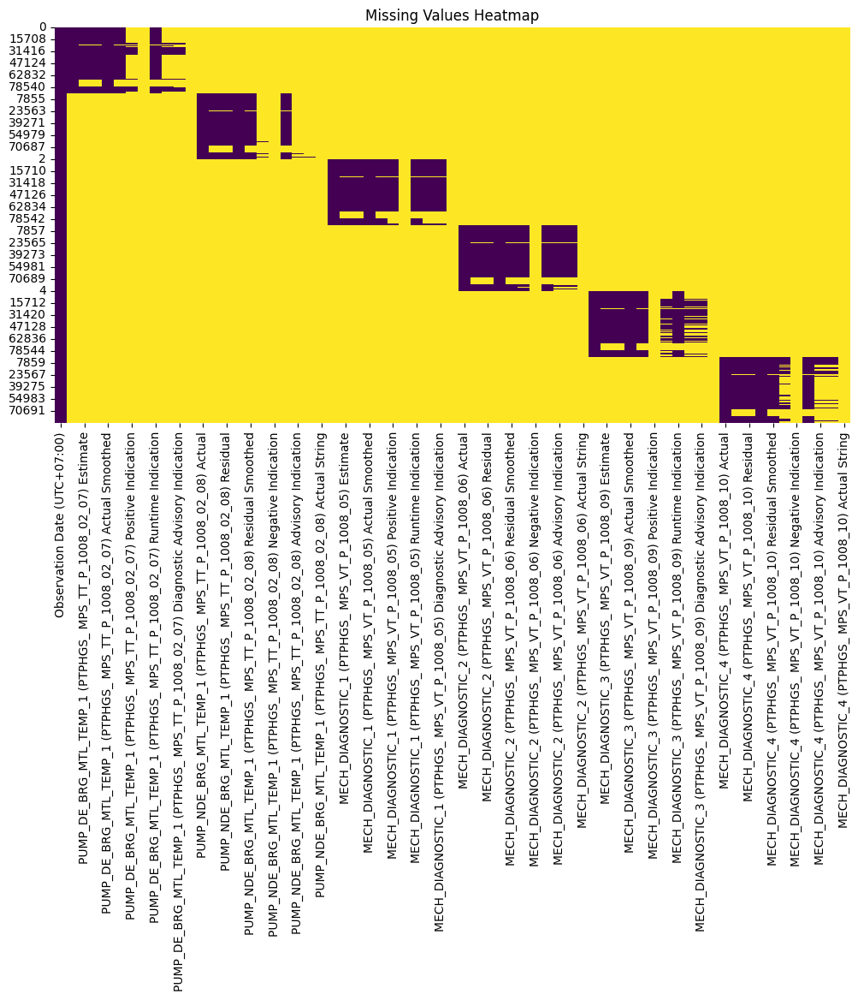

In [9]:
# Visualizing missing values
plt.figure(figsize=(12, 6))
sns.heatmap(pd.concat(filtered_pump_data.values()).isnull(), cmap="viridis", cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

#### Check Categorical Variables

In [10]:
# find categorical variables
for sheet, df in filtered_pump_data.items():
    categorical = [var for var in df.columns if df[var].dtype=='O']
    for var in categorical:
        print(df[var].value_counts())
        print('\n')
    print("-" * 50)

PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Runtime Indication
Virtual Signal    77134
Name: count, dtype: int64


PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Advisory Indication
Long High fired for PTPHGS_ MPS_TT_P_1008_02_07 - TT-P-1008-02-07 Temp bearing DE on Petapahan HPS P-1008 Pump_x000D_\nHigh fired for PTPHGS_ MPS_TT_P_1008_02_07 - TT-P-1008-02-07 Temp bearing DE on Petapahan HPS P-1008 Pump                                                                                                                           23560
High fired for PTPHGS_ MPS_TT_P_1008_02_07 - TT-P-1008-02-07 Temp bearing DE on Petapahan HPS P-1008 Pump                                                                                                                                                                                                                                                   1023
Long High fired for PTPHGS_ MPS_TT_P_1008_02_07 - TT-P-1008-02-07 Temp bearing DE on Petapahan HP

In [11]:
# Find categorical variables for Diagnostic Advisory Indication
for sheet, df in filtered_pump_data.items():
    diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
    if diag_col:
        diag_col = diag_col[0]  # Take the first match if multiple exist
        print(f"Sheet: {sheet} - Diagnostic Advisory Indication Counts")
        print(df[diag_col].value_counts())
        print("-" * 50)

Sheet: PUMP_DE_BRG_MTL_TEMP_1 - Diagnostic Advisory Indication Counts
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication
Journal Bearing - Local Bearing  Problem Pump DE    23616
Name: count, dtype: int64
--------------------------------------------------
Sheet: PUMP_NDE_BRG_MTL_TEMP_1 - Diagnostic Advisory Indication Counts
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Diagnostic Advisory Indication
Journal Bearing - Local Bearing  Problem Pump NDE    1632
Name: count, dtype: int64
--------------------------------------------------
Sheet: MECH_DIAGNOSTIC_1 - Diagnostic Advisory Indication Counts
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Diagnostic Advisory Indication
Mechanical - Equipment Problem 1    69817
Name: count, dtype: int64
--------------------------------------------------
Sheet: MECH_DIAGNOSTIC_2 - Diagnostic Advisory Indication Counts
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Diagnostic Advisory Indication
Mechanical - Equipm

#### Time-Series Visualization of 'Actual' vs Estimate' and 'Residual' Sensor Readings

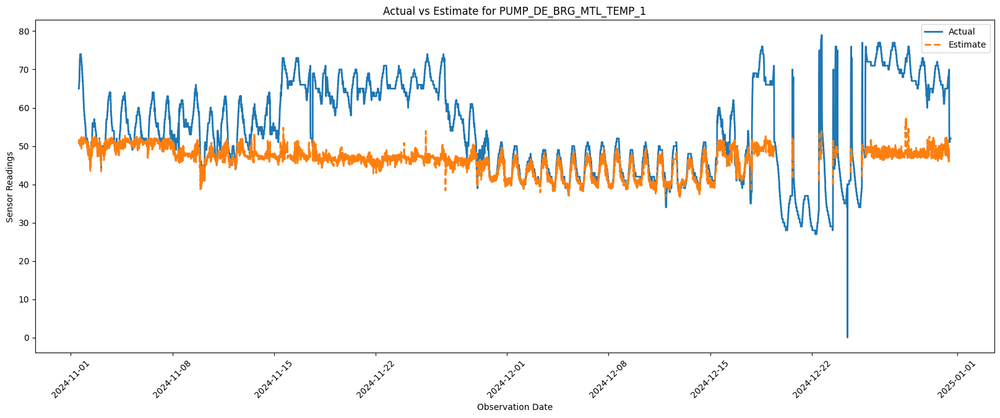

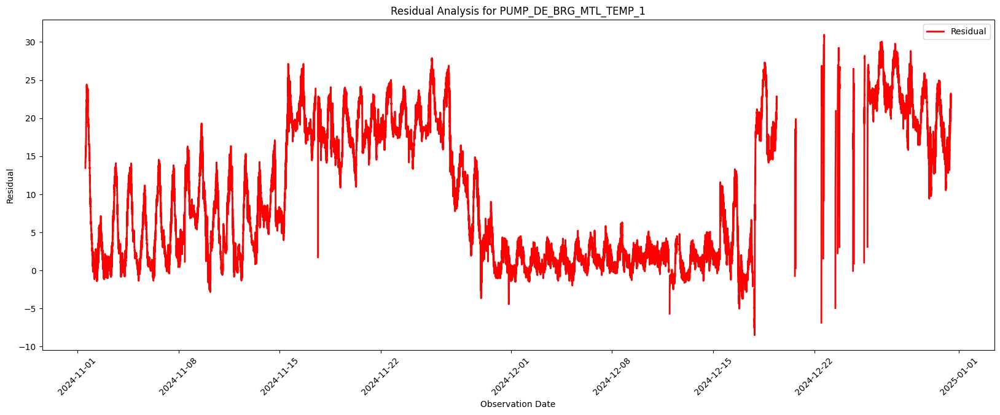

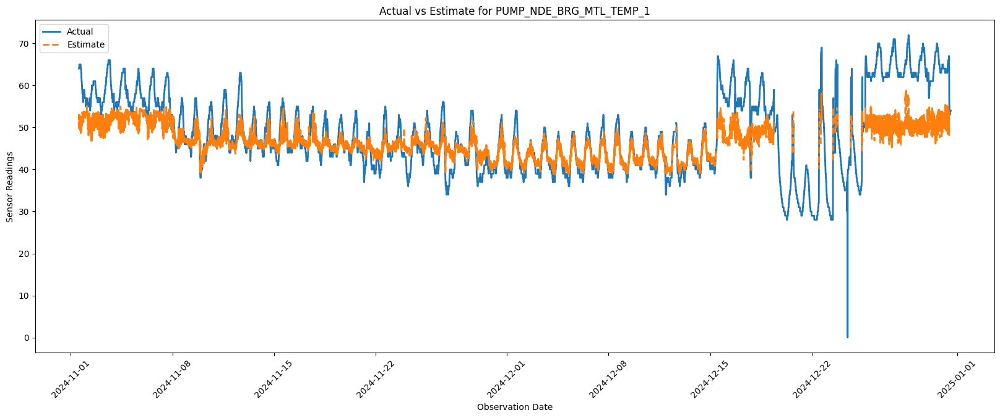

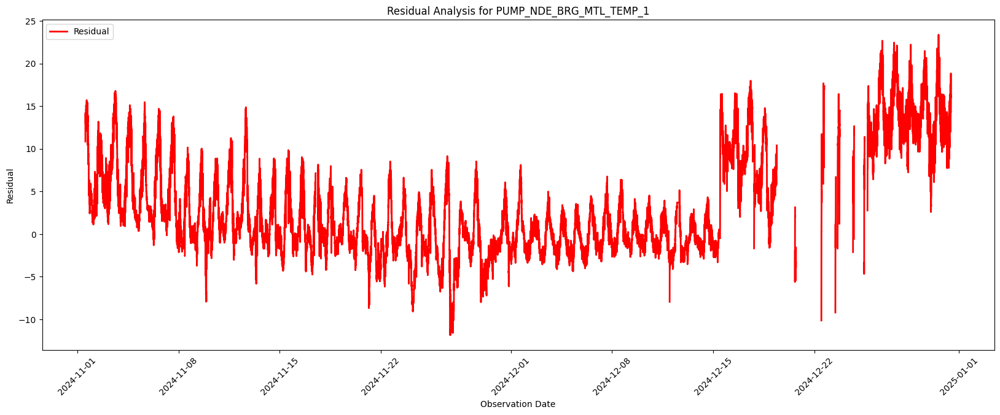

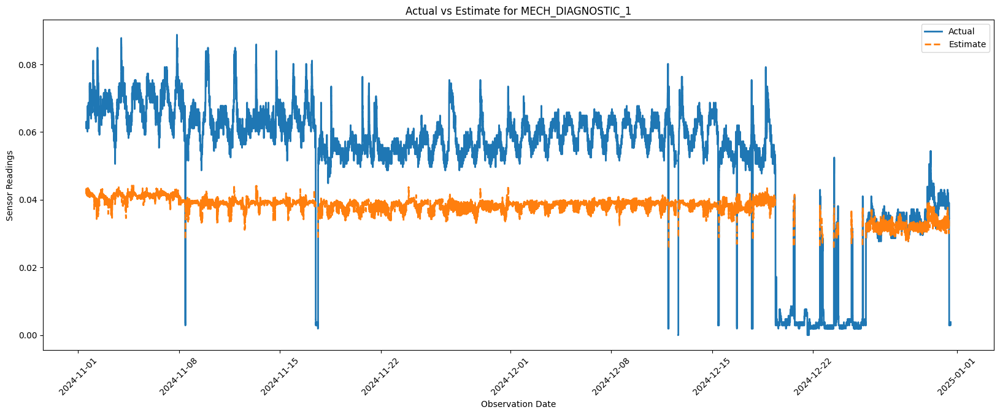

...

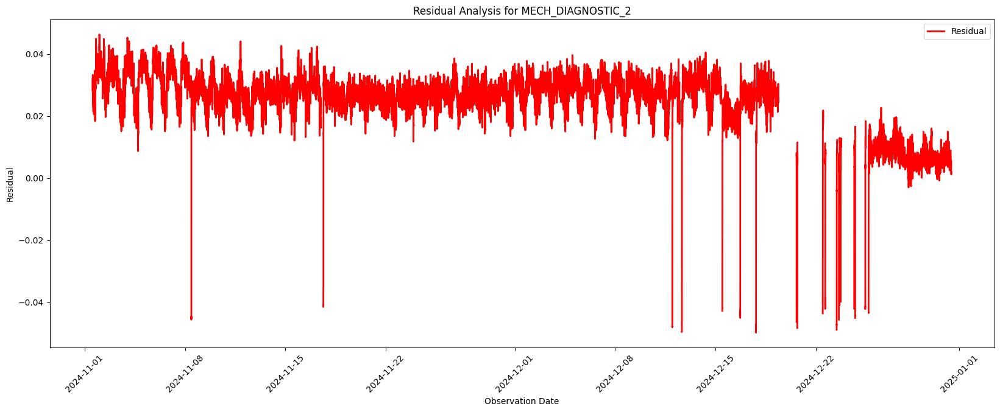

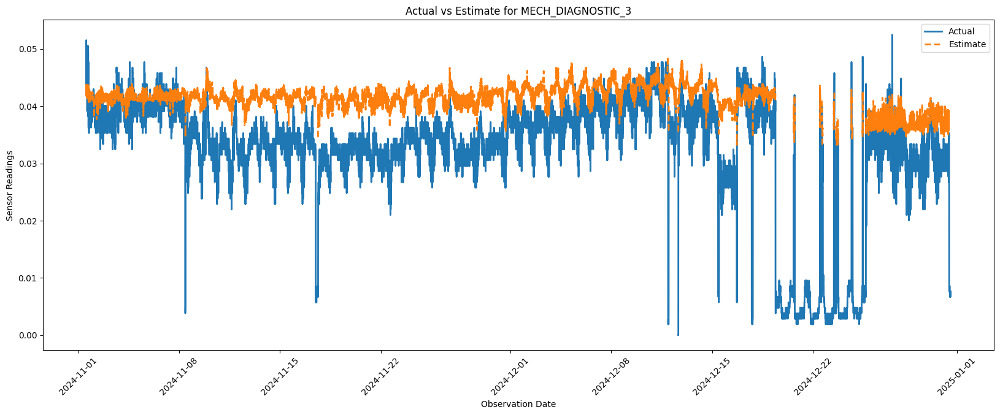

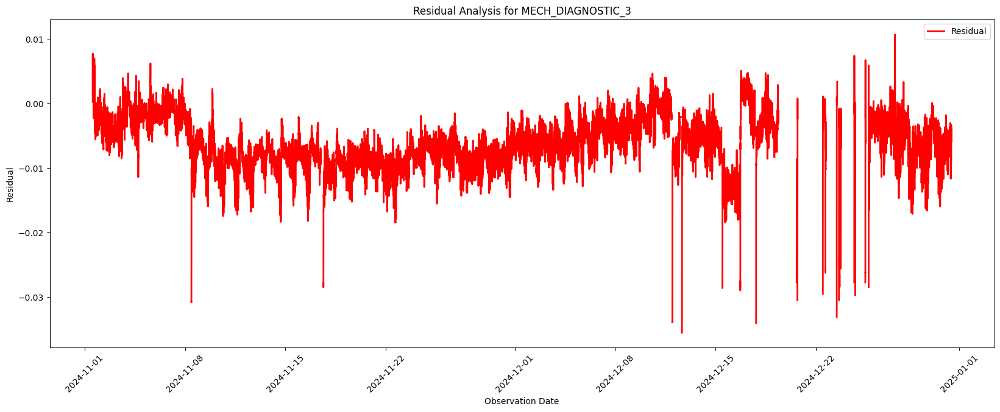

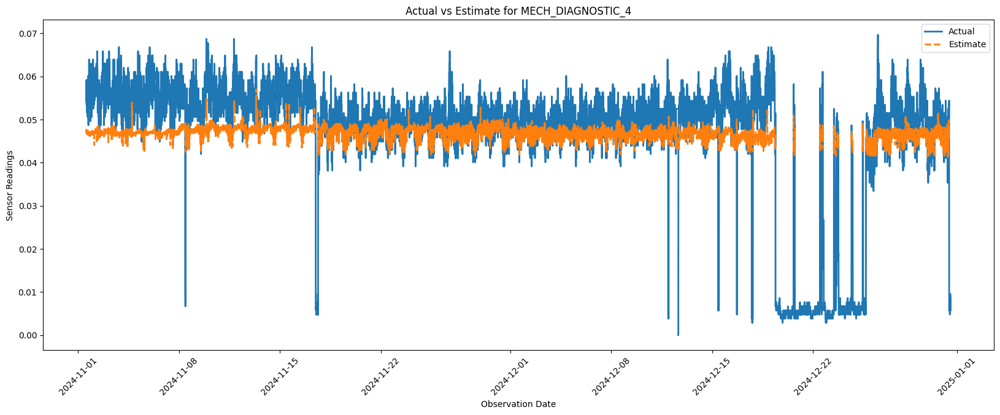

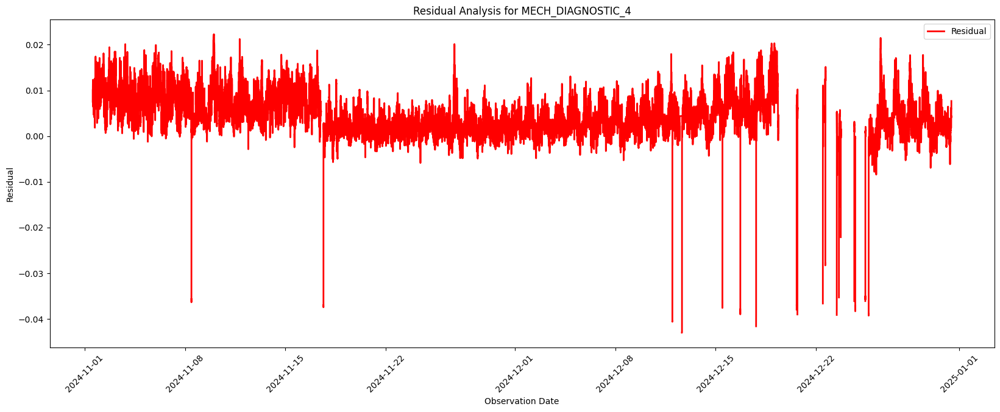

EDA before cleaning completed.


In [12]:
# Time-Series Visualization
for sheet, df in filtered_pump_data.items():
    if "Observation Date (UTC+07:00)" in df.columns:
        df["Observation Date (UTC+07:00)"] = pd.to_datetime(df["Observation Date (UTC+07:00)"], errors='coerce')
        
        # Plot Actual vs Estimate
        plt.figure(figsize=(20, 7))
        plt.plot(df["Observation Date (UTC+07:00)"], df.iloc[:, 1], label="Actual", linewidth=2)
        plt.plot(df["Observation Date (UTC+07:00)"], df.iloc[:, 2], linestyle='dashed', label="Estimate", linewidth=2)
        plt.xlabel("Observation Date")
        plt.ylabel("Sensor Readings")
        plt.title(f"Actual vs Estimate for {sheet}")
        plt.legend()
        plt.xticks(rotation=45)
        plt.show()
        
        # Plot Residuals
        plt.figure(figsize=(20, 7))
        plt.plot(df["Observation Date (UTC+07:00)"], df.iloc[:, 3], label="Residual", color='red', linewidth=2)
        plt.xlabel("Observation Date")
        plt.ylabel("Residual")
        plt.title(f"Residual Analysis for {sheet}")
        plt.legend()
        plt.xticks(rotation=45)
        plt.show()

print("EDA before cleaning completed.")

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3768097020.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = diagnostic_data[actual_col].apply(lambda val: y_max + 2 * offset if val >= (y_max + y_min) / 2 else y_min - 2 * offset)


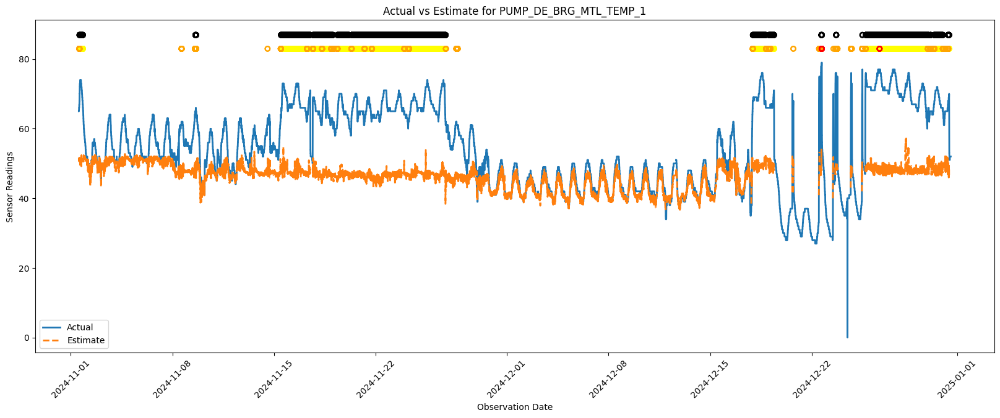

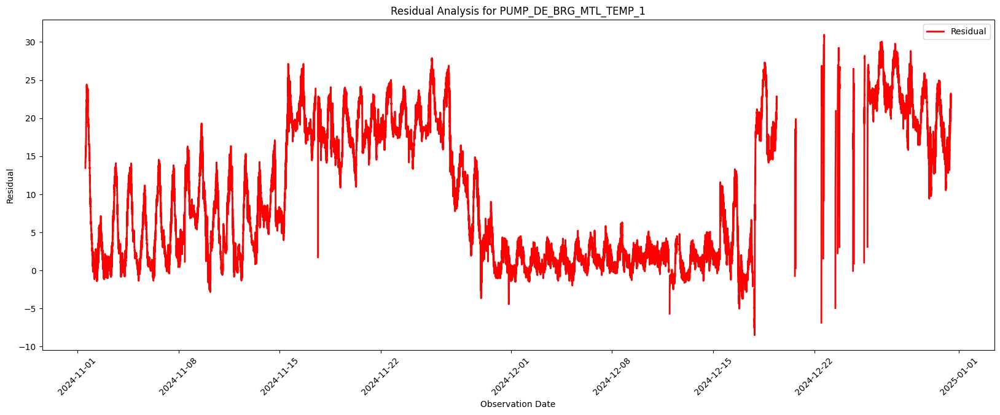

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3768097020.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = diagnostic_data[actual_col].apply(lambda val: y_max + 2 * offset if val >= (y_max + y_min) / 2 else y_min - 2 * offset)


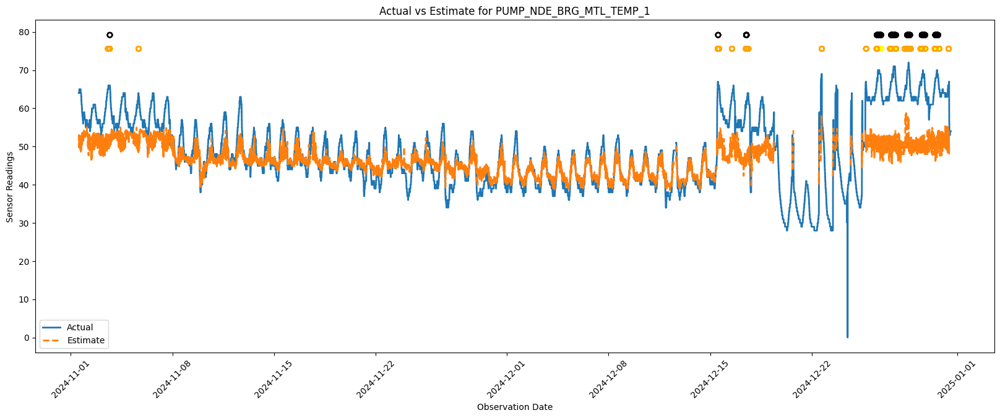

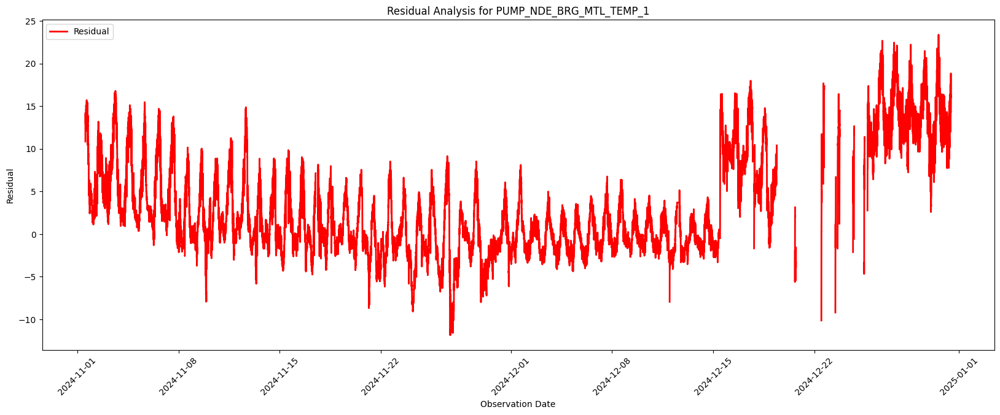

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3768097020.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = diagnostic_data[actual_col].apply(lambda val: y_max + 2 * offset if val >= (y_max + y_min) / 2 else y_min - 2 * offset)


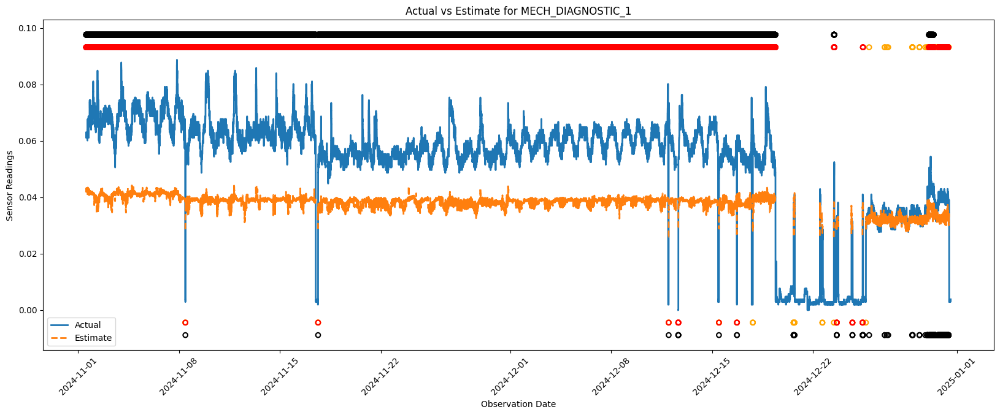

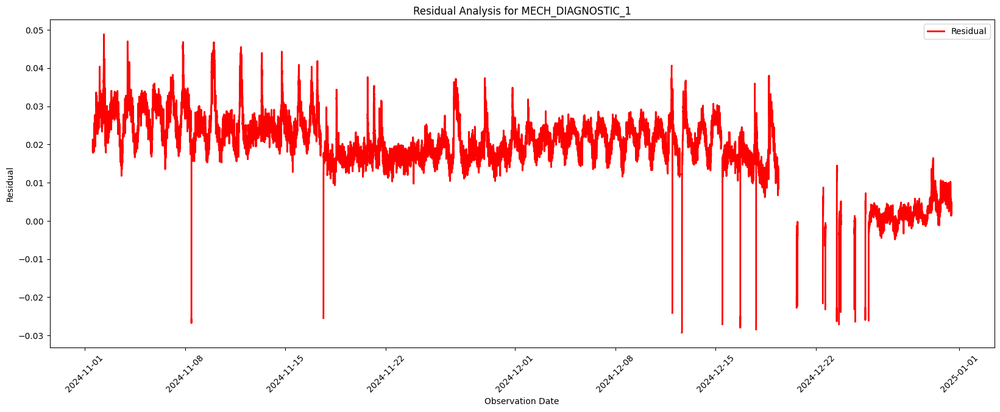

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3768097020.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = diagnostic_data[actual_col].apply(lambda val: y_max + 2 * offset if val >= (y_max + y_min) / 2 else y_min - 2 * offset)


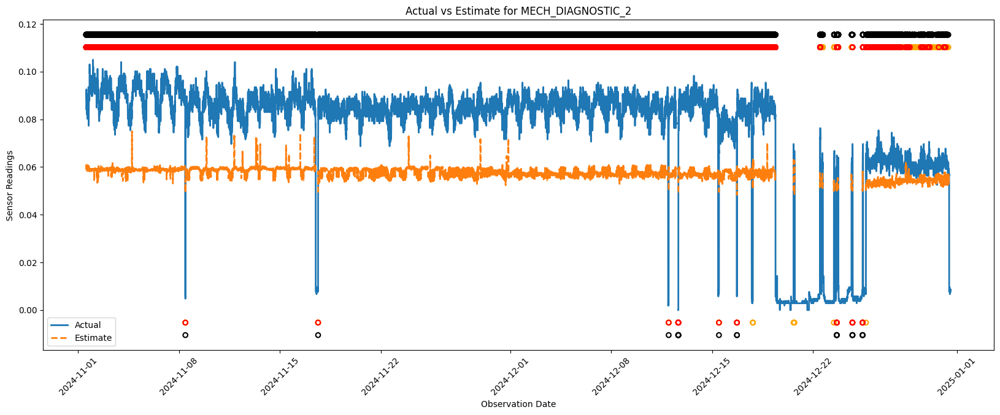

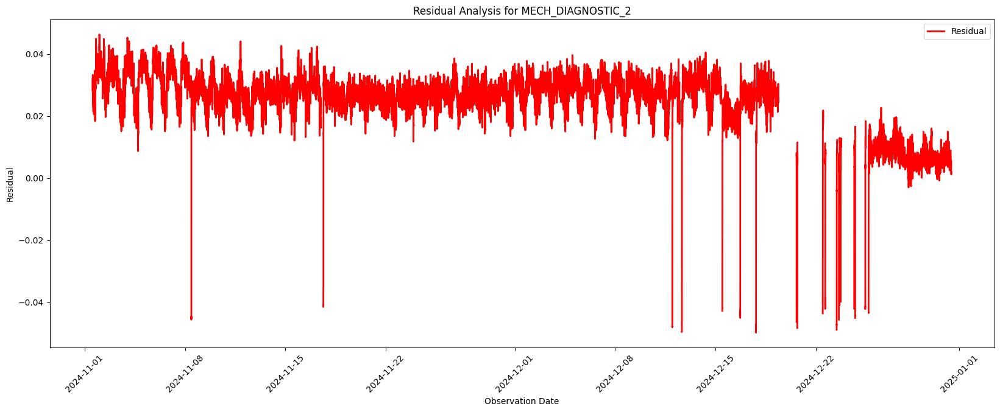

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3768097020.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = diagnostic_data[actual_col].apply(lambda val: y_max + 2 * offset if val >= (y_max + y_min) / 2 else y_min - 2 * offset)


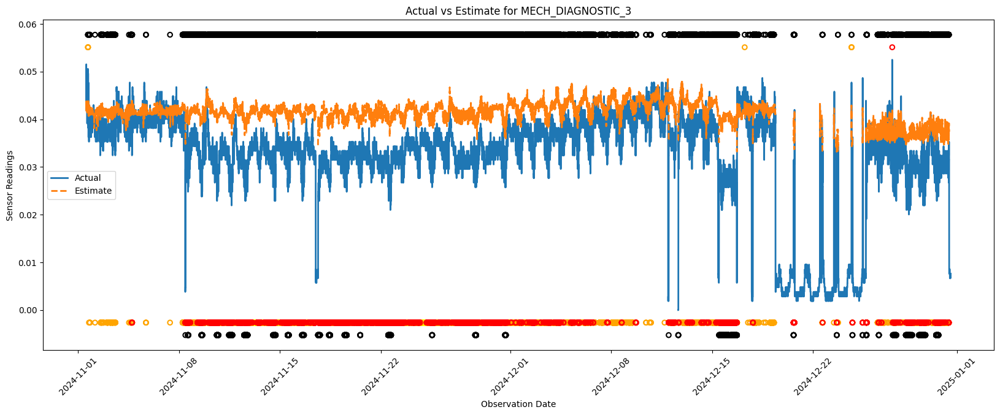

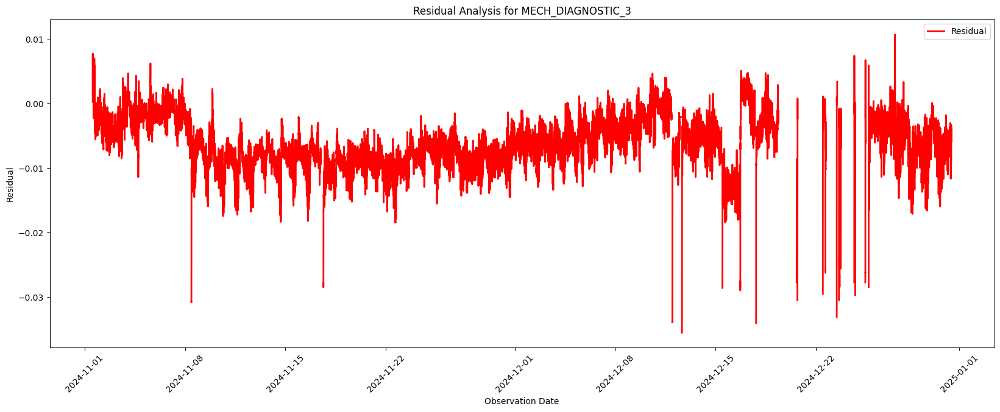

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3768097020.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = diagnostic_data[actual_col].apply(lambda val: y_max + 2 * offset if val >= (y_max + y_min) / 2 else y_min - 2 * offset)


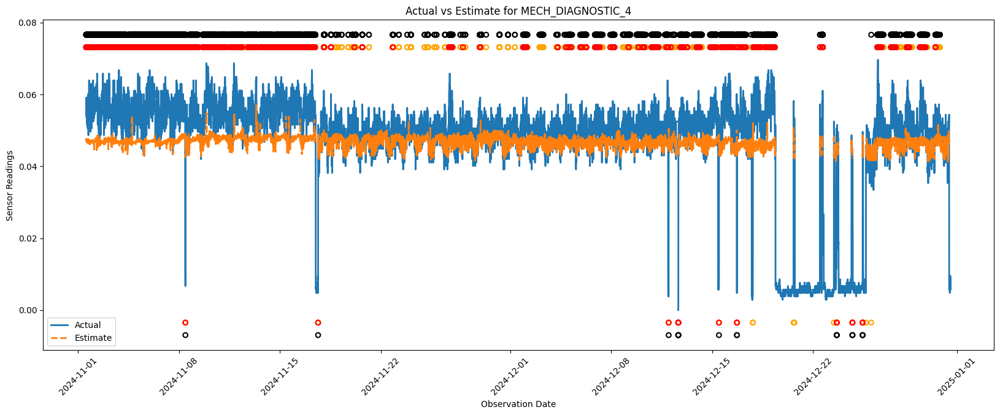

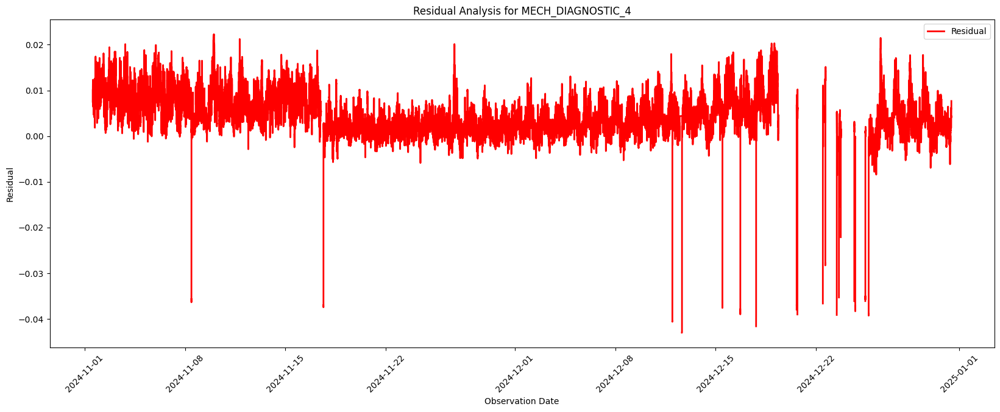

✅ EDA after cleaning completed.


In [13]:
def classify_advisory(text):
    """Classify advisory indication into marker color and position."""
    if pd.isnull(text) or text.strip().lower() == "normal":
        return None, None
    
    text_lower = text.lower()
    if "very high fired" in text_lower or "very low fired" in text_lower:
        return "red", "high" if "very high" in text_lower else "low"
    elif "long high fired" in text_lower or "long low fired" in text_lower:
        return "yellow", "high" if "long high" in text_lower else "low"
    elif "high fired" in text_lower or "low fired" in text_lower:
        return "orange", "high" if "high fired" in text_lower else "low"
    
    return None, None

# Time-Series Visualization with Optimized Marker Processing
for sheet, df in filtered_pump_data.items():
    if "Observation Date (UTC+07:00)" in df.columns:
        # Convert and sort dates
        df["Observation Date (UTC+07:00)"] = pd.to_datetime(df["Observation Date (UTC+07:00)"], errors='coerce')
        df = df.sort_values("Observation Date (UTC+07:00)").reset_index(drop=True)
        
        # Assuming: column 1 = Actual, column 2 = Estimate, column 3 = Residual.
        actual_col = df.columns[1]
        estimate_col = df.columns[2]
        residual_col = df.columns[3]

        # Compute vertical limits from Actual values and set an offset (5% of range)
        y_max = df[actual_col].max()
        y_min = df[actual_col].min()
        offset = 0.05 * (y_max - y_min)

        # Plot the Actual vs Estimate lines
        plt.figure(figsize=(20, 7))
        plt.plot(df["Observation Date (UTC+07:00)"], df[actual_col], label="Actual", linewidth=2)
        plt.plot(df["Observation Date (UTC+07:00)"], df[estimate_col], linestyle='dashed', label="Estimate", linewidth=2)
        plt.xlabel("Observation Date")
        plt.ylabel("Sensor Readings")
        plt.title(f"Actual vs Estimate for {sheet}")
        plt.legend()
        plt.xticks(rotation=45)

        # --- Process Advisory Indication Markers in Bulk ---
        advisory_col = next((col for col in df.columns if "Advisory Indication" in col and "Diagnostic" not in col), None)
        if advisory_col:
            advisory_data = df[[advisory_col, "Observation Date (UTC+07:00)"]].dropna()
            advisory_data["color"], advisory_data["position"] = zip(*advisory_data[advisory_col].apply(classify_advisory))
            
            # Remove None values
            advisory_data = advisory_data.dropna()
            advisory_data["y_coord"] = advisory_data["position"].map(lambda pos: y_max + offset if pos == "high" else y_min - offset)
            
            # Plot advisory markers in bulk
            for color in ["yellow", "orange", "red"]:
                subset = advisory_data[advisory_data["color"] == color]
                plt.scatter(subset["Observation Date (UTC+07:00)"], subset["y_coord"], 
                            s=30, facecolors='none', edgecolors=color, linewidths=1.5, zorder=2)

        # --- Process Diagnostic Advisory Indication Markers in Bulk ---
        diagnostic_col = next((col for col in df.columns if "Diagnostic Advisory Indication" in col), None)
        if diagnostic_col:
            diagnostic_data = df[(df[diagnostic_col].notnull()) & (df[diagnostic_col].str.strip().str.lower() != "normal")]
            if not diagnostic_data.empty:
                diagnostic_data["y_coord"] = diagnostic_data[actual_col].apply(lambda val: y_max + 2 * offset if val >= (y_max + y_min) / 2 else y_min - 2 * offset)
                
                # Plot diagnostic markers
                diag_scatter = plt.scatter(diagnostic_data["Observation Date (UTC+07:00)"], diagnostic_data["y_coord"], 
                                           s=30, facecolors='none', edgecolors="black", linewidths=1.5, zorder=3, label="Diagnostic Advisory Indication")

                # Attach tooltips for diagnostic markers
                cursor = mplcursors.cursor(diag_scatter, hover=True)
                @cursor.connect("add")
                def on_add(sel):
                    index = sel.index
                    diag_text = diagnostic_data.iloc[index][diagnostic_col]
                    sel.annotation.set_text(diag_text)

        plt.show()

        # Plot Residuals
        plt.figure(figsize=(20, 7))
        plt.plot(df["Observation Date (UTC+07:00)"], df[residual_col], label="Residual", color='red', linewidth=2)
        plt.xlabel("Observation Date")
        plt.ylabel("Residual")
        plt.title(f"Residual Analysis for {sheet}")
        plt.legend()
        plt.xticks(rotation=45)
        plt.show()

print("✅ EDA after cleaning completed.")


C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\2112300829.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = y_max + (2 * offset)


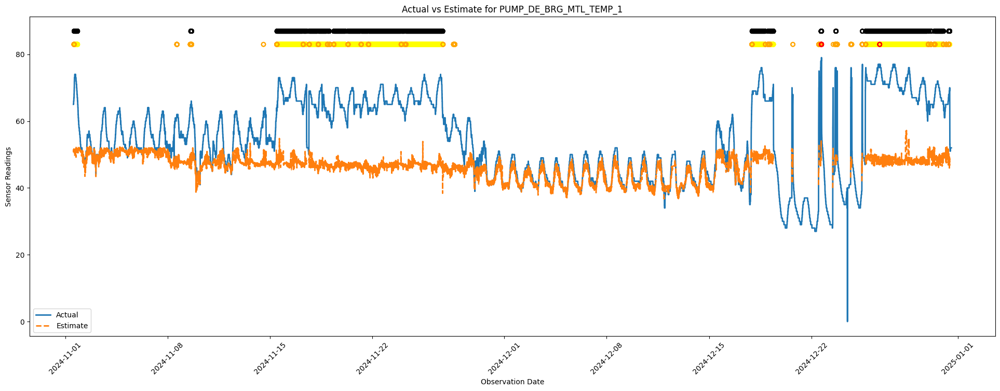

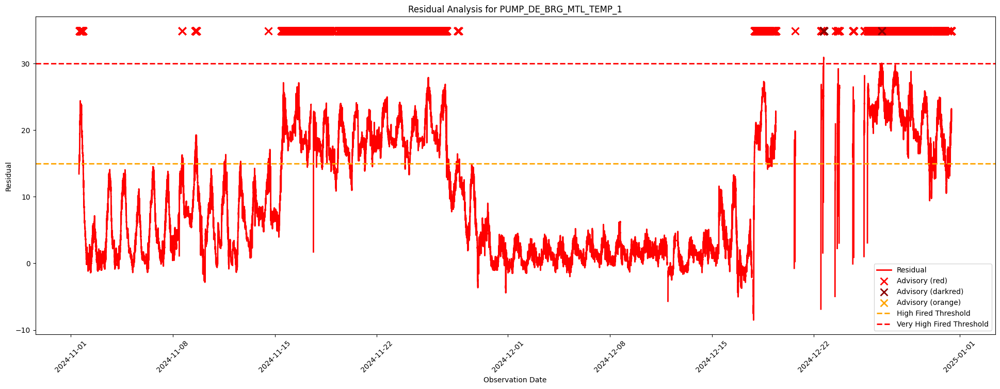

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\2112300829.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = y_max + (2 * offset)


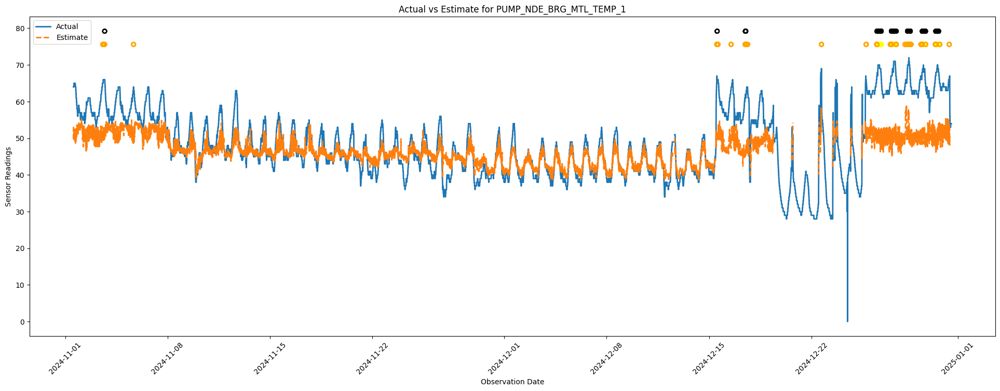

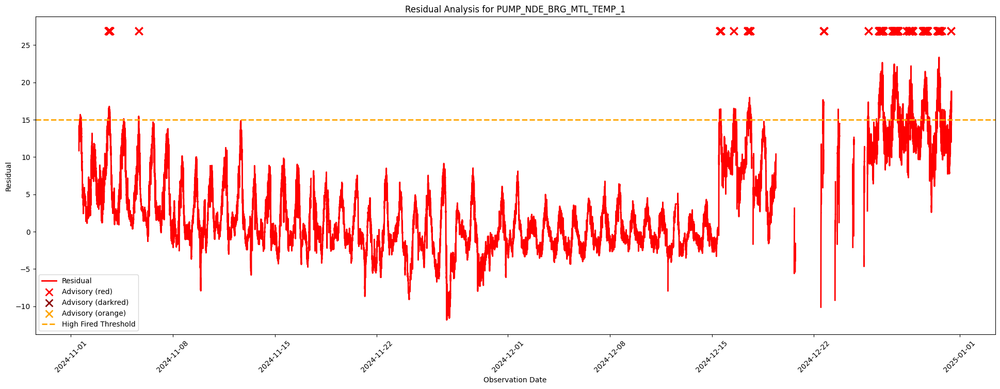

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\2112300829.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = y_max + (2 * offset)


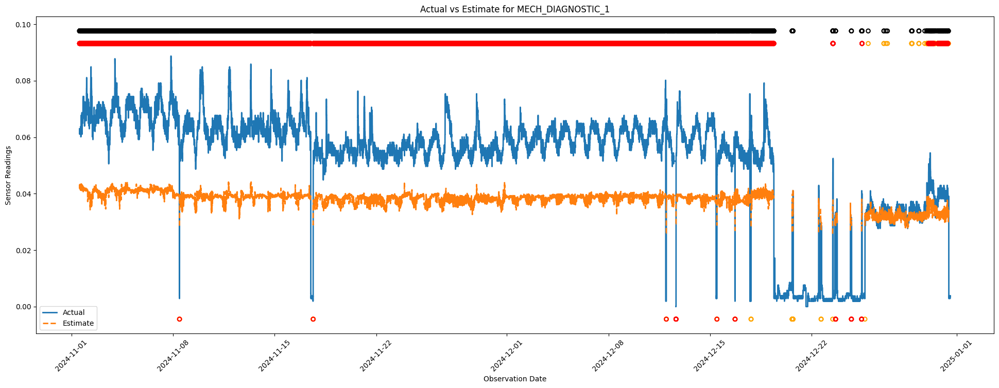

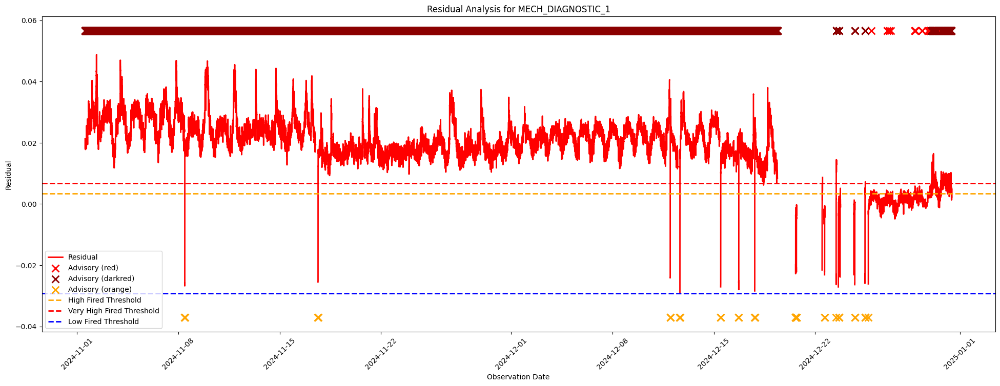

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\2112300829.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = y_max + (2 * offset)


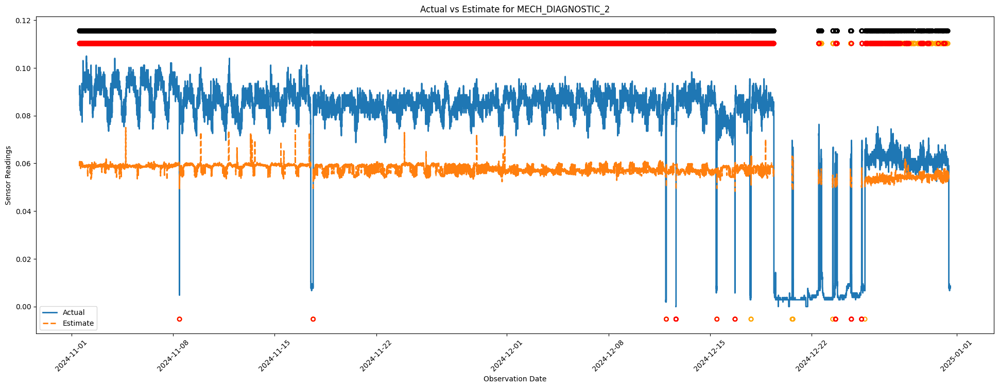

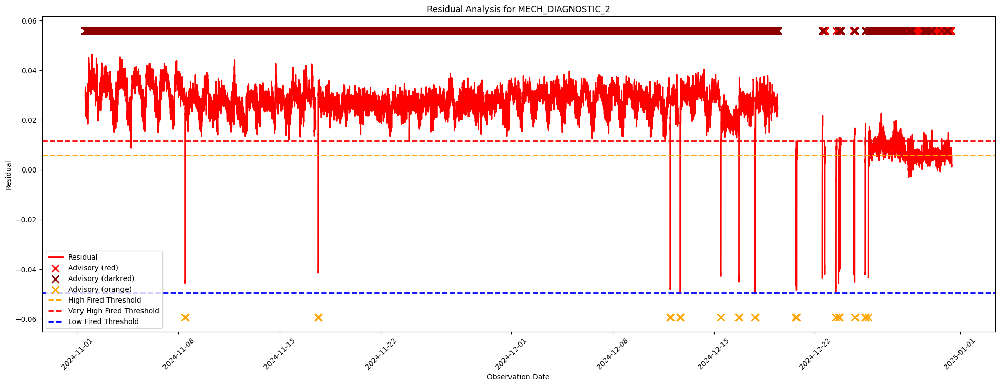

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\2112300829.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = y_max + (2 * offset)


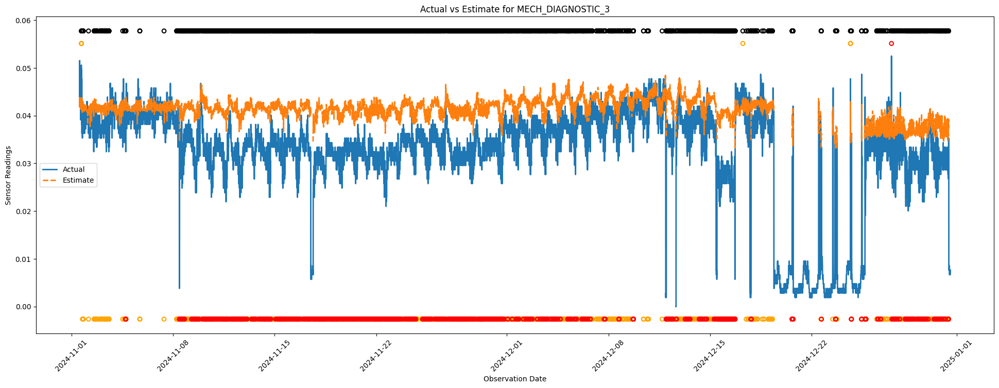

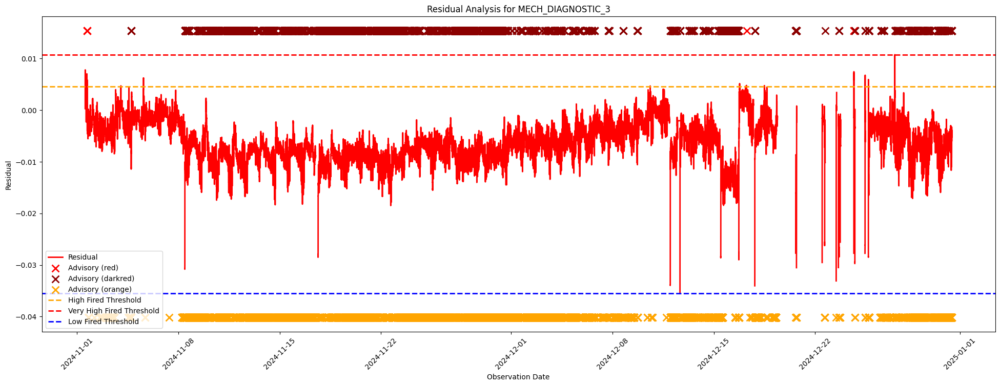

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\2112300829.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diagnostic_data["y_coord"] = y_max + (2 * offset)


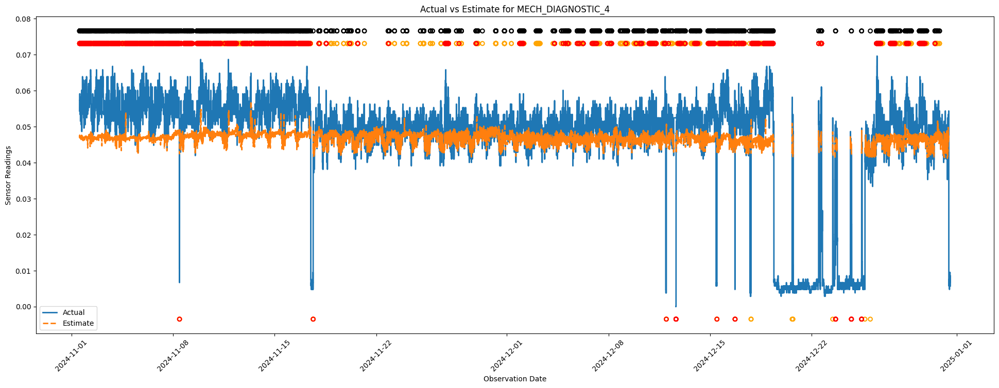

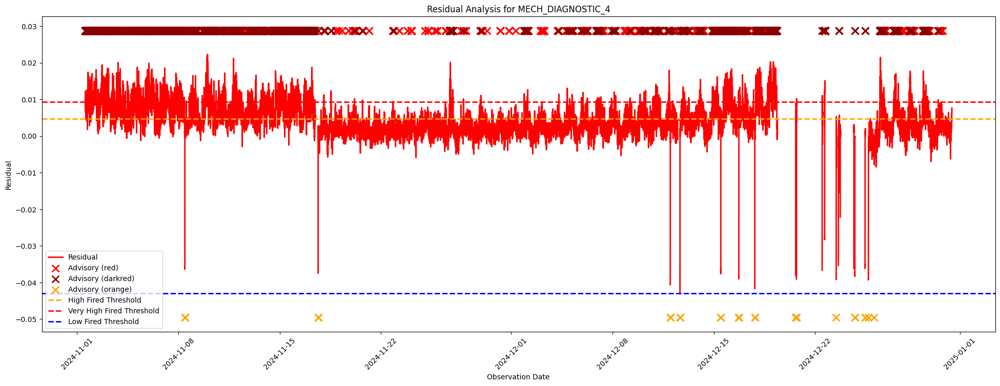

✅ EDA after cleaning completed.


In [14]:
def classify_advisory(text):
    """Classify advisory indication into marker color and position (high/top or low/bottom)."""
    if pd.isnull(text) or text.strip().lower() == "normal":
        return None, None
    
    text_lower = text.lower()
    
    # HIGH Advisory Cases (Placed at the Top)
    if "very high fired" in text_lower:
        return "red", "high"
    elif "long high fired" in text_lower:
        return "yellow", "high"
    elif "high fired" in text_lower:
        return "orange", "high"

    # LOW Advisory Cases (Placed at the Bottom)
    elif "very low fired" in text_lower:
        return "red", "low"
    elif "long low fired" in text_lower:
        return "yellow", "low"
    elif "low fired" in text_lower:
        return "orange", "low"
    
    return None, None

# Time-Series Visualization with Optimized Marker Processing
for sheet, df in filtered_pump_data.items():
    if "Observation Date (UTC+07:00)" in df.columns:
        # Convert and sort dates
        df["Observation Date (UTC+07:00)"] = pd.to_datetime(df["Observation Date (UTC+07:00)"], errors='coerce')
        df = df.sort_values("Observation Date (UTC+07:00)").reset_index(drop=True)
        
        # Assuming: column 1 = Actual, column 2 = Estimate, column 3 = Residual.
        actual_col = df.columns[1]
        estimate_col = df.columns[2]
        residual_col = df.columns[3]

        # Compute vertical limits from Actual values and set an offset (5% of range)
        y_max = df[actual_col].max()
        y_min = df[actual_col].min()
        offset = 0.05 * (y_max - y_min)

        # Plot the Actual vs Estimate lines
        plt.figure(figsize=(24, 8))
        plt.plot(df["Observation Date (UTC+07:00)"], df[actual_col], label="Actual", linewidth=2)
        plt.plot(df["Observation Date (UTC+07:00)"], df[estimate_col], linestyle='dashed', label="Estimate", linewidth=2)
        plt.xlabel("Observation Date")
        plt.ylabel("Sensor Readings")
        plt.title(f"Actual vs Estimate for {sheet}")
        plt.legend()
        plt.xticks(rotation=45)

        # --- Process Advisory Indication Markers ---
        advisory_col = next((col for col in df.columns if "Advisory Indication" in col and "Diagnostic" not in col), None)
        if advisory_col:
            advisory_data = df[[advisory_col, "Observation Date (UTC+07:00)"]].dropna()
            advisory_data["color"], advisory_data["position"] = zip(*advisory_data[advisory_col].apply(classify_advisory))
            
            # Remove None values
            advisory_data = advisory_data.dropna()
            advisory_data["y_coord"] = advisory_data["position"].map(lambda pos: y_max + offset if pos == "high" else y_min - offset)

            # Plot advisory markers
            for color in ["yellow", "orange", "red"]:
                subset = advisory_data[advisory_data["color"] == color]
                plt.scatter(subset["Observation Date (UTC+07:00)"], subset["y_coord"], 
                            s=30, facecolors='none', edgecolors=color, linewidths=1.5, zorder=2)

        # --- Process Diagnostic Advisory Indication Markers (Placed Above Advisory) ---
        diagnostic_col = next((col for col in df.columns if "Diagnostic Advisory Indication" in col), None)
        if diagnostic_col:
            diagnostic_data = df[(df[diagnostic_col].notnull()) & (df[diagnostic_col].str.strip().str.lower() != "normal")]
            if not diagnostic_data.empty:
                diagnostic_data["y_coord"] = y_max + (2 * offset)  

                # Plot diagnostic markers (Above advisory)
                diag_scatter = plt.scatter(diagnostic_data["Observation Date (UTC+07:00)"], diagnostic_data["y_coord"], 
                                           s=30, facecolors='none', edgecolors="black", linewidths=1.5, zorder=3, label="Diagnostic Advisory Indication")

                # Attach tooltips for diagnostic markers
                cursor = mplcursors.cursor(diag_scatter, hover=True)
                @cursor.connect("add")
                def on_add(sel):
                    index = sel.index
                    diag_text = diagnostic_data.iloc[index][diagnostic_col]
                    sel.annotation.set_text(diag_text)

        plt.show()

        # --- Residual Plot ---
        plt.figure(figsize=(24, 8))
        plt.plot(df["Observation Date (UTC+07:00)"], df[residual_col], label="Residual", color='red', linewidth=2)

        # Process advisory markers for Residuals
        if advisory_col:
            advisory_residuals = df.dropna(subset=[advisory_col, residual_col]).copy()

            # Assign colors based on Advisory Type
            advisory_residuals["marker_color"] = advisory_residuals[advisory_col].apply(
                lambda x: "darkred" if "very high fired" in str(x).lower() or "very low fired" in str(x).lower()
                else "red" if "high fired" in str(x).lower() or "long high fired" in str(x).lower() 
                else "orange" if "low fired" in str(x).lower() or "long low fired" in str(x).lower()
                else None
            )

            # Remove rows with no advisory markers
            advisory_residuals = advisory_residuals.dropna(subset=["marker_color"])

            # **Move 'X' marks to the top or bottom of the graph**
            y_top = df[residual_col].max() + (df[residual_col].max() - df[residual_col].min()) * 0.1
            y_bottom = df[residual_col].min() - (df[residual_col].max() - df[residual_col].min()) * 0.1

            # Plot advisory residual markers at the top (for High cases) and bottom (for Low cases)
            for color in ["red", "darkred"]:
                subset = advisory_residuals[advisory_residuals["marker_color"] == color]
                plt.scatter(subset["Observation Date (UTC+07:00)"], [y_top] * len(subset), 
                            color=color, marker="x", s=100, linewidth=2, label=f"Advisory ({color})")

            for color in ["orange"]:
                subset = advisory_residuals[advisory_residuals["marker_color"] == color]
                plt.scatter(subset["Observation Date (UTC+07:00)"], [y_bottom] * len(subset), 
                            color=color, marker="x", s=100, linewidth=2, label=f"Advisory ({color})")

            # --- Compute and Plot Threshold Lines ---
            high_fired_min = advisory_residuals[advisory_residuals[advisory_col].str.contains("High Fired", case=False)][residual_col].min()
            very_high_fired_min = advisory_residuals[advisory_residuals[advisory_col].str.contains("Very High Fired", case=False)][residual_col].min()
            low_fired_min = advisory_residuals[advisory_residuals[advisory_col].str.contains("Low Fired", case=False)][residual_col].min()

            if pd.notnull(high_fired_min):
                plt.axhline(y=high_fired_min, color="orange", linestyle="--", linewidth=2, label="High Fired Threshold")
            
            if pd.notnull(very_high_fired_min):
                plt.axhline(y=very_high_fired_min, color="red", linestyle="--", linewidth=2, label="Very High Fired Threshold")

            if pd.notnull(low_fired_min):
                plt.axhline(y=low_fired_min, color="blue", linestyle="--", linewidth=2, label="Low Fired Threshold")

        plt.xlabel("Observation Date")
        plt.ylabel("Residual")
        plt.title(f"Residual Analysis for {sheet}")
        plt.legend()
        plt.xticks(rotation=45)
        plt.show()

print("✅ EDA after cleaning completed.")


In [15]:
for sheet, df in filtered_pump_data.items():
    print(f"\n📌 Processing sheet: {sheet}")

    # Identify column names dynamically
    advisory_col = next((col for col in df.columns if "Advisory Indication" in col and "Diagnostic" not in col), None)
    diagnostic_col = next((col for col in df.columns if "Diagnostic Advisory Indication" in col), None)

    # Check if both columns exist
    if advisory_col and diagnostic_col:
        # Filter rows where Diagnostic Advisory Indication is NOT NaN and NOT "Normal"
        filtered_df = df[(df[diagnostic_col].notna()) & (df[diagnostic_col].str.strip().str.lower() != "normal")]

        # Select and drop duplicates to show unique relationships
        unique_pairs = filtered_df[[advisory_col, diagnostic_col]].drop_duplicates()

        print(f"\n🔍 Unique Advisory Indications & Their Diagnostic Advisory Indications in {sheet}:")
        print(unique_pairs.to_string(index=False))  # Print as a clean table
    else:
        print(f"⚠ Skipping {sheet} (Missing required columns)")



📌 Processing sheet: PUMP_DE_BRG_MTL_TEMP_1

🔍 Unique Advisory Indications & Their Diagnostic Advisory Indications in PUMP_DE_BRG_MTL_TEMP_1:
                                                                                                                                                                                                                                                                               PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Advisory Indication PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication
                                                                                                                       Long High fired for PTPHGS_ MPS_TT_P_1008_02_07 - TT-P-1008-02-07 Temp bearing DE on Petapahan HPS P-1008 Pump_x000D_\nHigh fired for PTPHGS_ MPS_TT_P_1008_02_07 - TT-P-1008-02-07 Temp bearing DE on Petapahan HPS P-1008 Pump                                    Journal Bearing - Local Bearing  Problem Pump DE
  

### Data Preprocessing

In [16]:
# Print all column names for each sheet
for sheet, df in filtered_pump_data.items():
    print(f"Sheet: {sheet} - Columns:")
    for col in df.columns:
        print(f"'{col}'")  # Print exact column names, including any spaces
    print("-" * 50)


Sheet: PUMP_DE_BRG_MTL_TEMP_1 - Columns:
'Observation Date (UTC+07:00)'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual Smoothed'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual Smoothed'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Positive Indication'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Negative Indication'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Runtime Indication'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Advisory Indication'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication'
'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual String'
--------------------------------------------------
Sheet: PUMP_NDE_BRG_MTL_TEMP_1 - Columns:
'Observation Date (UTC+07:00)'
'PUMP_NDE_BRG_MT

#### Check Key Statistics before Cleaning

In [17]:
# Debugging: Print key statistics before cleaning
for sheet, df in filtered_pump_data.items():
    print(f"\n📌 Sheet: {sheet} - Initial shape: {df.shape}")
    
    sensor_columns = [col for col in df.columns if any(x in col for x in ["Actual", "Estimate", "Residual"])]
    
    # Check NaN stats **before** removing anything
    print(f"🔹 Identified sensor columns: {sensor_columns}")
    print(f"🔍 Total NaN values in sensor columns: {df[sensor_columns].isna().sum().sum()}")
    print(f"✔ Rows with at least one NaN: {df[sensor_columns].isna().any(axis=1).sum()}")
    print(f"✔ Rows where all sensor values are NaN: {df[sensor_columns].isna().all(axis=1).sum()}")
    print(f"🔍 Total NaN values in 'Diagnostic Advisory Indication': {df[df.columns[df.columns.str.contains('Diagnostic Advisory Indication')]].isna().sum().sum()}")
    
    print("=" * 50)


📌 Sheet: PUMP_DE_BRG_MTL_TEMP_1 - Initial shape: (86393, 12)
🔹 Identified sensor columns: ['PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual Smoothed', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual Smoothed', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual String']
🔍 Total NaN values in sensor columns: 114178
✔ Rows with at least one NaN: 86393
✔ Rows where all sensor values are NaN: 0
🔍 Total NaN values in 'Diagnostic Advisory Indication': 62777

📌 Sheet: PUMP_NDE_BRG_MTL_TEMP_1 - Initial shape: (86393, 12)
🔹 Identified sensor columns: ['PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual', 'PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate', 'PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual', 'PUMP_NDE_BRG_MTL_TEMP_1 

#### Data Cleaning Function v4

In [18]:
# def clean_data(df):
#     # --- Fill missing values in "Advisory Indication" and adjust "Diagnostic Advisory Indication"
#     advisory_cols = [col for col in df.columns if "Advisory Indication" in col and "Diagnostic" not in col]
#     diagnostic_cols = [col for col in df.columns if "Diagnostic Advisory Indication" in col]

#     if advisory_cols:
#         advisory_col = advisory_cols[0]
#         df[advisory_col] = df[advisory_col].fillna("Normal")

#         if diagnostic_cols:
#             diagnostic_col = diagnostic_cols[0]

#             # --- Condition 1: "Normal" → "No Failure Indication"
#             condition_normal = df[advisory_col].str.strip().str.lower() == "normal"
#             df.loc[
#                 condition_normal & (df[diagnostic_col].isna() | (df[diagnostic_col].str.strip() == "")),
#                 diagnostic_col
#             ] = "No Failure Indication"

#             # --- Condition 2: "High Fired", "Low Fired", "Actual Value Low Fired" → "Early Failure Indication"
#             relevant_phrases = ["high fired", "low fired", "actual value low fired"]
#             condition_early = df[advisory_col].str.lower().apply(
#                 lambda x: any(phrase in x for phrase in relevant_phrases)
#             )
#             df.loc[
#                 condition_early & (df[diagnostic_col].isna() | (df[diagnostic_col].str.strip() == "")),
#                 diagnostic_col
#             ] = "Early Failure Indication"

#     # --- Rename Diagnostic labels in MECH_DIAGNOSTIC columns (if needed)
#     for col in df.columns:
#         if "MECH_DIAGNOSTIC" in col:
#             df[col] = df[col].replace({
#                 "Mechanical - Equipment Problem 1": "Mechanical - Equipment Problem - HTC vertical",
#                 "Mechanical - Equipment Problem 2": "Mechanical - Equipment Problem - HTC axial",
#                 "Mechanical - Equipment Problem 3": "Mechanical - Equipment Problem - Pump mid side vertical",
#                 "Mechanical - Equipment Problem 4": "Mechanical - Equipment Problem - Pump mid side horizontal"
#             })

#     # --- Drop unnecessary columns
#     drop_cols = [col for col in df.columns if any(x in col for x in [
#         "Smoothed", "Positive Indication", "Negative Indication", "Runtime Indication", "Actual String"
#     ])]
#     print(f"🗑 Dropping unnecessary columns: {drop_cols}")
#     df.drop(columns=drop_cols, inplace=True, errors="ignore")

#     # --- Identify and clean sensor columns
#     sensor_columns = [col for col in df.columns if any(x in col for x in ["Actual", "Estimate", "Residual"])]

#     # Drop fully empty sensor columns
#     empty_columns = [col for col in sensor_columns if df[col].isna().all()]
#     if empty_columns:
#         print(f" Dropping empty sensor columns: {empty_columns}")
#         df.drop(columns=empty_columns, inplace=True)

#     # Drop rows with missing sensor readings
#     df.dropna(subset=sensor_columns, how="any", inplace=True)

#     # Print count of new labels added
#     if diagnostic_cols:
#         diagnostic_col = diagnostic_cols[0]
#         early_failure_count = (df[diagnostic_col] == "Early Failure Indication").sum()
#         print(f"🟡 Total 'Early Failure Indication' labels after cleaning: {early_failure_count}")

#     print(f"✅ Final shape after cleaning: {df.shape}")
#     return df


#### Data Cleaning Function v3

In [19]:
def clean_data(df):
    # --- Fill missing values in "Advisory Indication" and adjust "Diagnostic Advisory Indication"
    advisory_cols = [col for col in df.columns if "Advisory Indication" in col and "Diagnostic" not in col]
    diagnostic_cols = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
    
    if advisory_cols:
        advisory_col = advisory_cols[0]
        df[advisory_col] = df[advisory_col].fillna("Normal")  # Fill missing Advisory Indication
        
        if diagnostic_cols:
            diagnostic_col = diagnostic_cols[0]
            # Condition 1: "Normal" → "No Failure Indication"
            condition_normal = df[advisory_col].str.strip().str.lower() == "normal"
            df.loc[condition_normal & (df[diagnostic_col].isna() | (df[diagnostic_col].str.strip() == "")), diagnostic_col] = "No Failure Indication"
            
            # Condition 2: "High Fired" (but not "Low Fired") → "Early Failure Indication - High Sensor Reading Value"
            condition_high = df[advisory_col].str.contains("High Fired", case=False, na=False) & (~df[advisory_col].str.contains("Low Fired", case=False, na=False))
            df.loc[condition_high & (df[diagnostic_col].isna() | (df[diagnostic_col].str.strip() == "")), diagnostic_col] = "Early Failure Indication - High Sensor Reading Value"
            
            # **Condition 3: Assign the same diagnostic as "Very Low Fired" to "Low Fired"**
            low_fired_condition = df[advisory_col].str.contains("Low Fired", case=False, na=False)
            very_low_fired_condition = df[advisory_col].str.contains("Very Low Fired", case=False, na=False)
            
            # Get existing diagnostics for "Very Low Fired"
            very_low_fired_diagnostics = df.loc[very_low_fired_condition, diagnostic_col].dropna().unique()
            
            # Assign to "Low Fired" if Diagnostic is missing
            if len(very_low_fired_diagnostics) > 0:
                df.loc[low_fired_condition & (df[diagnostic_col].isna() | (df[diagnostic_col].str.strip() == "")), diagnostic_col] = very_low_fired_diagnostics[0]
    
    # --- Rename Diagnostic Advisory Indication for Mechanical Diagnoses if applicable
    for col in df.columns:
        if "MECH_DIAGNOSTIC" in col:
            df[col] = df[col].replace({
                "Mechanical - Equipment Problem 1": "Mechanical - Equipment Problem - HTC vertical",
                "Mechanical - Equipment Problem 2": "Mechanical - Equipment Problem - HTC axial",
                "Mechanical - Equipment Problem 3": "Mechanical - Equipment Problem - Pump mid side vertical",
                "Mechanical - Equipment Problem 4": "Mechanical - Equipment Problem - Pump mid side horizontal"
            })
    
    # --- Drop unnecessary columns (Smoothed values, Indications, Other non-essential ones)
    drop_cols = [col for col in df.columns if any(x in col for x in [
        "Smoothed", "Positive Indication", "Negative Indication", "Runtime Indication", "Actual String"
    ])]
    print(f"Dropping unnecessary columns: {drop_cols}")
    df.drop(columns=drop_cols, inplace=True, errors="ignore")
    
    # --- Identify sensor columns (only those with 'Actual', 'Estimate', 'Residual')
    sensor_columns = [col for col in df.columns if any(x in col for x in ["Actual", "Estimate", "Residual"])]
    
    # --- Remove completely empty sensor columns
    empty_columns = [col for col in sensor_columns if df[col].isna().all()]
    if empty_columns:
        print(f"Dropping empty sensor columns: {empty_columns}")
        df.drop(columns=empty_columns, inplace=True)
    
    # --- Remove rows where any sensor reading is NaN (Strict removal)
    df.dropna(subset=sensor_columns, how="any", inplace=True)
    
    print(f"Final shape after cleaning: {df.shape}")
    return df


In [20]:
for sheet, df in filtered_pump_data.items():
    print(f"\nProcessing sheet: {sheet} - Initial shape: {df.shape}")

    # Apply data cleaning
    df = clean_data(df)

    print(f"Processed {sheet} - Final shape: {df.shape}")
    print("=" * 50)


Processing sheet: PUMP_DE_BRG_MTL_TEMP_1 - Initial shape: (86393, 12)
Dropping unnecessary columns: ['PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual Smoothed', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual Smoothed', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Positive Indication', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Negative Indication', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Runtime Indication', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual String']
Final shape after cleaning: (77134, 6)
Processed PUMP_DE_BRG_MTL_TEMP_1 - Final shape: (77134, 6)

Processing sheet: PUMP_NDE_BRG_MTL_TEMP_1 - Initial shape: (86393, 12)
Dropping unnecessary columns: ['PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual Smoothed', 'PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual Smoothed', 'PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Positive Indication', 'PUMP_NDE_BRG_MTL_TEMP_1 (PTP

#### Remove Duplicates

In [21]:
def remove_duplicates(df, target_col):
    """Remove duplicate rows while checking class distribution before and after."""
    before = df.shape[0]
    class_distribution_before = df[target_col].value_counts(normalize=True)

    df.drop_duplicates(inplace=True)
    
    after = df.shape[0]
    removed = before - after
    class_distribution_after = df[target_col].value_counts(normalize=True)

    print(f"🛠 Removed {removed} duplicate rows. Final shape: {df.shape}")

    # Compare class distributions before and after
    print("\n📊 Class Distribution Before:")
    print(class_distribution_before)
    print("\n📊 Class Distribution After:")
    print(class_distribution_after)

    return df

# Apply duplicate row removal to all sheets
for sheet, df in filtered_pump_data.items():
    print(f"\n📌 Removing duplicates for: {sheet}")

    # Identify target column dynamically
    diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
    
    if diag_col:
        target_col = diag_col[0]
        filtered_pump_data[sheet] = remove_duplicates(df, target_col)
    else:
        print(f"⚠ Skipping {sheet} (No target column found)")



📌 Removing duplicates for: PUMP_DE_BRG_MTL_TEMP_1
🛠 Removed 0 duplicate rows. Final shape: (77134, 6)

📊 Class Distribution Before:
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication
No Failure Indication                                   0.680569
Journal Bearing - Local Bearing  Problem Pump DE        0.306168
Early Failure Indication - High Sensor Reading Value    0.013263
Name: proportion, dtype: float64

📊 Class Distribution After:
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication
No Failure Indication                                   0.680569
Journal Bearing - Local Bearing  Problem Pump DE        0.306168
Early Failure Indication - High Sensor Reading Value    0.013263
Name: proportion, dtype: float64

📌 Removing duplicates for: PUMP_NDE_BRG_MTL_TEMP_1
🛠 Removed 0 duplicate rows. Final shape: (77134, 6)

📊 Class Distribution Before:
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Diagnostic Advisory Indica

#### Feature Correlation Anaylsis


📊 Feature Correlation Analysis for: PUMP_DE_BRG_MTL_TEMP_1


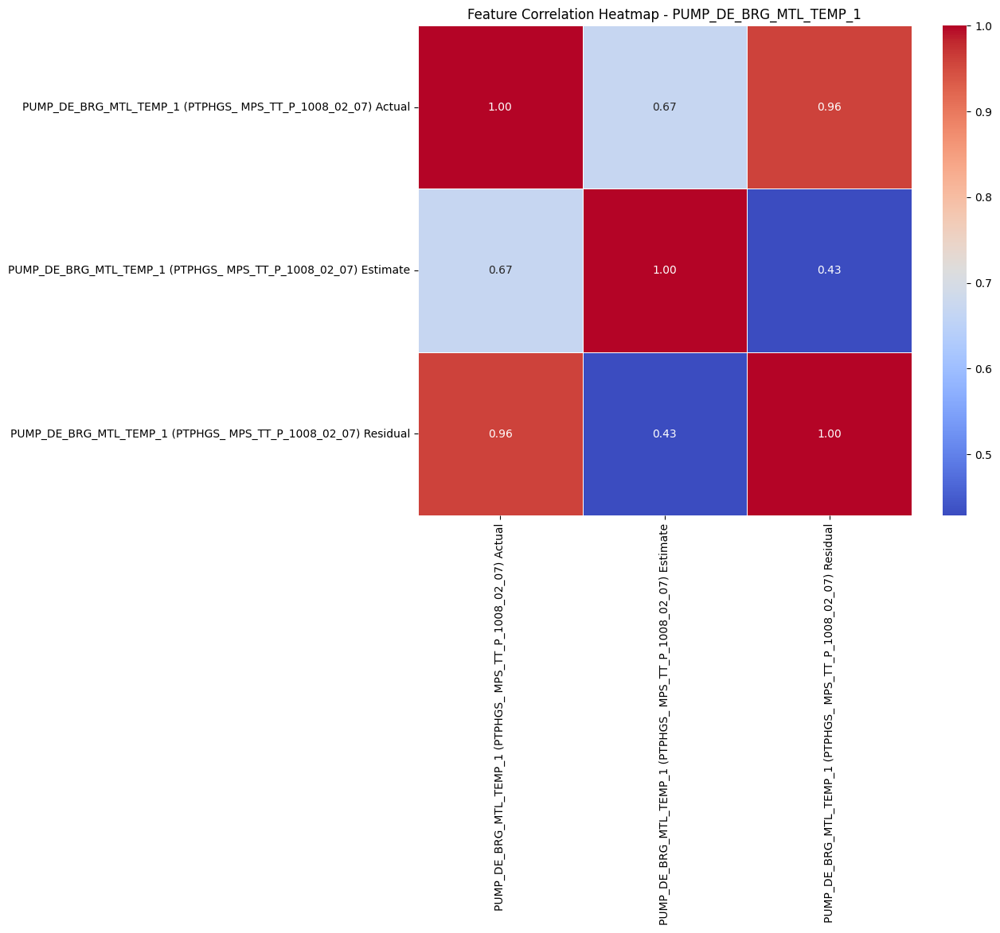

🚨 Highly Correlated Features (Correlation > 0.95) in PUMP_DE_BRG_MTL_TEMP_1: {'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual'}
✅ Suggest removing {'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual'} to reduce redundancy.

📊 Feature Correlation Analysis for: PUMP_NDE_BRG_MTL_TEMP_1


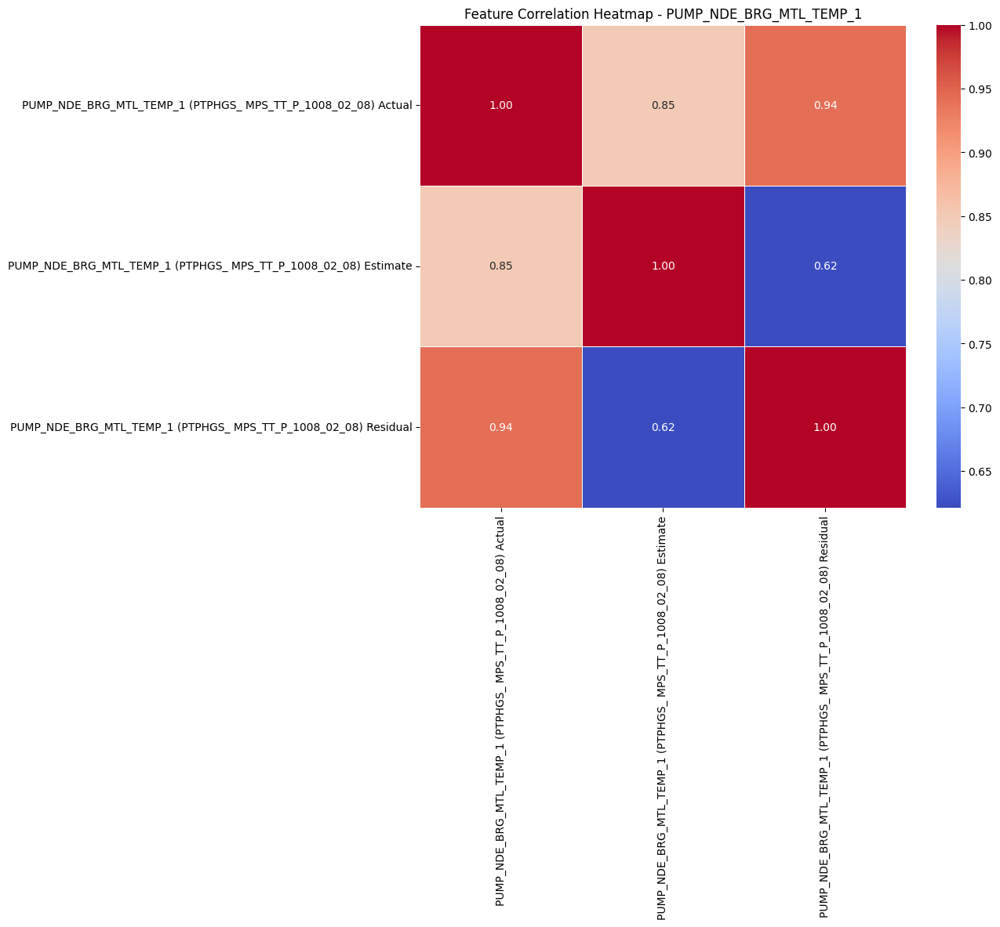

🚨 Highly Correlated Features (Correlation > 0.95) in PUMP_NDE_BRG_MTL_TEMP_1: set()
✅ No highly correlated features found. No need to drop.

📊 Feature Correlation Analysis for: MECH_DIAGNOSTIC_1


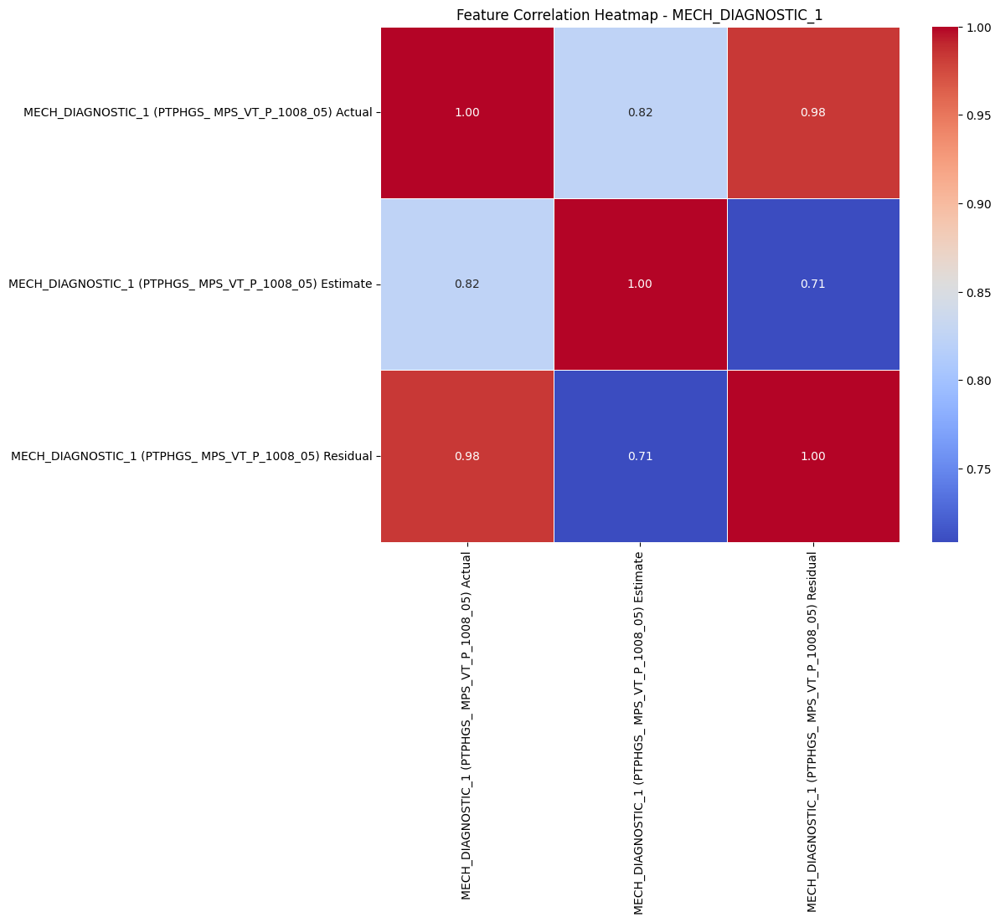

🚨 Highly Correlated Features (Correlation > 0.95) in MECH_DIAGNOSTIC_1: {'MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual'}
✅ Suggest removing {'MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual'} to reduce redundancy.

📊 Feature Correlation Analysis for: MECH_DIAGNOSTIC_2


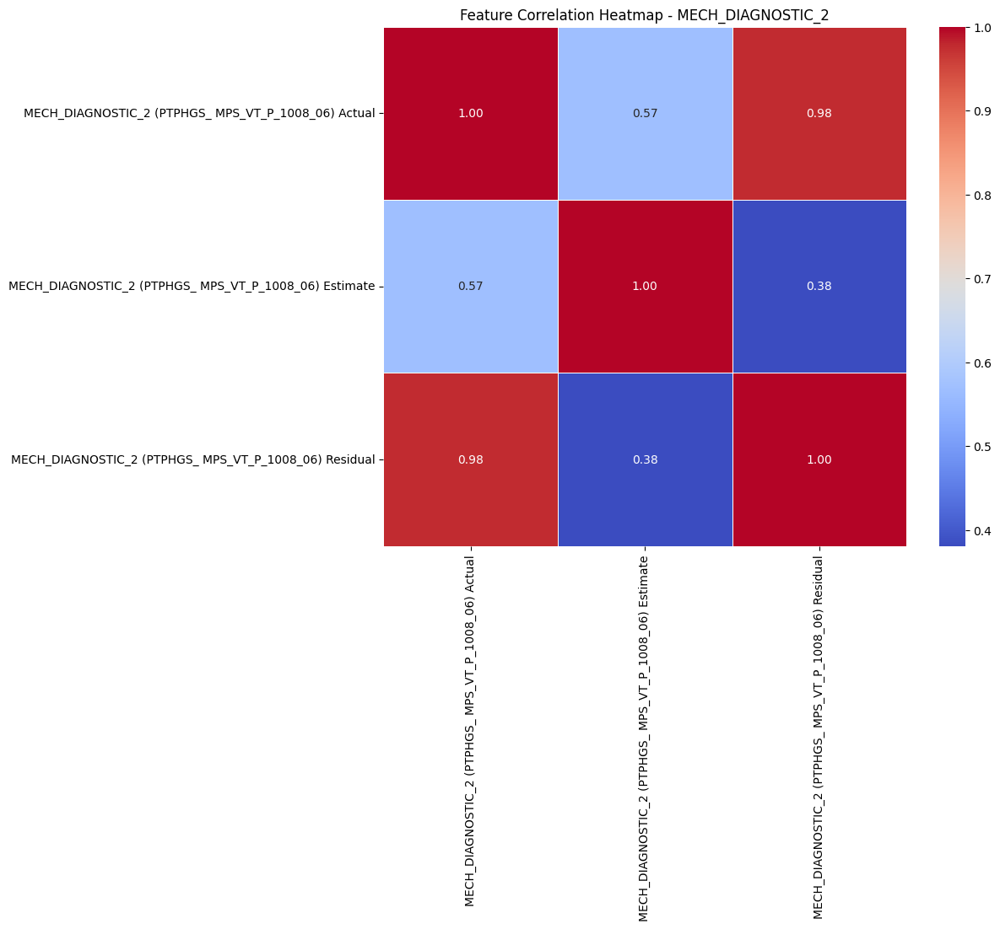

🚨 Highly Correlated Features (Correlation > 0.95) in MECH_DIAGNOSTIC_2: {'MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual'}
✅ Suggest removing {'MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual'} to reduce redundancy.

📊 Feature Correlation Analysis for: MECH_DIAGNOSTIC_3


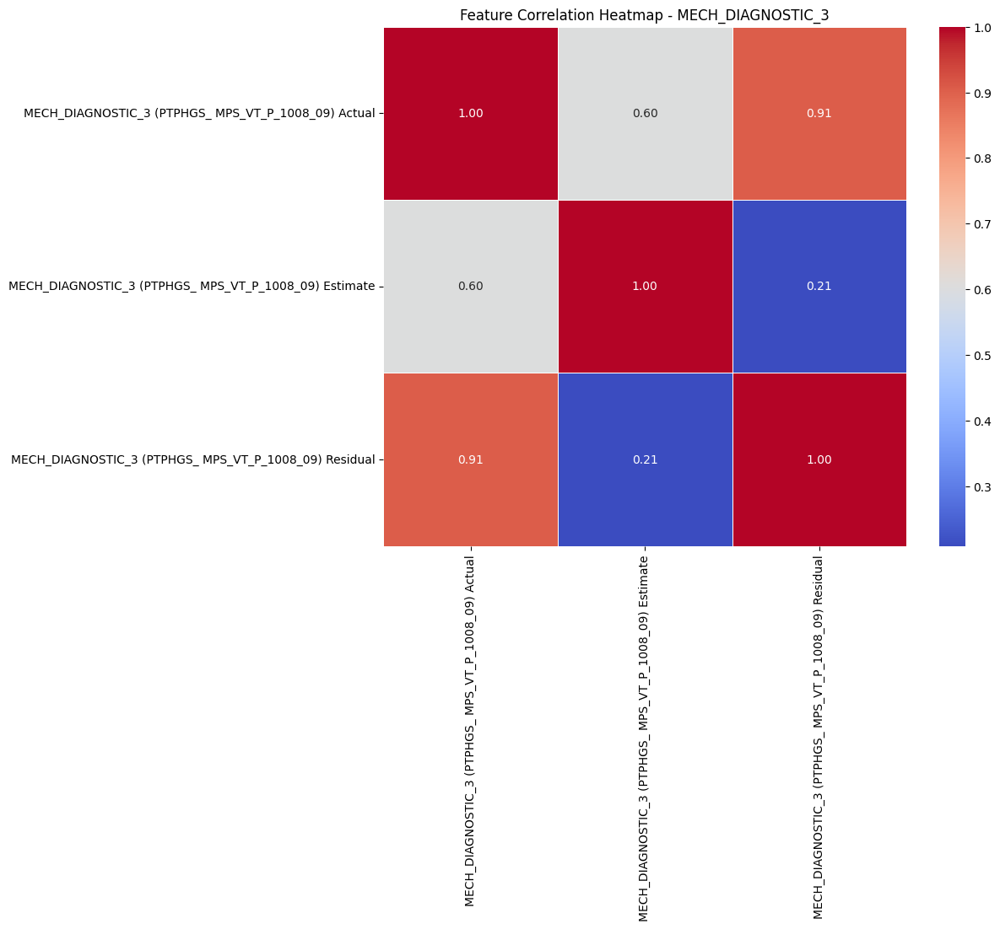

🚨 Highly Correlated Features (Correlation > 0.95) in MECH_DIAGNOSTIC_3: set()
✅ No highly correlated features found. No need to drop.

📊 Feature Correlation Analysis for: MECH_DIAGNOSTIC_4


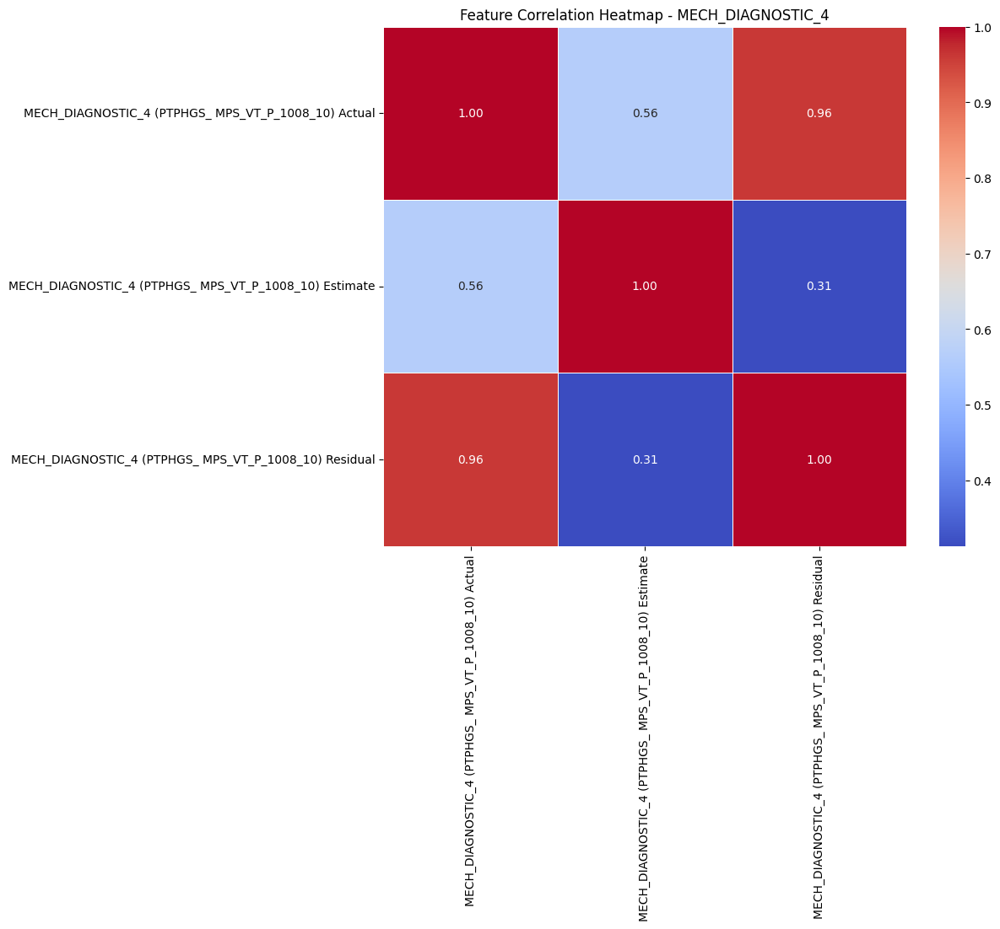

🚨 Highly Correlated Features (Correlation > 0.95) in MECH_DIAGNOSTIC_4: {'MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual'}
✅ Suggest removing {'MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual'} to reduce redundancy.


In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Analyze correlation in each dataset
for sheet, df in filtered_pump_data.items():
    print(f"\n📊 Feature Correlation Analysis for: {sheet}")

    # Select only numeric features
    numeric_df = df.select_dtypes(include=["number"])

    if numeric_df.shape[1] < 2:
        print("⚠ Not enough numeric features to analyze correlation. Skipping.")
        continue

    # Compute correlation matrix
    corr_matrix = numeric_df.corr()

    # Plot correlation heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title(f"Feature Correlation Heatmap - {sheet}")
    plt.show()

    # Identify highly correlated feature pairs (above 0.95)
    high_corr_features = set()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > 0.95:
                colname = corr_matrix.columns[i]
                high_corr_features.add(colname)

    print(f"🚨 Highly Correlated Features (Correlation > 0.95) in {sheet}: {high_corr_features}")

    # Decide if we need to drop any of these
    if high_corr_features:
        print(f"✅ Suggest removing {high_corr_features} to reduce redundancy.")
    else:
        print("✅ No highly correlated features found. No need to drop.")


#### Remove Outliers

In [23]:
# from scipy import stats
# import numpy as np

# # Improved Outlier Removal Function
# def remove_outliers(df):
#     """Remove outliers from normal cases using Z-score threshold (3 standard deviations)."""
    
#     # Identify sensor columns dynamically (Only 'Actual', 'Estimate', 'Residual' values)
#     sensor_columns = [col for col in df.columns if any(x in col.lower() for x in ["actual", "estimate", "residual"])]
    
#     # Identify Diagnostic Advisory Indication column
#     diag_col = next((col for col in df.columns if "Diagnostic Advisory Indication" in col), None)
    
#     if diag_col and not df.empty:
#         # Separate normal & failure cases
#         normal_df = df[df[diag_col] == "No Failure Indication"].copy()
#         failure_df = df[df[diag_col] != "No Failure Indication"].copy()

#         # Ensure numeric data for Z-score computation
#         normal_df[sensor_columns] = normal_df[sensor_columns].apply(pd.to_numeric, errors='coerce')

#         # Apply outlier removal using Z-score threshold of 3
#         z_scores = np.abs(stats.zscore(normal_df[sensor_columns], nan_policy='omit'))
#         normal_df_cleaned = normal_df[(z_scores < 3).all(axis=1)]

#         # Merge back cleaned normal cases with untouched failure cases
#         cleaned_df = pd.concat([normal_df_cleaned, failure_df], ignore_index=True)
        
#         # Print outlier removal stats
#         removed_count = len(normal_df) - len(normal_df_cleaned)
#         print(f"✔ Removed {removed_count} outliers ({(removed_count / len(df)) * 100:.2f}%) from '{diag_col}' normal cases.")
        
#         return cleaned_df

#     return df  # Return original data if no diagnostic column is found

# # Apply outlier removal on each cleaned sheet
# for sheet, df in filtered_pump_data.items():
#     print(f"\n📌 Processing {sheet} - Initial shape: {df.shape}")
#     filtered_pump_data[sheet] = remove_outliers(df)
#     print(f"🚀 Final shape after outlier removal: {filtered_pump_data[sheet].shape}")
#     print("=" * 50)


In [24]:
import pandas as pd
import numpy as np
from scipy import stats

def remove_outliers(filtered_pump_data):
    """Combines Z-score and IQR to remove extreme outliers (only for normal cases)."""
    updated_data = {}  # Store cleaned DataFrames
    
    for sheet, df in filtered_pump_data.items():
        print(f"📌 Removing outliers for {sheet} - Initial shape: {df.shape}")

        # Identify sensor columns
        sensor_cols = [col for col in df.columns if any(x in col for x in ["Actual", "Estimate", "Residual"])]

        diag_col = next((col for col in df.columns if "Diagnostic Advisory Indication" in col), None)
        if diag_col:
            # Separate normal & failure cases
            normal_df = df[df[diag_col] == "No Failure Indication"].copy()
            failure_df = df[df[diag_col] != "No Failure Indication"].copy()  # Keep failure cases intact

            # **Apply Z-score Outlier Removal**
            z_scores = np.abs(stats.zscore(normal_df[sensor_cols]))
            normal_df = normal_df[(z_scores < 3).all(axis=1)]  # Keep only inliers

            # **Apply IQR Outlier Removal**
            Q1 = normal_df[sensor_cols].quantile(0.25)
            Q3 = normal_df[sensor_cols].quantile(0.75)
            IQR = Q3 - Q1
            condition = ~((normal_df[sensor_cols] < (Q1 - 1.5 * IQR)) | (normal_df[sensor_cols] > (Q3 + 1.5 * IQR))).any(axis=1)
            normal_df = normal_df[condition]

            # **Merge back cleaned normal cases with failure cases**
            df = pd.concat([normal_df, failure_df]).reset_index(drop=True)

        # Store updated DataFrame
        updated_data[sheet] = df
        
        print(f"✅ Outliers removed for {sheet} - Final shape: {df.shape}")
        print("=" * 50)

    return updated_data  # Return updated dictionary with cleaned DataFrames

# **Apply outlier removal only once (No unnecessary loop)**
filtered_pump_data = remove_outliers(filtered_pump_data)


📌 Removing outliers for PUMP_DE_BRG_MTL_TEMP_1 - Initial shape: (77134, 6)
✅ Outliers removed for PUMP_DE_BRG_MTL_TEMP_1 - Final shape: (76751, 6)
📌 Removing outliers for PUMP_NDE_BRG_MTL_TEMP_1 - Initial shape: (77134, 6)
✅ Outliers removed for PUMP_NDE_BRG_MTL_TEMP_1 - Final shape: (76343, 6)
📌 Removing outliers for MECH_DIAGNOSTIC_1 - Initial shape: (77134, 6)
✅ Outliers removed for MECH_DIAGNOSTIC_1 - Final shape: (76701, 6)
📌 Removing outliers for MECH_DIAGNOSTIC_2 - Initial shape: (77134, 6)
✅ Outliers removed for MECH_DIAGNOSTIC_2 - Final shape: (76552, 6)
📌 Removing outliers for MECH_DIAGNOSTIC_3 - Initial shape: (77134, 6)
✅ Outliers removed for MECH_DIAGNOSTIC_3 - Final shape: (72202, 6)
📌 Removing outliers for MECH_DIAGNOSTIC_4 - Initial shape: (77134, 6)
✅ Outliers removed for MECH_DIAGNOSTIC_4 - Final shape: (73949, 6)


#### Data Normalization

In [25]:
# # Data Normalization / Standardization
# def transform_data(df, method="standard"):
#     """Normalize or standardize sensor data based on the chosen method."""
#     sensor_columns = [col for col in df.columns if any(x in col for x in ["Actual", "Estimate", "Residual"])]

#     if method == "minmax":
#         scaler = MinMaxScaler()
#     else:  # Default to StandardScaler
#         scaler = StandardScaler()

#     df[sensor_columns] = scaler.fit_transform(df[sensor_columns])

#     print(f"✔ {method.capitalize()} Scaling Applied.")
#     return df

In [26]:
# # Apply Processing on Each Sheet
# for sheet, df in filtered_pump_data.items():
#     print(f"\n📌 Processing: {sheet}")
#     # Step 2: Choose Scaling Method
#     df = transform_data(df, method="standard")  # Change to "minmax" if needed
#     # Store processed data
#     filtered_pump_data[sheet] = df

### EDA After Cleaning

#### Check Data Head, Info, Description

In [27]:
# Exploratory Data Analysis (EDA)
for sheet, df in filtered_pump_data.items():
    print(f"\nEDA for {sheet}")
    display(df.head())
    print("-" * 50)


EDA for PUMP_DE_BRG_MTL_TEMP_1


,Observation Date (UTC+07:00),PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Advisory Indication,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication
0,2024-11-01 13:26:54,64.998856,51.558433,13.440422,Normal,No Failure Indication
1,2024-11-01 13:27:54,64.998856,50.795694,14.203162,Normal,No Failure Indication
2,2024-11-01 13:28:54,64.998856,50.796665,14.202191,Normal,No Failure Indication
3,2024-11-01 13:29:56,64.998856,50.796373,14.202483,Normal,No Failure Indication
4,2024-11-01 13:30:54,64.998856,50.795702,14.203154,Normal,No Failure Indication


--------------------------------------------------

EDA for PUMP_NDE_BRG_MTL_TEMP_1


,Observation Date (UTC+07:00),PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Advisory Indication,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Diagnostic Advisory Indication
0,2024-11-01 13:26:54,63.998627,53.149672,10.848955,Normal,No Failure Indication
1,2024-11-01 13:27:54,63.998627,49.804541,14.194086,Normal,No Failure Indication
2,2024-11-01 13:28:54,63.998627,49.804477,14.194150,Normal,No Failure Indication
3,2024-11-01 13:29:56,63.998627,49.804496,14.194131,Normal,No Failure Indication
4,2024-11-01 13:30:54,63.998627,49.804540,14.194087,Normal,No Failure Indication


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_1


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Advisory Indication,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Diagnostic Advisory Indication
0,2024-12-20 17:11:18,0.031487,0.032727,-0.001240,Normal,No Failure Indication
1,2024-12-20 17:12:18,0.031487,0.032725,-0.001238,Normal,No Failure Indication
2,2024-12-22 11:55:19,0.037209,0.035843,0.001366,Normal,No Failure Indication
3,2024-12-22 11:56:19,0.037209,0.035843,0.001366,Normal,No Failure Indication
4,2024-12-22 11:57:19,0.037209,0.035841,0.001368,Normal,No Failure Indication


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_2


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Advisory Indication,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Diagnostic Advisory Indication
0,2024-12-15 11:33:37,0.066789,0.054675,0.012114,Normal,No Failure Indication
1,2024-12-15 11:35:14,0.066789,0.054675,0.012114,Normal,No Failure Indication
2,2024-12-15 11:36:11,0.066789,0.054675,0.012114,Normal,No Failure Indication
3,2024-12-15 11:37:12,0.066789,0.054675,0.012114,Normal,No Failure Indication
4,2024-12-15 11:38:12,0.065835,0.054045,0.011790,Normal,No Failure Indication


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_3


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Advisory Indication,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Diagnostic Advisory Indication
0,2024-11-01 13:26:54,0.041978,0.041682,0.000296,Normal,No Failure Indication
1,2024-11-01 13:37:54,0.043893,0.042685,0.001207,Normal,No Failure Indication
2,2024-11-01 13:38:54,0.043893,0.042685,0.001207,Normal,No Failure Indication
3,2024-11-01 13:39:57,0.043893,0.042685,0.001207,Normal,No Failure Indication
4,2024-11-01 13:40:54,0.043893,0.042685,0.001207,Normal,No Failure Indication


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_4


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Estimate,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Advisory Indication,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Diagnostic Advisory Indication
0,2024-11-01 14:48:54,0.051522,0.046828,0.004694,Normal,No Failure Indication
1,2024-11-01 14:49:56,0.051522,0.046828,0.004694,Normal,No Failure Indication
2,2024-11-01 14:50:54,0.051522,0.046828,0.004694,Normal,No Failure Indication
3,2024-11-01 14:51:54,0.051522,0.046828,0.004694,Normal,No Failure Indication
4,2024-11-01 14:52:54,0.051522,0.046827,0.004695,Normal,No Failure Indication


--------------------------------------------------


In [28]:
# Exploratory Data Analysis (EDA)
for sheet, df in filtered_pump_data.items():
    print(f"\nEDA for {sheet}")
    display(df.info())
    print("-" * 50)


EDA for PUMP_DE_BRG_MTL_TEMP_1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76751 entries, 0 to 76750
Data columns (total 6 columns):
 #   Column                                                                               Non-Null Count  Dtype         
---  ------                                                                               --------------  -----         
 0   Observation Date (UTC+07:00)                                                         76751 non-null  datetime64[ns]
 1   PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual                          76751 non-null  float64       
 2   PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate                        76751 non-null  float64       
 3   PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual                        76751 non-null  float64       
 4   PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Advisory Indication             76751 non-null  object        
 5   PUMP_DE_

None

--------------------------------------------------

EDA for PUMP_NDE_BRG_MTL_TEMP_1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76343 entries, 0 to 76342
Data columns (total 6 columns):
 #   Column                                                                                Non-Null Count  Dtype         
---  ------                                                                                --------------  -----         
 0   Observation Date (UTC+07:00)                                                          76343 non-null  datetime64[ns]
 1   PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual                          76343 non-null  float64       
 2   PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate                        76343 non-null  float64       
 3   PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual                        76343 non-null  float64       
 4   PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Advisory Indicati

None

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76701 entries, 0 to 76700
Data columns (total 6 columns):
 #   Column                                                                       Non-Null Count  Dtype         
---  ------                                                                       --------------  -----         
 0   Observation Date (UTC+07:00)                                                 76701 non-null  datetime64[ns]
 1   MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual                          76701 non-null  float64       
 2   MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate                        76701 non-null  float64       
 3   MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual                        76701 non-null  float64       
 4   MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Advisory Indication             76701 non-null  object        
 5   MECH_DIAGNOSTIC_1 

None

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_2
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76552 entries, 0 to 76551
Data columns (total 6 columns):
 #   Column                                                                       Non-Null Count  Dtype         
---  ------                                                                       --------------  -----         
 0   Observation Date (UTC+07:00)                                                 76552 non-null  datetime64[ns]
 1   MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual                          76552 non-null  float64       
 2   MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate                        76552 non-null  float64       
 3   MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual                        76552 non-null  float64       
 4   MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Advisory Indication             76552 non-null  object        
 5   MECH_DIAGNOSTIC_2 

None

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_3
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72202 entries, 0 to 72201
Data columns (total 6 columns):
 #   Column                                                                       Non-Null Count  Dtype         
---  ------                                                                       --------------  -----         
 0   Observation Date (UTC+07:00)                                                 72202 non-null  datetime64[ns]
 1   MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual                          72202 non-null  float64       
 2   MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate                        72202 non-null  float64       
 3   MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual                        72202 non-null  float64       
 4   MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Advisory Indication             72202 non-null  object        
 5   MECH_DIAGNOSTIC_3 

None

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73949 entries, 0 to 73948
Data columns (total 6 columns):
 #   Column                                                                       Non-Null Count  Dtype         
---  ------                                                                       --------------  -----         
 0   Observation Date (UTC+07:00)                                                 73949 non-null  datetime64[ns]
 1   MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual                          73949 non-null  float64       
 2   MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Estimate                        73949 non-null  float64       
 3   MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual                        73949 non-null  float64       
 4   MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Advisory Indication             73949 non-null  object        
 5   MECH_DIAGNOSTIC_4 

None

--------------------------------------------------


In [29]:
# Exploratory Data Analysis (EDA)
for sheet, df in filtered_pump_data.items():
    print(f"\nEDA for {sheet}")
    display(df.describe())
    print("-" * 50)


EDA for PUMP_DE_BRG_MTL_TEMP_1


,Observation Date (UTC+07:00),PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual
count,76751,76751.000000,76751.000000,76751.000000
mean,2024-11-29 02:18:35.616435200,55.953022,46.392136,9.560886
min,2024-11-01 13:26:54,33.998627,36.686503,-8.500242
25%,2024-11-14 22:20:48,46.999313,45.011848,1.648008
50%,2024-11-28 11:08:35,54.998856,47.022578,6.815943
75%,2024-12-11 18:56:07,64.998856,48.414153,17.986856
max,2024-12-31 10:42:13,78.999771,57.194394,30.951650
std,NaN,10.581715,3.342252,8.709615


--------------------------------------------------

EDA for PUMP_NDE_BRG_MTL_TEMP_1


,Observation Date (UTC+07:00),PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual
count,76343,76343.000000,76343.000000,76343.000000
mean,2024-11-28 22:18:28.346868992,49.472901,46.533137,2.939763
min,2024-11-01 13:26:54,32.998398,38.575562,-11.162303
25%,2024-11-14 20:45:48,42.998398,44.158908,-1.077745
50%,2024-11-28 06:59:35,46.999313,46.170746,1.340482
75%,2024-12-11 13:05:06,55.999084,49.374707,6.002801
max,2024-12-31 10:28:11,71.998169,56.784763,23.368148
std,NaN,8.450812,3.686070,5.636703


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_1


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual
count,76701,76701.000000,76701.000000,76701.000000
mean,2024-11-29 00:55:38.328822272,0.057714,0.038064,0.019650
min,2024-11-01 13:26:54,0.000000,0.025982,-0.029271
25%,2024-11-14 21:32:18,0.054383,0.037122,0.016176
50%,2024-11-28 09:15:34,0.059159,0.038768,0.020260
75%,2024-12-11 16:50:36,0.063928,0.039424,0.024548
max,2024-12-31 10:42:13,0.088739,0.044180,0.048775
std,NaN,0.010248,0.002624,0.008222


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_2


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual
count,76552,76552.000000,76552.000000,76552.000000
mean,2024-11-28 23:34:54.181706752,0.083185,0.057562,0.025623
min,2024-11-01 13:26:54,0.000000,0.048599,-0.049547
25%,2024-11-14 20:56:03,0.081102,0.056037,0.022699
50%,2024-11-28 08:02:04.500000,0.084916,0.058249,0.027181
75%,2024-12-11 14:59:51,0.088739,0.059138,0.030696
max,2024-12-31 10:42:13,0.104959,0.074994,0.046251
std,NaN,0.009218,0.002178,0.008170


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_3


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual
count,72202,72202.000000,72202.000000,72202.000000
mean,2024-11-27 15:58:15.834436608,0.035293,0.041631,-0.006338
min,2024-11-01 13:26:54,0.000000,0.033227,-0.035549
25%,2024-11-14 07:30:33,0.031487,0.040767,-0.008889
50%,2024-11-27 00:51:04.500000,0.035302,0.041681,-0.006570
75%,2024-12-09 16:25:21,0.039117,0.042766,-0.003608
max,2024-12-31 10:41:13,0.052476,0.047524,0.010749
std,NaN,0.004776,0.001821,0.003881


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_4


,Observation Date (UTC+07:00),MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Estimate,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual
count,73949,73949.000000,73949.000000,73949.000000
mean,2024-11-28 22:28:27.461060864,0.051496,0.046856,0.004640
min,2024-11-01 13:26:54,0.000000,0.041687,-0.043022
25%,2024-11-14 23:10:18,0.047707,0.046071,0.001574
50%,2024-11-28 08:55:35,0.051522,0.047043,0.003797
75%,2024-12-11 11:22:36,0.054383,0.047830,0.007150
max,2024-12-31 10:42:13,0.069650,0.056979,0.022232
std,NaN,0.004854,0.001397,0.004287


--------------------------------------------------


#### Check Missing Values

In [30]:
# Exploratory Data Analysis (EDA)
for sheet, df in filtered_pump_data.items():
    print(f"\nEDA for {sheet}")
    print("Missing Values:")
    display(df.isnull().sum())
    print("-" * 50)


EDA for PUMP_DE_BRG_MTL_TEMP_1
Missing Values:


Observation Date (UTC+07:00)                                                           0
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual                            0
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate                          0
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual                          0
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Advisory Indication               0
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication    0
dtype: int64

--------------------------------------------------

EDA for PUMP_NDE_BRG_MTL_TEMP_1
Missing Values:


Observation Date (UTC+07:00)                                                            0
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual                            0
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate                          0
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual                          0
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Advisory Indication               0
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Diagnostic Advisory Indication    0
dtype: int64

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_1
Missing Values:


Observation Date (UTC+07:00)                                                   0
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual                            0
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate                          0
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual                          0
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Advisory Indication               0
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Diagnostic Advisory Indication    0
dtype: int64

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_2
Missing Values:


Observation Date (UTC+07:00)                                                   0
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual                            0
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate                          0
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual                          0
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Advisory Indication               0
MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Diagnostic Advisory Indication    0
dtype: int64

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_3
Missing Values:


Observation Date (UTC+07:00)                                                   0
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual                            0
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate                          0
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual                          0
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Advisory Indication               0
MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Diagnostic Advisory Indication    0
dtype: int64

--------------------------------------------------

EDA for MECH_DIAGNOSTIC_4
Missing Values:


Observation Date (UTC+07:00)                                                   0
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual                            0
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Estimate                          0
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual                          0
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Advisory Indication               0
MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Diagnostic Advisory Indication    0
dtype: int64

--------------------------------------------------


In [31]:
for sheet, df in filtered_pump_data.items():
    print(f"\n📌 Processing sheet: {sheet}")

    # Dynamically identify the advisory column (excluding diagnostic)
    advisory_col = next((col for col in df.columns if "Advisory Indication" in col and "Diagnostic" not in col), None)
    # Identify the diagnostic advisory column
    diagnostic_col = next((col for col in df.columns if "Diagnostic Advisory Indication" in col), None)

    if advisory_col and diagnostic_col:
        # Filter rows where Diagnostic Advisory Indication is missing or empty
        missing_diag = df[(df[diagnostic_col].isna()) | (df[diagnostic_col].str.strip() == "")]
        if missing_diag.empty:
            print("✅ No missing Diagnostic Advisory Indication values found.")
        else:
            # Get unique Advisory Indication values for those rows
            unique_adv = missing_diag[advisory_col].dropna().unique()
            print(f"🔍 For rows with missing Diagnostic Advisory Indication in {sheet}, the unique Advisory Indication values are:")
            for adv in unique_adv:
                print(f" - {adv}")
    else:
        print("⚠ Required columns not found in this sheet.")



📌 Processing sheet: PUMP_DE_BRG_MTL_TEMP_1
✅ No missing Diagnostic Advisory Indication values found.

📌 Processing sheet: PUMP_NDE_BRG_MTL_TEMP_1
✅ No missing Diagnostic Advisory Indication values found.

📌 Processing sheet: MECH_DIAGNOSTIC_1
✅ No missing Diagnostic Advisory Indication values found.

📌 Processing sheet: MECH_DIAGNOSTIC_2
✅ No missing Diagnostic Advisory Indication values found.

📌 Processing sheet: MECH_DIAGNOSTIC_3
✅ No missing Diagnostic Advisory Indication values found.

📌 Processing sheet: MECH_DIAGNOSTIC_4
✅ No missing Diagnostic Advisory Indication values found.


#### Check Sensor Feature Distribution

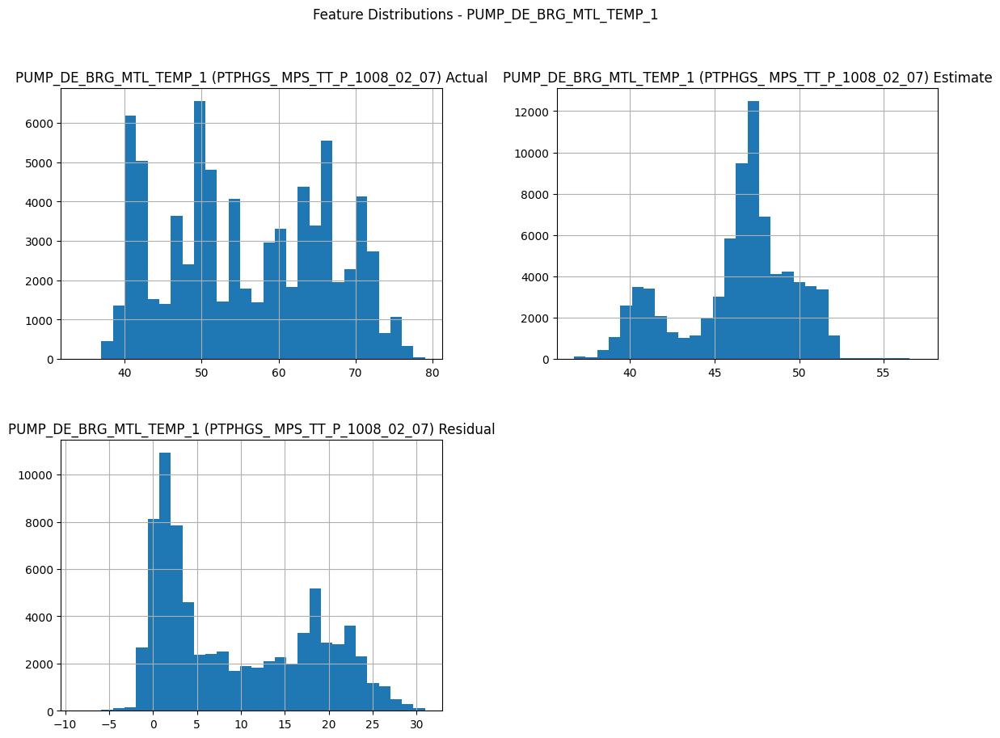

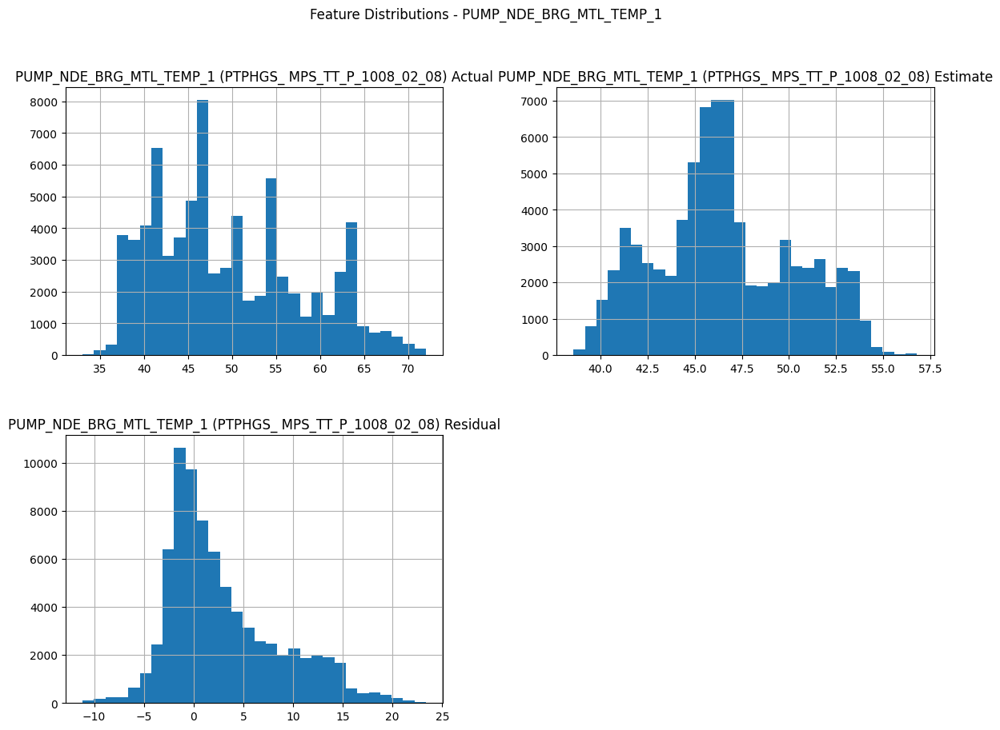

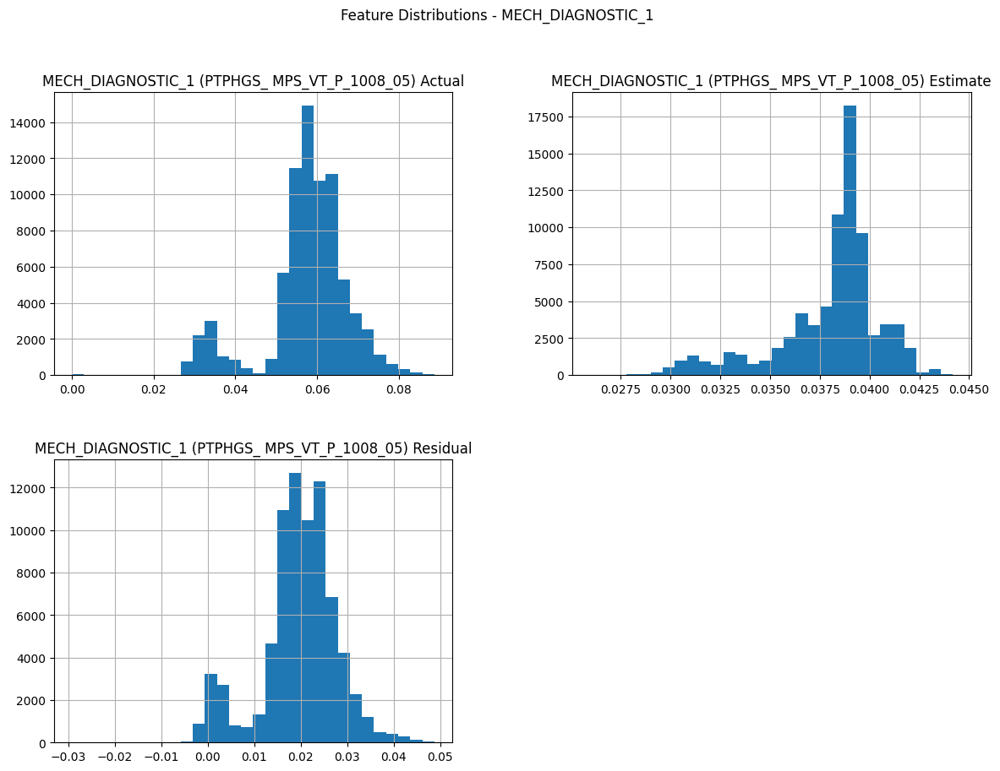

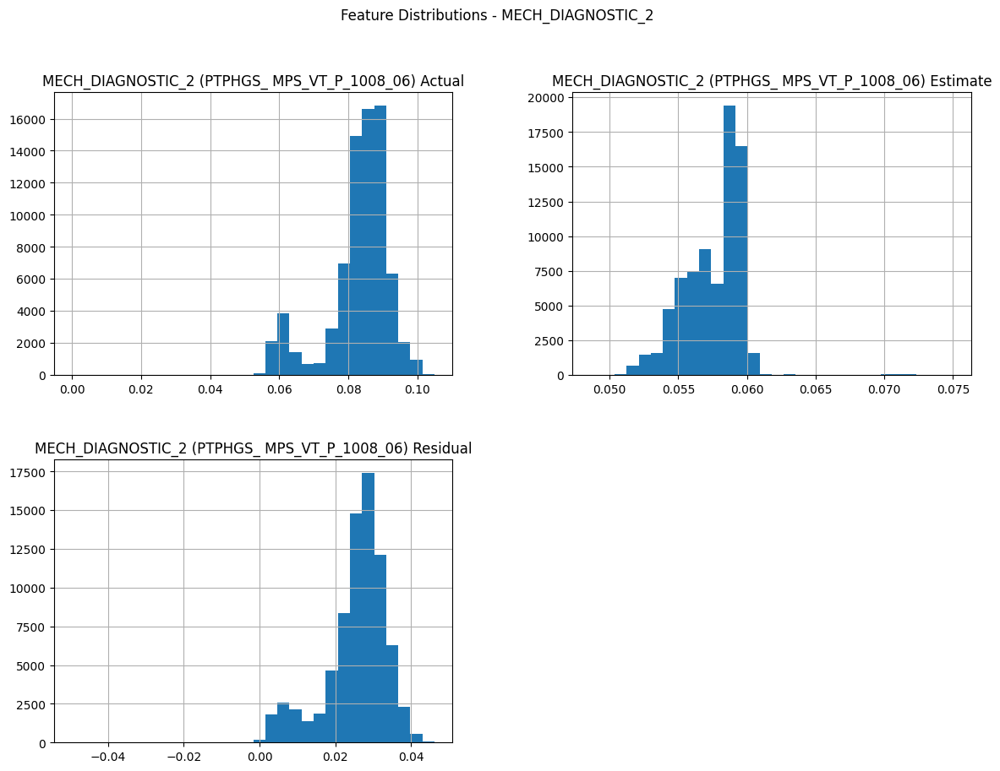

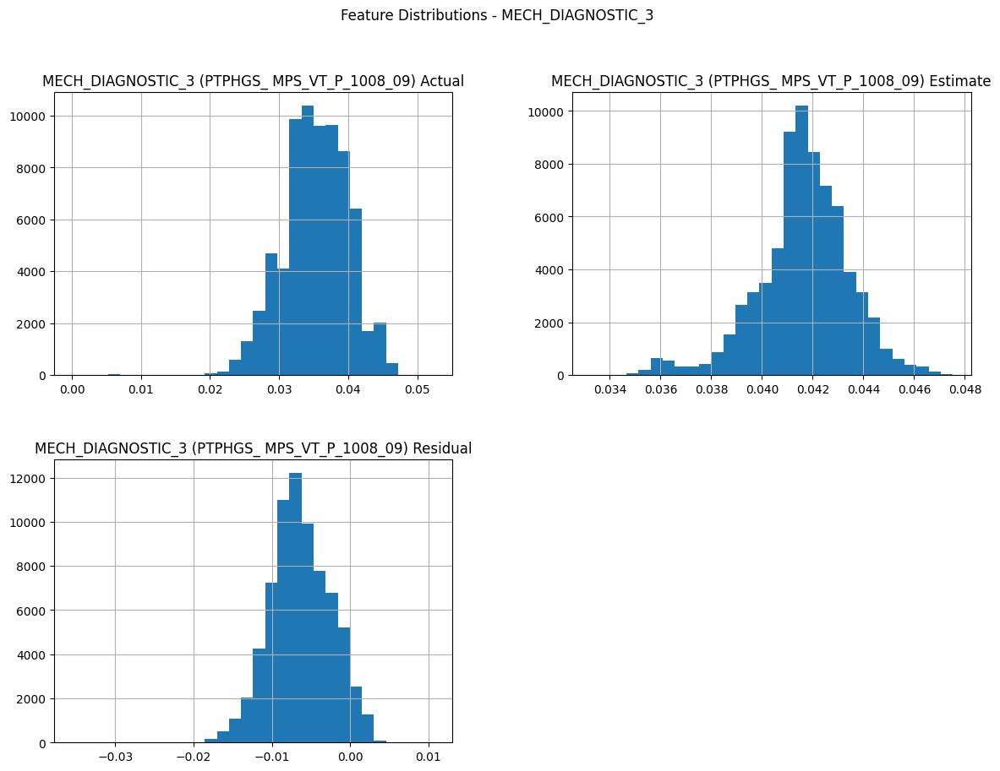

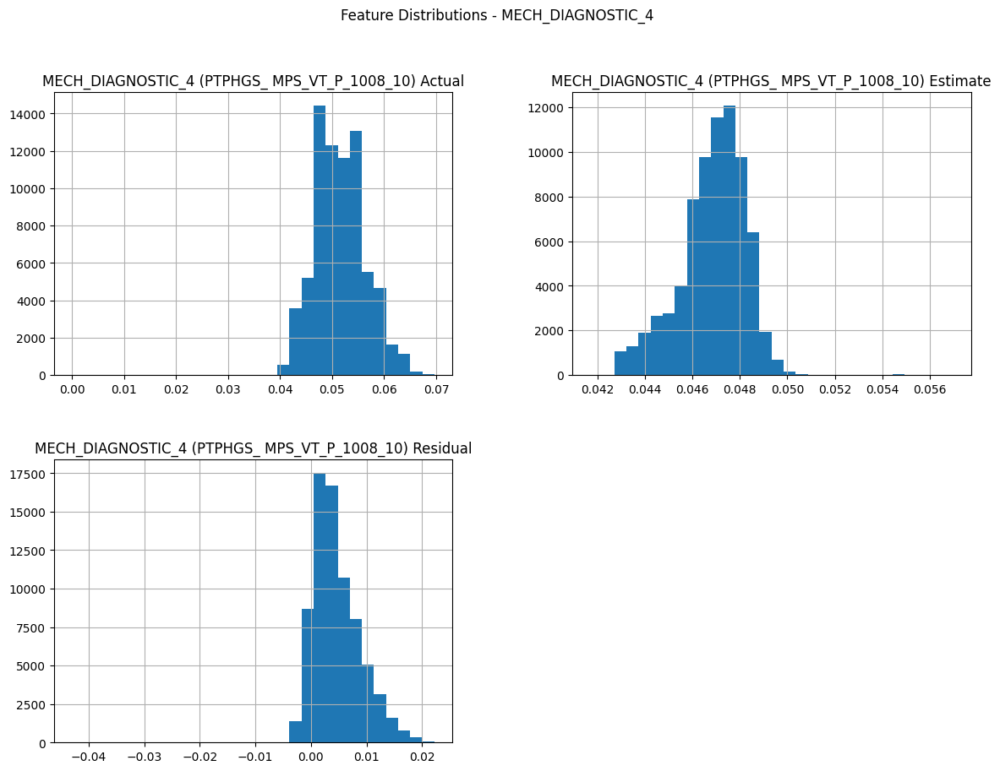

In [32]:
# Exploratory Data Analysis (EDA)
for sheet, df in filtered_pump_data.items():  
    # Visualizing distributions of sensor data
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    df[numeric_cols].hist(figsize=(14, 10), bins=30)
    plt.suptitle(f"Feature Distributions - {sheet}")
    plt.show()
    
    # Visualizing categorical variables
    if "Diagnostic Advisory Indication" in df.columns:
        plt.figure(figsize=(10, 5))
        sns.countplot(x=df["Diagnostic Advisory Indication"], palette="coolwarm")
        plt.title(f"Category Distribution - {sheet}")
        plt.xlabel("Diagnostic Advisory Indication")
        plt.ylabel("Count")
        plt.xticks(rotation=45)
        plt.show()

#### Check Diagnostic Categorical Variables

In [33]:
# Find categorical variables for Diagnostic Advisory Indication
for sheet, df in filtered_pump_data.items():
    diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
    if diag_col:
        diag_col = diag_col[0]  # Take the first match if multiple exist
        print(f"Sheet: {sheet} - Diagnostic Advisory Indication Counts")
        print(df[diag_col].value_counts())
        print("-" * 50)

Sheet: PUMP_DE_BRG_MTL_TEMP_1 - Diagnostic Advisory Indication Counts
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication
No Failure Indication                                   52112
Journal Bearing - Local Bearing  Problem Pump DE        23616
Early Failure Indication - High Sensor Reading Value     1023
Name: count, dtype: int64
--------------------------------------------------
Sheet: PUMP_NDE_BRG_MTL_TEMP_1 - Diagnostic Advisory Indication Counts
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Diagnostic Advisory Indication
No Failure Indication                                   74189
Journal Bearing - Local Bearing  Problem Pump NDE        1632
Early Failure Indication - High Sensor Reading Value      522
Name: count, dtype: int64
--------------------------------------------------
Sheet: MECH_DIAGNOSTIC_1 - Diagnostic Advisory Indication Counts
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Diagnostic Advisory Indication
Mechanical - Equipment 

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3812025956.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[diag_col], palette="coolwarm")


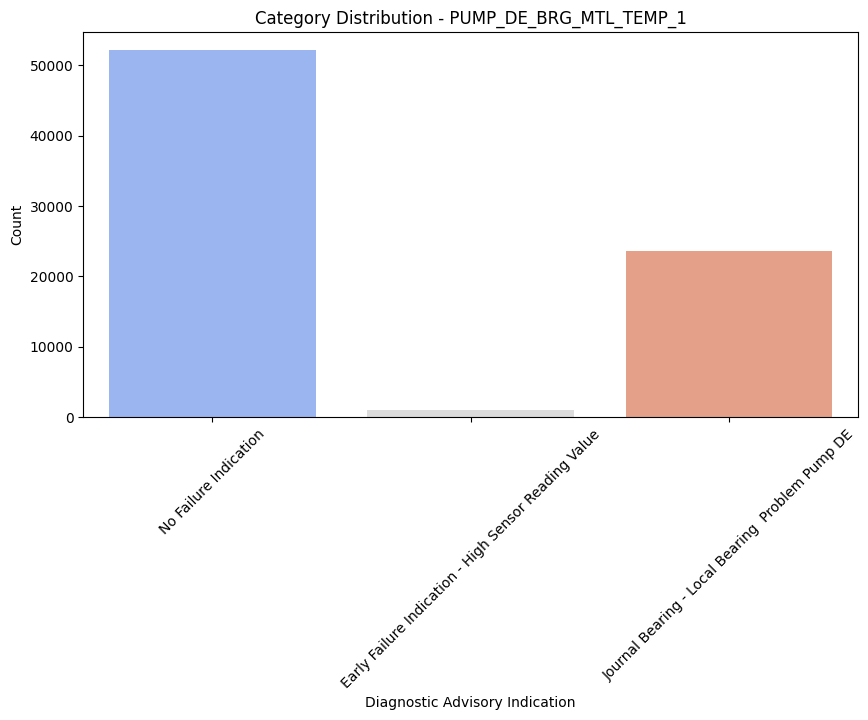

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3812025956.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[diag_col], palette="coolwarm")


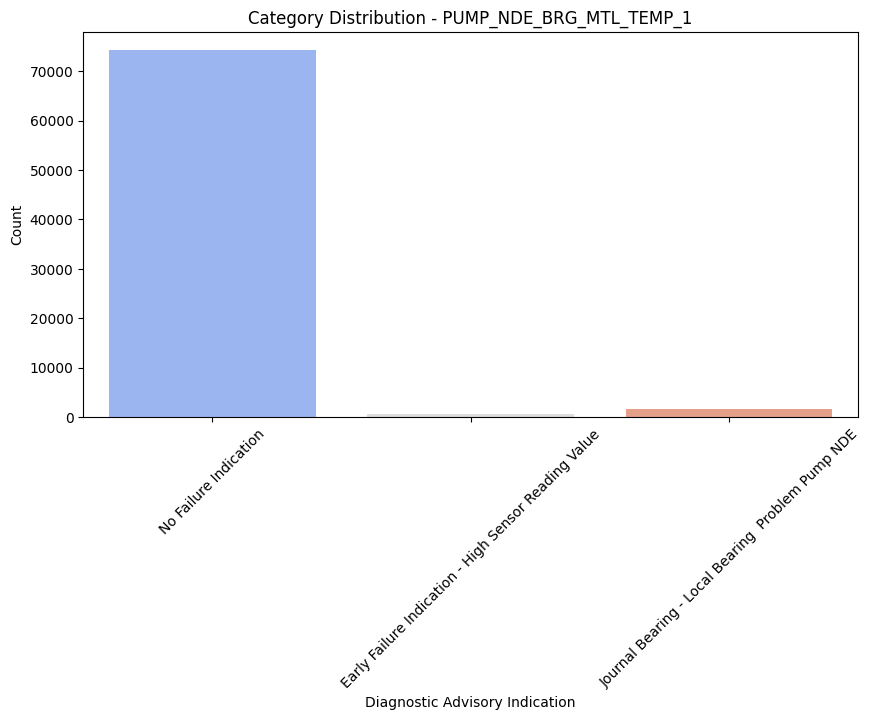

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3812025956.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[diag_col], palette="coolwarm")


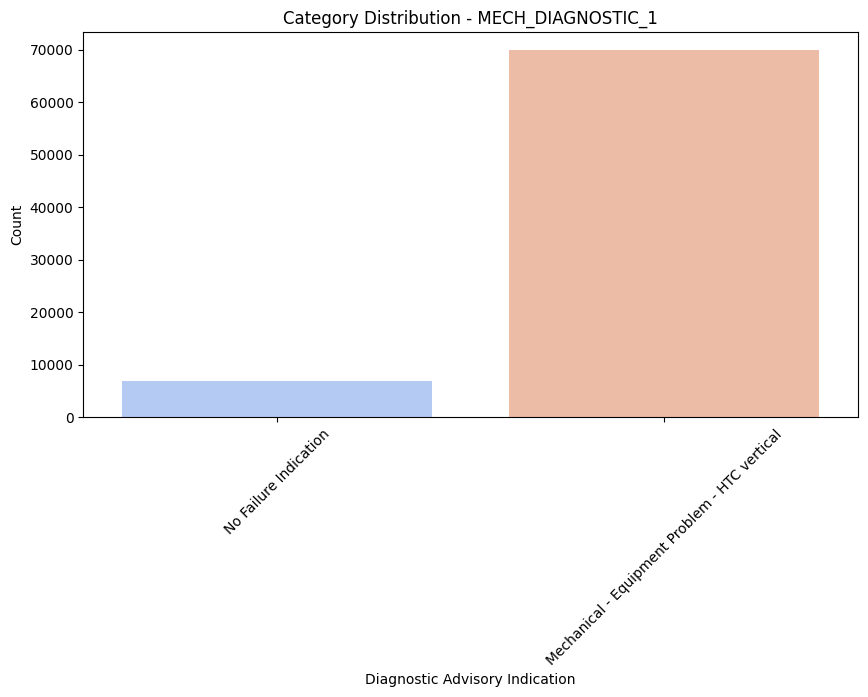

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3812025956.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[diag_col], palette="coolwarm")


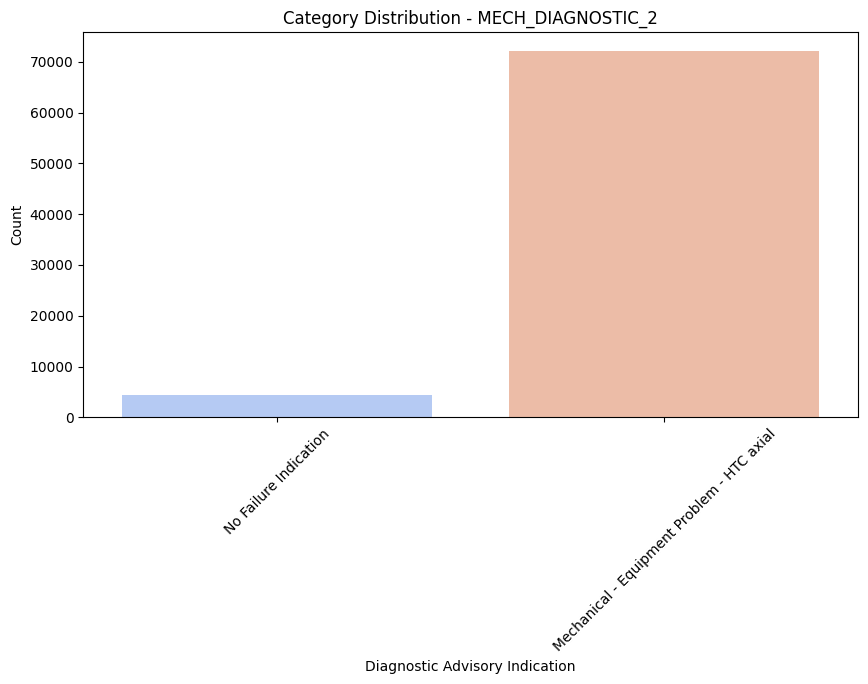

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3812025956.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[diag_col], palette="coolwarm")


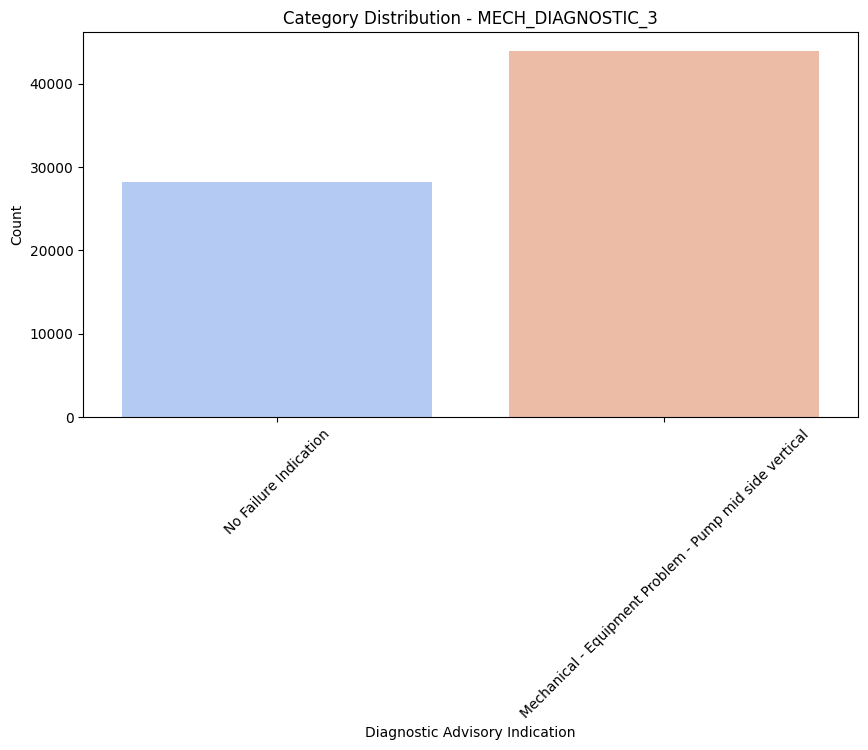

C:\Users\HP OMEN\AppData\Local\Temp\ipykernel_6636\3812025956.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[diag_col], palette="coolwarm")


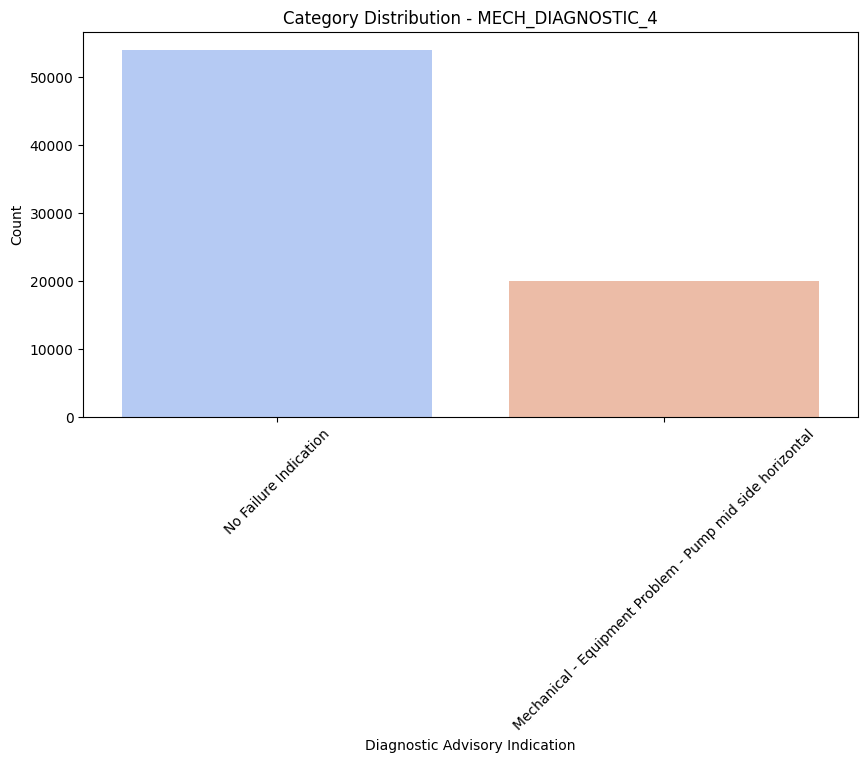

In [34]:
# Exploratory Data Analysis (EDA)
for sheet, df in filtered_pump_data.items():
    diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
    
    if diag_col:
        diag_col = diag_col[0]  # Take the first match if multiple exist
        plt.figure(figsize=(10, 5))
        sns.countplot(x=df[diag_col], palette="coolwarm")
        plt.title(f"Category Distribution - {sheet}")
        plt.xlabel("Diagnostic Advisory Indication")
        plt.ylabel("Count")
        plt.xticks(rotation=45)
        plt.show()


#### Time-Series Visualization After Cleaning

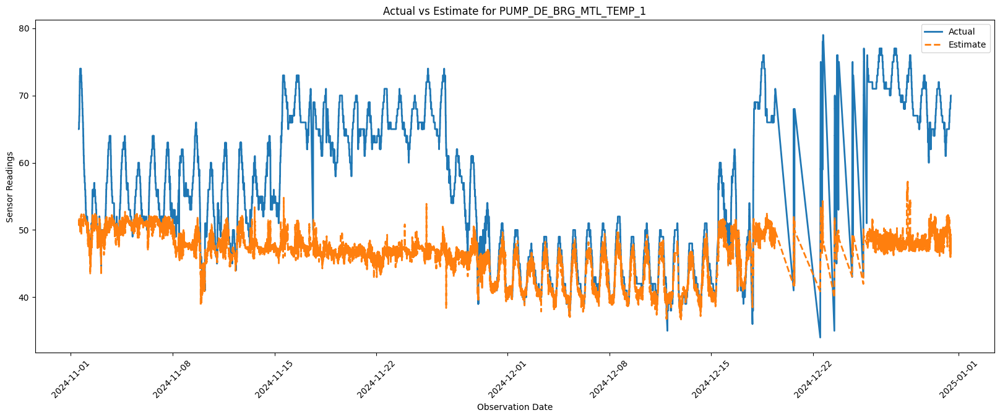

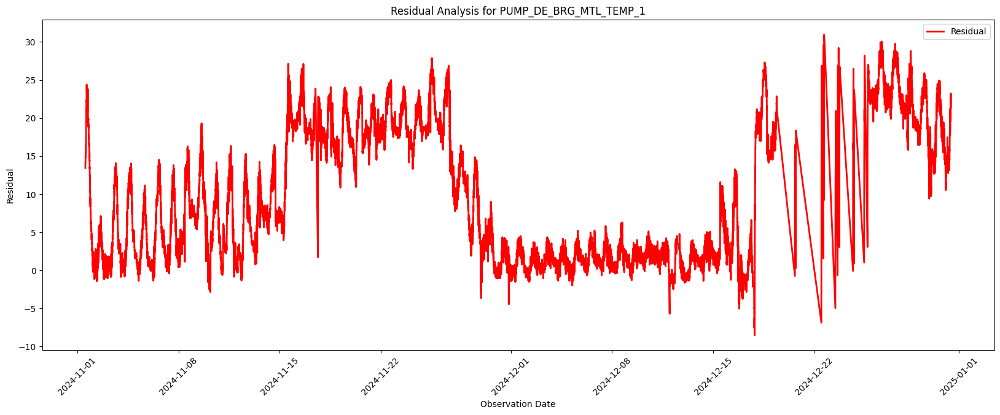

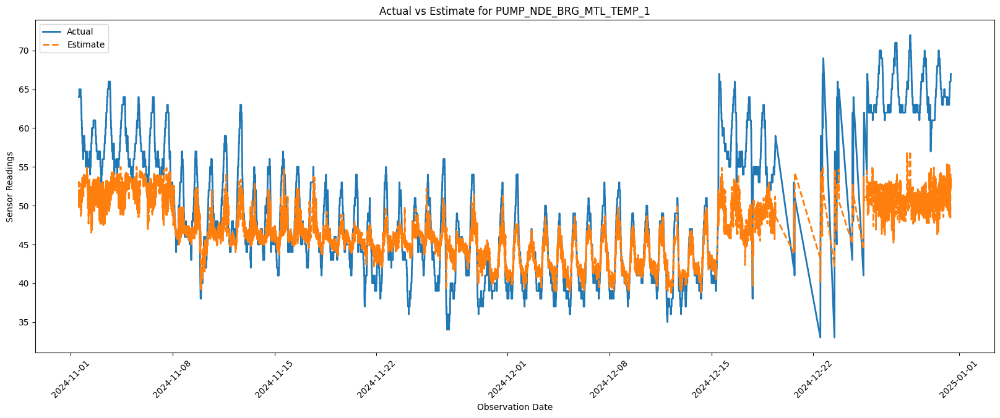

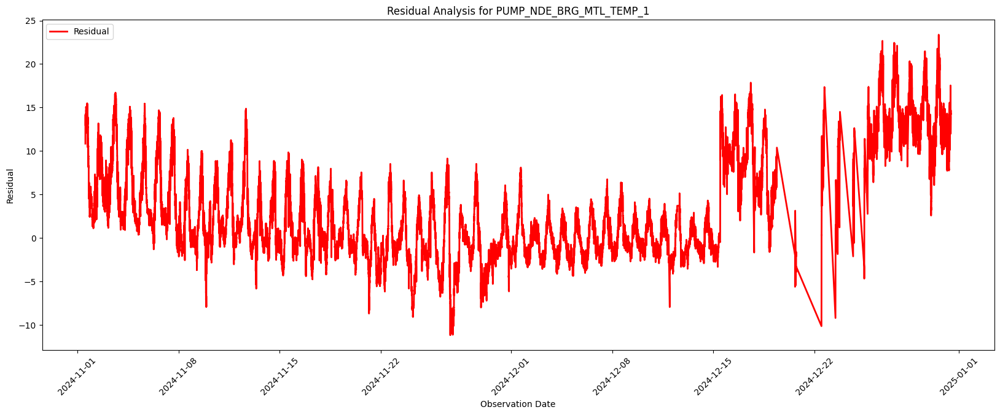

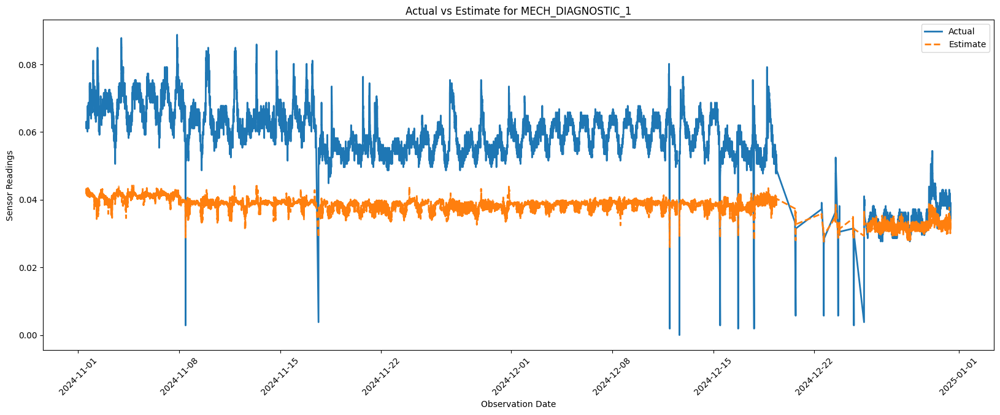

...

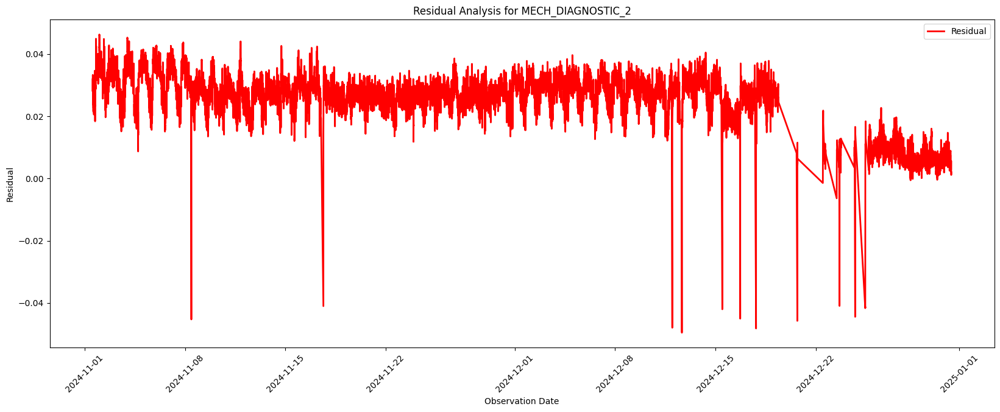

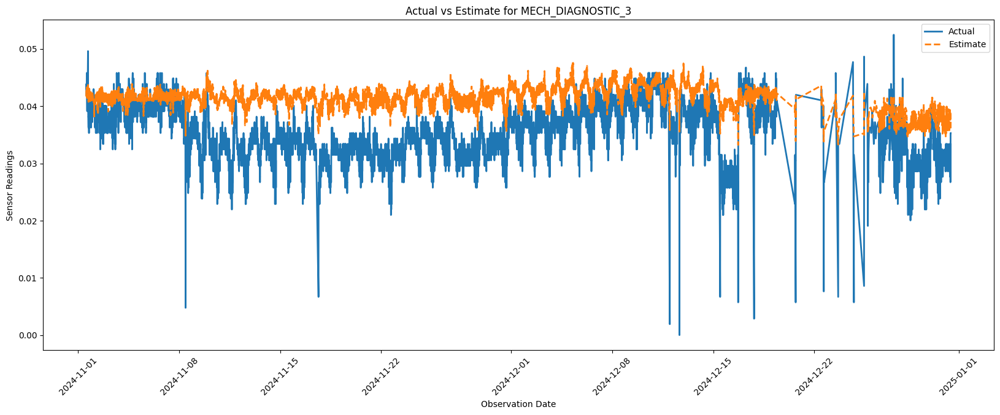

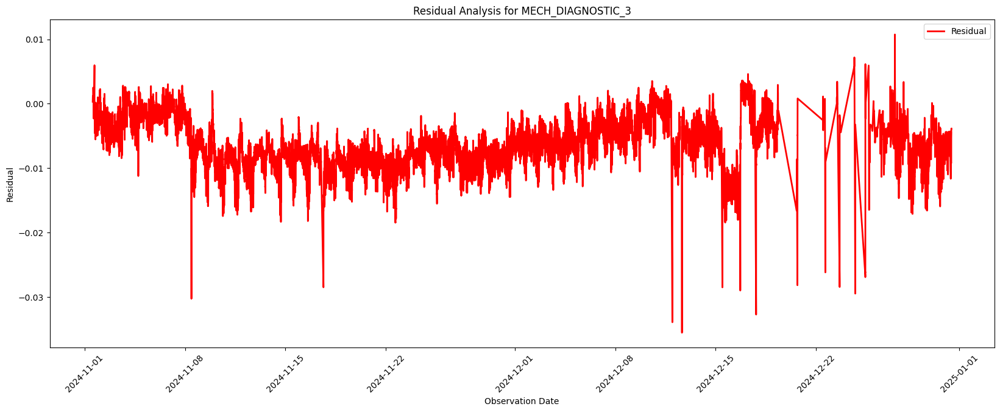

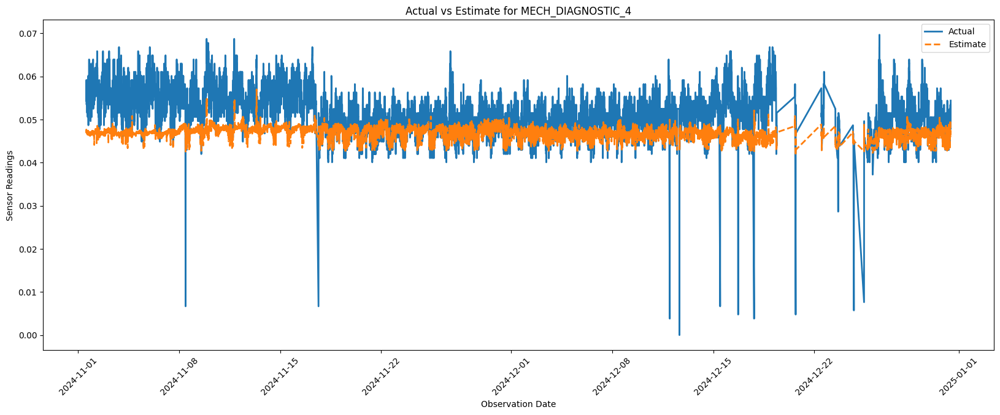

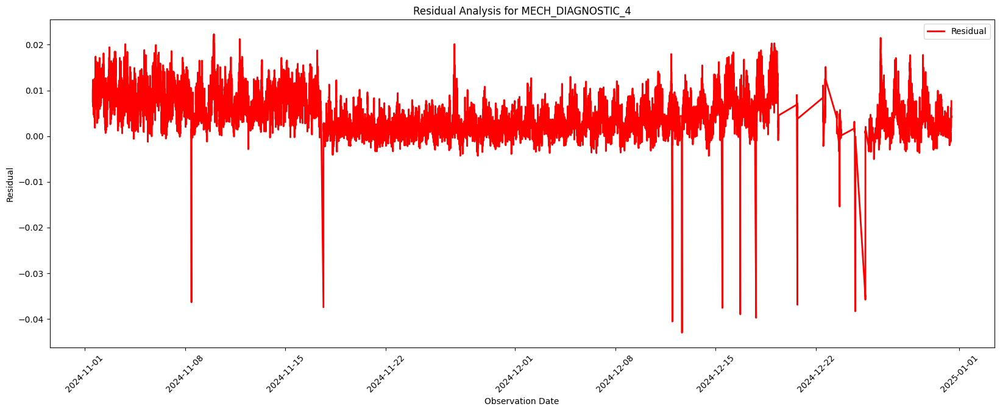

EDA after cleaning completed.


In [35]:
# Time-Series Visualization after cleaning
for sheet, df in filtered_pump_data.items():
    if "Observation Date (UTC+07:00)" in df.columns:
        df["Observation Date (UTC+07:00)"] = pd.to_datetime(df["Observation Date (UTC+07:00)"], errors='coerce')

        # Ensure Data is Sorted by Date
        df = df.sort_values("Observation Date (UTC+07:00)").reset_index(drop=True)
        
        # Identify correct columns dynamically
        actual_col = [col for col in df.columns if "Actual" in col][0]
        estimate_col = [col for col in df.columns if "Estimate" in col][0]
        residual_col = [col for col in df.columns if "Residual" in col][0]

        # Plot Actual vs Estimate
        plt.figure(figsize=(20, 7))
        plt.plot(df["Observation Date (UTC+07:00)"], df[actual_col], label="Actual", linewidth=2)
        plt.plot(df["Observation Date (UTC+07:00)"], df[estimate_col], linestyle='dashed', label="Estimate", linewidth=2)
        plt.xlabel("Observation Date")
        plt.ylabel("Sensor Readings")
        plt.title(f"Actual vs Estimate for {sheet}")
        plt.legend()
        plt.xticks(rotation=45)
        plt.show()

        # Plot Residuals
        plt.figure(figsize=(20, 7))
        plt.plot(df["Observation Date (UTC+07:00)"], df[residual_col], label="Residual", color='red', linewidth=2)
        plt.xlabel("Observation Date")
        plt.ylabel("Residual")
        plt.title(f"Residual Analysis for {sheet}")
        plt.legend()
        plt.xticks(rotation=45)
        plt.show()

print("EDA after cleaning completed.")


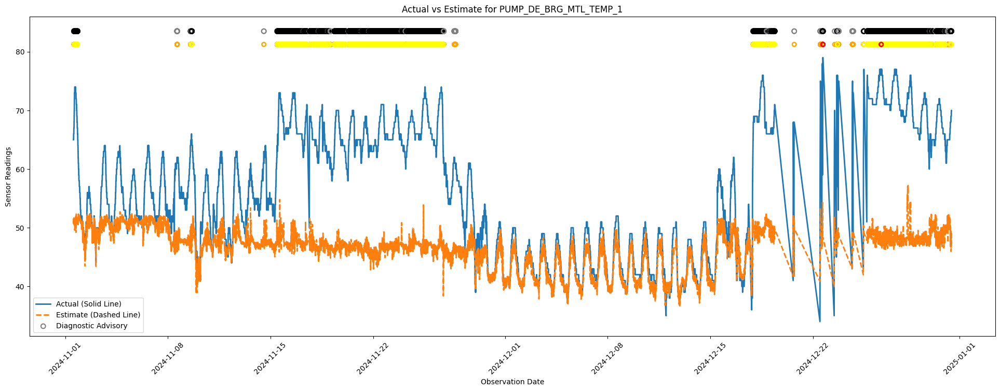

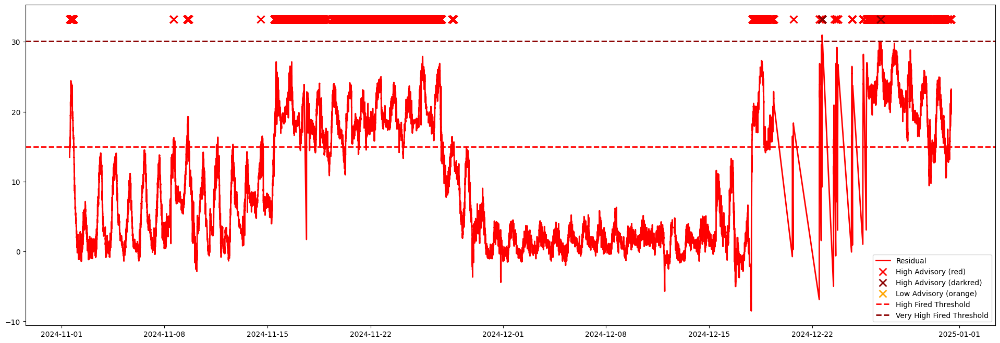

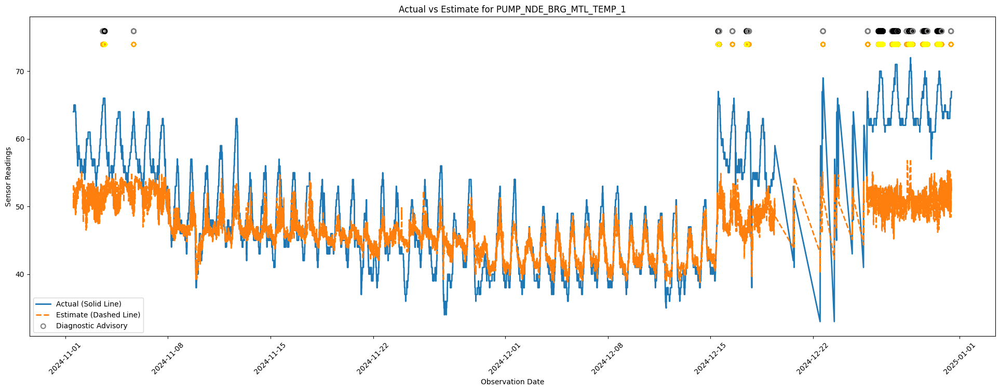

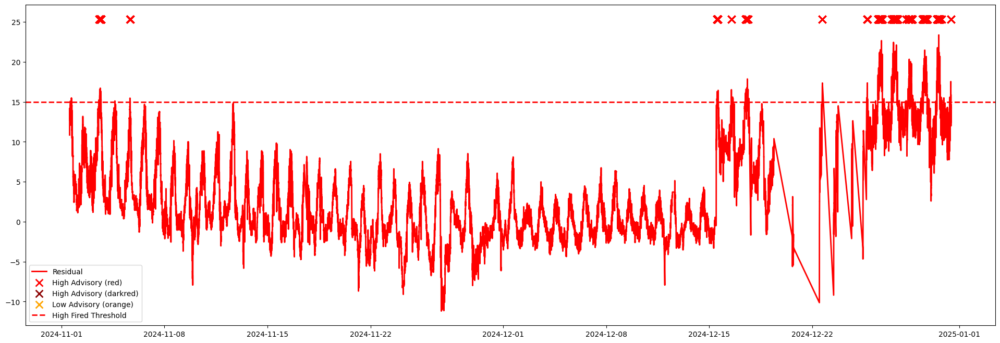

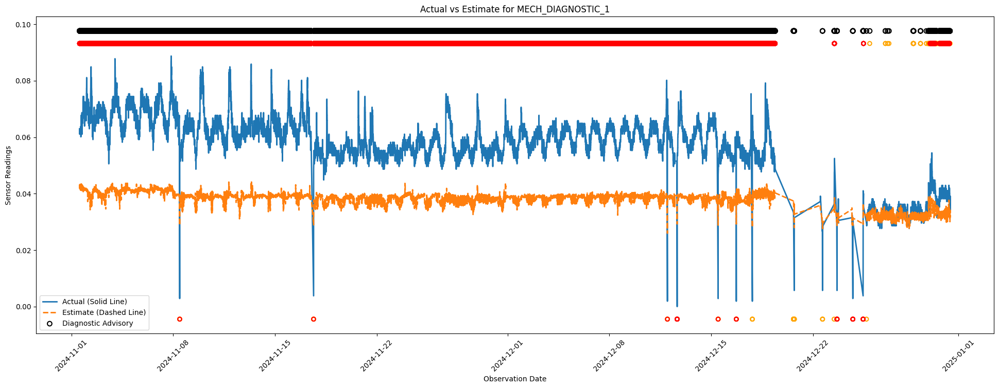

...

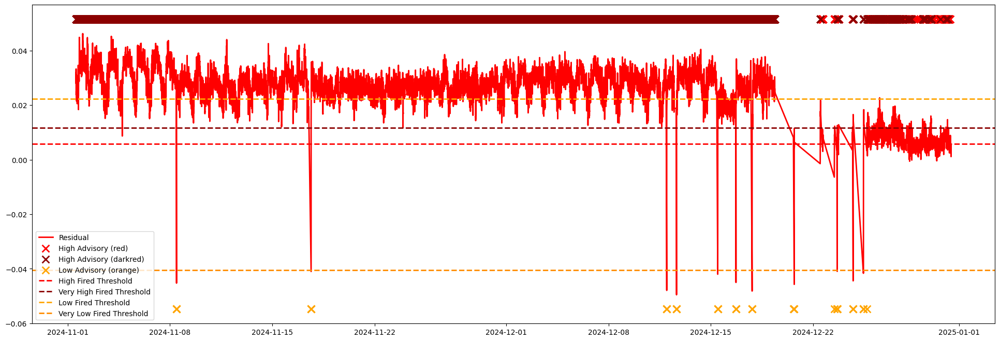

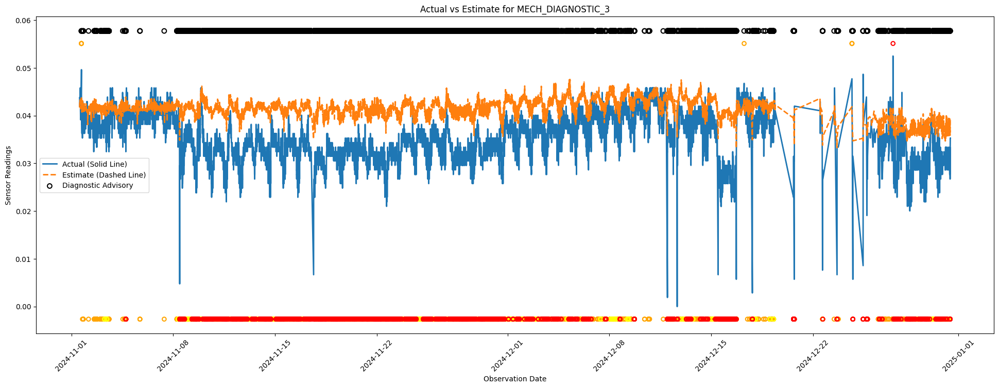

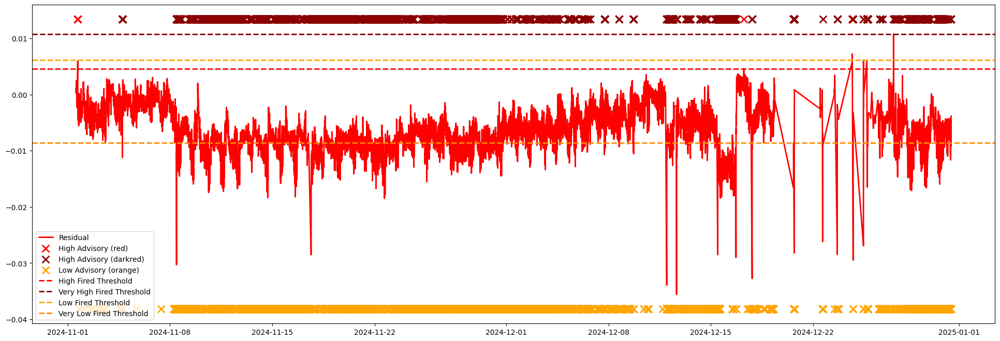

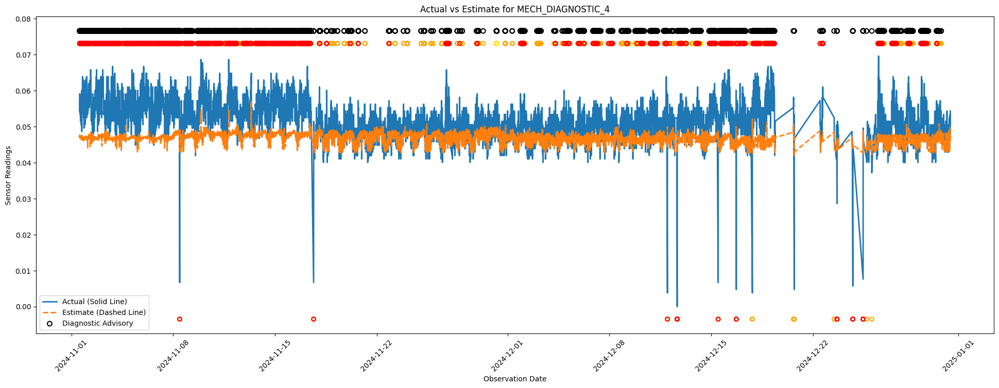

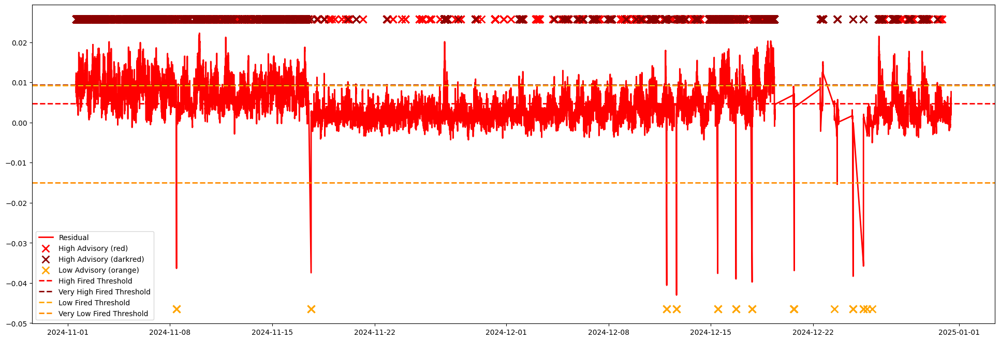

✅ EDA after cleaning completed.


In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import mplcursors

# Function to classify advisory indication markers
def classify_advisory(text):
    """Classify advisory indication into marker color and position (top or bottom)."""
    if pd.isnull(text) or text.strip().lower() == "normal":
        return None, None

    text_lower = text.lower()

    # HIGH Advisory Cases (Top Side)
    if "very high fired" in text_lower:
        return "red", "high"
    elif "long high fired" in text_lower:
        return "yellow", "high"
    elif "high fired" in text_lower:
        return "orange", "high"

    # LOW Advisory Cases (Bottom Side)
    elif "very low fired" in text_lower:
        return "red", "low"
    elif "long low fired" in text_lower:
        return "yellow", "low"
    elif "low fired" in text_lower:
        return "orange", "low"

    return None, None

# Loop through each sheet and process
for sheet, df in filtered_pump_data.items():
    if "Observation Date (UTC+07:00)" in df.columns:
        # Convert observation date to datetime and sort
        df["Observation Date (UTC+07:00)"] = pd.to_datetime(df["Observation Date (UTC+07:00)"], errors='coerce')
        df = df.sort_values("Observation Date (UTC+07:00)").reset_index(drop=True)

        # Column Identifications
        actual_col = df.columns[1]
        estimate_col = df.columns[2]
        residual_col = df.columns[3]

        # Compute vertical limits from Actual values
        y_max = df[actual_col].max()
        y_min = df[actual_col].min()
        offset = 0.05 * (y_max - y_min)  # 5% offset

        # --- Plot Actual vs Estimate ---
        plt.figure(figsize=(24, 8))
        plt.plot(df["Observation Date (UTC+07:00)"], df[actual_col], label="Actual (Solid Line)", linewidth=2)
        plt.plot(df["Observation Date (UTC+07:00)"], df[estimate_col], linestyle='dashed', label="Estimate (Dashed Line)", linewidth=2)
        plt.xlabel("Observation Date")
        plt.ylabel("Sensor Readings")
        plt.title(f"Actual vs Estimate for {sheet}")
        plt.xticks(rotation=45)

        # --- Process Advisory & Diagnostic Markers ---
        advisory_col = next((col for col in df.columns if "Advisory Indication" in col and "Diagnostic" not in col), None)
        diagnostic_col = next((col for col in df.columns if "Diagnostic Advisory Indication" in col), None)

        # Process Advisory Markers
        if advisory_col:
            advisory_data = df[[advisory_col, "Observation Date (UTC+07:00)"]].dropna()
            advisory_data["color"], advisory_data["position"] = zip(*advisory_data[advisory_col].apply(classify_advisory))

            # Remove None values
            advisory_data = advisory_data.dropna()
            advisory_data["y_coord"] = advisory_data["position"].map(lambda pos: y_max + offset if pos == "high" else y_min - offset)

            # Plot advisory markers
            for color in ["orange", "yellow", "red"]:
                subset = advisory_data[advisory_data["color"] == color]
                plt.scatter(subset["Observation Date (UTC+07:00)"], subset["y_coord"],
                            s=30, facecolors='none', edgecolors=color, linewidths=1.5, zorder=2)

        # Process Diagnostic Advisory Markers (Above Advisory)
        if diagnostic_col:
            diagnostic_data = df[df[diagnostic_col].notnull()].copy()
            diagnostic_data = diagnostic_data[diagnostic_data[diagnostic_col].str.strip().str.lower() != "no failure indication"]

            if not diagnostic_data.empty:
                diagnostic_data["y_coord"] = y_max + (2 * offset)  # Above advisory markers

                # Define colors based on diagnostic type
                def get_diagnostic_color(text):
                    text = text.lower()
                    if "early failure indication" in text:
                        return "grey"
                    return "black"

                diagnostic_data["marker_color"] = diagnostic_data[diagnostic_col].apply(get_diagnostic_color)

                # Plot diagnostic markers
                plt.scatter(diagnostic_data["Observation Date (UTC+07:00)"], diagnostic_data["y_coord"],
                            s=40, facecolors='none', edgecolors=diagnostic_data["marker_color"],
                            linewidths=1.5, zorder=3, label="Diagnostic Advisory")

        plt.legend()
        plt.show()

        # --- Residual Analysis ---
        plt.figure(figsize=(24, 8))
        plt.plot(df["Observation Date (UTC+07:00)"], df[residual_col], label="Residual", color='red', linewidth=2)

        # --- Identify & Mark Advisory Points ---
        advisory_points = df.dropna(subset=[advisory_col, residual_col]).copy()

        if not advisory_points.empty:
            # Assign marker colors based on advisory type
            def get_marker_color(text):
                text = str(text).lower()
                if "very high fired" in text or "very low fired" in text:
                    return "darkred"
                elif "high fired" in text or "long high fired" in text:
                    return "red"
                elif "low fired" in text or "long low fired" in text:
                    return "orange"
                return None

            advisory_points["marker_color"] = advisory_points[advisory_col].apply(get_marker_color)

            # Move 'X' marks to the top or bottom of the graph
            y_top = df[residual_col].max() + offset
            y_bottom = df[residual_col].min() - offset

            for color in ["red", "darkred"]:
                subset = advisory_points[advisory_points["marker_color"] == color]
                plt.scatter(subset["Observation Date (UTC+07:00)"], [y_top] * len(subset),
                            color=color, marker="x", s=100, linewidth=2, label=f"High Advisory ({color})")

            for color in ["orange"]:
                subset = advisory_points[advisory_points["marker_color"] == color]
                plt.scatter(subset["Observation Date (UTC+07:00)"], [y_bottom] * len(subset),
                            color=color, marker="x", s=100, linewidth=2, label=f"Low Advisory ({color})")

            # --- Compute & Plot Threshold Lines ---
            high_threshold = advisory_points[advisory_points[advisory_col].str.contains("High Fired", case=False)][residual_col].min()
            very_high_threshold = advisory_points[advisory_points[advisory_col].str.contains("Very High Fired", case=False)][residual_col].min()
            low_threshold = advisory_points[advisory_points[advisory_col].str.contains("Low Fired", case=False)][residual_col].max()
            very_low_threshold = advisory_points[advisory_points[advisory_col].str.contains("Very Low Fired", case=False)][residual_col].max()

            if pd.notnull(high_threshold):
                plt.axhline(y=high_threshold, color="red", linestyle="--", linewidth=2, label="High Fired Threshold")

            if pd.notnull(very_high_threshold):
                plt.axhline(y=very_high_threshold, color="darkred", linestyle="--", linewidth=2, label="Very High Fired Threshold")

            if pd.notnull(low_threshold):
                plt.axhline(y=low_threshold, color="orange", linestyle="--", linewidth=2, label="Low Fired Threshold")

            if pd.notnull(very_low_threshold):
                plt.axhline(y=very_low_threshold, color="darkorange", linestyle="--", linewidth=2, label="Very Low Fired Threshold")

        plt.legend()
        plt.show()

print("✅ EDA after cleaning completed.")


#### Drop Unneccessary Columns

In [37]:
# Process each sheet in the dataset
for sheet, df in filtered_pump_data.items():
    # Identify columns to drop based on index (Observation Date n)
    drop_indices = [0,4]  
    
    # Identify the correct column name for "Diagnostic Advisory Indication"
    diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]

    # Drop columns based on index, keeping "Diagnostic Advisory Indication"
    df = df.drop(df.columns[drop_indices], axis=1, errors="ignore")

    # Update the dictionary with the cleaned DataFrame
    filtered_pump_data[sheet] = df

print("✅ Data cleaned, unnecessary columns dropped")

✅ Data cleaned, unnecessary columns dropped


In [38]:
# Exploratory Data Analysis (EDA)
for sheet, df in filtered_pump_data.items():
    print(f"\nEDA for {sheet}")
    display(df.head())
    print("-" * 50)


EDA for PUMP_DE_BRG_MTL_TEMP_1


,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual,PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication
0,64.998856,51.558433,13.440422,No Failure Indication
1,64.998856,50.795694,14.203162,No Failure Indication
2,64.998856,50.796665,14.202191,No Failure Indication
3,64.998856,50.796373,14.202483,No Failure Indication
4,64.998856,50.795702,14.203154,No Failure Indication


--------------------------------------------------

EDA for PUMP_NDE_BRG_MTL_TEMP_1


,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual,PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Diagnostic Advisory Indication
0,63.998627,53.149672,10.848955,No Failure Indication
1,63.998627,49.804541,14.194086,No Failure Indication
2,63.998627,49.804477,14.194150,No Failure Indication
3,63.998627,49.804496,14.194131,No Failure Indication
4,63.998627,49.804540,14.194087,No Failure Indication


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_1


,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual,MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Diagnostic Advisory Indication
0,0.031487,0.032727,-0.001240,No Failure Indication
1,0.031487,0.032725,-0.001238,No Failure Indication
2,0.037209,0.035843,0.001366,No Failure Indication
3,0.037209,0.035843,0.001366,No Failure Indication
4,0.037209,0.035841,0.001368,No Failure Indication


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_2


,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual,MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Diagnostic Advisory Indication
0,0.066789,0.054675,0.012114,No Failure Indication
1,0.066789,0.054675,0.012114,No Failure Indication
2,0.066789,0.054675,0.012114,No Failure Indication
3,0.066789,0.054675,0.012114,No Failure Indication
4,0.065835,0.054045,0.011790,No Failure Indication


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_3


,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Residual,MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Diagnostic Advisory Indication
0,0.041978,0.041682,0.000296,No Failure Indication
1,0.043893,0.042685,0.001207,No Failure Indication
2,0.043893,0.042685,0.001207,No Failure Indication
3,0.043893,0.042685,0.001207,No Failure Indication
4,0.043893,0.042685,0.001207,No Failure Indication


--------------------------------------------------

EDA for MECH_DIAGNOSTIC_4


,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Actual,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Estimate,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Residual,MECH_DIAGNOSTIC_4 (PTPHGS_ MPS_VT_P_1008_10) Diagnostic Advisory Indication
0,0.051522,0.046828,0.004694,No Failure Indication
1,0.051522,0.046828,0.004694,No Failure Indication
2,0.051522,0.046828,0.004694,No Failure Indication
3,0.051522,0.046828,0.004694,No Failure Indication
4,0.051522,0.046827,0.004695,No Failure Indication


--------------------------------------------------


In [39]:
# Find categorical variables for Diagnostic Advisory Indication
for sheet, df in filtered_pump_data.items():
    diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
    if diag_col:
        diag_col = diag_col[0]  # Take the first match if multiple exist
        print(f"Sheet: {sheet} - Diagnostic Advisory Indication Counts")
        print(df[diag_col].value_counts())
        print("-" * 50)

Sheet: PUMP_DE_BRG_MTL_TEMP_1 - Diagnostic Advisory Indication Counts
PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Diagnostic Advisory Indication
No Failure Indication                                   52112
Journal Bearing - Local Bearing  Problem Pump DE        23616
Early Failure Indication - High Sensor Reading Value     1023
Name: count, dtype: int64
--------------------------------------------------
Sheet: PUMP_NDE_BRG_MTL_TEMP_1 - Diagnostic Advisory Indication Counts
PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Diagnostic Advisory Indication
No Failure Indication                                   74189
Journal Bearing - Local Bearing  Problem Pump NDE        1632
Early Failure Indication - High Sensor Reading Value      522
Name: count, dtype: int64
--------------------------------------------------
Sheet: MECH_DIAGNOSTIC_1 - Diagnostic Advisory Indication Counts
MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Diagnostic Advisory Indication
Mechanical - Equipment 

In [40]:
# from sklearn.preprocessing import LabelEncoder

# # Apply Label Encoding per sheet
# for sheet, df in filtered_pump_data.items():
#     print(f"📌 Processing sheet: {sheet}")

#     # Identify the Advisory Indication column
#     advisory_col = next((col for col in df.columns if "Advisory Indication" in col and "Diagnostic" not in col), None)
#     if advisory_col:
#         # Initialize a new LabelEncoder for each dataset
#         le = LabelEncoder()
#         df[advisory_col] = le.fit_transform(df[advisory_col])

#         # Save mapping for reference (optional)
#         advisory_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
#         print(f"\n📊 Encoding for {sheet}:")
#         for category, encoded_value in advisory_mapping.items():
#             print(f" - {category}: {encoded_value}")

#     print(f"✅ Encoded Advisory Indication for {sheet}\n" + "="*50)


In [41]:
# # Exploratory Data Analysis (EDA)
# for sheet, df in filtered_pump_data.items():
#     print(f"\nEDA for {sheet}")
#     display(df.head())
#     print("-" * 50)

In [42]:
# # find categorical variables
# for sheet, df in filtered_pump_data.items():
#     categorical = [var for var in df.columns if df[var].dtype=='O']
#     for var in categorical:
#         print(df[var].value_counts())
#         print('\n')
#     print("-" * 50)

## Model Training & Evaluation

### Confusion Matrix Display Function

In [43]:
# Function to display text version of the confusion matrix
def display_confusion_matrix(y_test, y_pred, sheet, model_name):
    cm = confusion_matrix(y_test, y_pred)
    
    # Print text version of confusion matrix
    print(f"\n🌀 Confusion Matrix - {sheet} ({model_name}):")
    print(cm)

confusion_results = {}  # Store confusion matrices for each model & sheet

In [44]:
# Function to plot all confusion matrices after training
def plot_confusion_matrices(results_per_sheet):
    """
    Plot confusion matrices for all trained models.

    :param results_per_sheet: Dictionary containing {sheet_name: {model_name: (y_test, y_pred)}}
    """
    for sheet, models in results_per_sheet.items():
        for model_name, (y_test, y_pred) in models.items():
            cm = confusion_matrix(y_test, y_pred)

            plt.figure(figsize=(6, 5))
            sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                        xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
            plt.xlabel("Predicted")
            plt.ylabel("Actual")
            plt.title(f"Confusion Matrix - {sheet} ({model_name})")
            plt.show()


In [45]:
# #New prototype
# def plot_confusion_matrices(results_per_sheet):
#     """
#     Plot confusion matrices for all trained models.

#     :param results_per_sheet: Dictionary containing {sheet_name: {model_name: (y_test, y_pred, le)}}
#     """
#     for sheet, models in results_per_sheet.items():
#         for model_name, (y_test, y_pred, le) in models.items():
#             cm = confusion_matrix(y_test, y_pred)

#             plt.figure(figsize=(6, 5))
#             sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
#                         xticklabels=le.classes_, yticklabels=le.classes_)
#             plt.xlabel("Predicted")
#             plt.ylabel("Actual")
#             plt.title(f"Confusion Matrix - {sheet} ({model_name})")
#             plt.show()


### Train the Models

In [46]:
def build_training_features(filtered_pump_data):
    training_features_per_sheet = {}
    
    for sheet_name, df in filtered_pump_data.items():
        # Dynamically extract sensor columns
        sensor_cols = [col for col in df.columns if "Actual" in col]
        
        # Dynamically extract Estimate and Residual columns
        estimate_cols = [col for col in df.columns if "Estimate" in col]
        residual_cols = [col for col in df.columns if "Residual" in col ]
        
        # Combine all relevant features into the features list
        features = sensor_cols  # Start with sensor columns
        
        if estimate_cols:
            features.append(estimate_cols[0])  # Add the first Estimate column
        if residual_cols:
            features.append(residual_cols[0])  # Add the first Residual column
        
        # Assign features to the current sheet
        training_features_per_sheet[sheet_name] = features
    
    return training_features_per_sheet

# Example usage:
training_features_per_sheet = build_training_features(filtered_pump_data)
print(training_features_per_sheet)


{'PUMP_DE_BRG_MTL_TEMP_1': ['PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Actual', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Estimate', 'PUMP_DE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_07) Residual'], 'PUMP_NDE_BRG_MTL_TEMP_1': ['PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Actual', 'PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Estimate', 'PUMP_NDE_BRG_MTL_TEMP_1 (PTPHGS_ MPS_TT_P_1008_02_08) Residual'], 'MECH_DIAGNOSTIC_1': ['MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Actual', 'MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Estimate', 'MECH_DIAGNOSTIC_1 (PTPHGS_ MPS_VT_P_1008_05) Residual'], 'MECH_DIAGNOSTIC_2': ['MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Actual', 'MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Estimate', 'MECH_DIAGNOSTIC_2 (PTPHGS_ MPS_VT_P_1008_06) Residual'], 'MECH_DIAGNOSTIC_3': ['MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Actual', 'MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_P_1008_09) Estimate', 'MECH_DIAGNOSTIC_3 (PTPHGS_ MPS_VT_

In [47]:
def train_models(X, y, sheet):
    """Train models without hyperparameter tuning."""
    
    if len(np.unique(y)) == 1:
        print(f"⚠ Skipping {sheet} (Single-Class Data)")
        return {}

    # Encode categorical target variable
    le = LabelEncoder()
    y = le.fit_transform(y)

    # Feature Scaling
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    # Train-test split (80-20)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    # Compute Class Weights for Imbalanced Data
    class_counts = np.bincount(y_train)
    class_weights = {i: max(class_counts) / count for i, count in enumerate(class_counts) if count > 0}
    xgb_scale_pos_weight = class_weights.get(1, 1)  # Adjust XGBoost class weight dynamically

    # Define Models WITHOUT Hyperparameter Tuning (Default Settings)
    models = {
        "Random Forest": RandomForestClassifier(class_weight="balanced", random_state=42),
        "XGBoost": XGBClassifier(scale_pos_weight=xgb_scale_pos_weight, eval_metric="mlogloss", use_label_encoder=False),
        "CatBoost": CatBoostClassifier(verbose=0)
    }

    best_models = {}

    for model_name, model in models.items():
        print(f"\n🚀 Training {model_name} on {sheet}...")

        # Train the model on training data
        model.fit(X_train, y_train)

        # Predictions on test data
        y_pred = model.predict(X_test)

        # Final Test Accuracy
        accuracy = accuracy_score(y_test, y_pred)
        print(f"✅ {model_name} Test Accuracy: {accuracy:.4f}")

        # Classification Report
        print("📊 Classification Report:")
        print(classification_report(y_test, y_pred))

        # Store y_test and y_pred for confusion matrix plotting
        if sheet not in confusion_results:
            confusion_results[sheet] = {}
        confusion_results[sheet][model_name] = (y_test, y_pred)

        # Display text-based confusion matrix (no plot)
        display_confusion_matrix(y_test, y_pred, sheet, model_name)

        best_models[model_name] = model

    return best_models




In [48]:
# #New prototype
# confusion_results = {}  # Store confusion matrices for each model & sheet
# label_encoders = {}     # Store LabelEncoders for each sheet

# best_models_per_sheet = {}

# for sheet, df in filtered_pump_data.items():
#     print(f"\n📌 Processing sheet: {sheet}")

#     diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
#     if diag_col:
#         diag_col = diag_col[0]

#         X = df.drop(columns=[diag_col])  # Features
#         y = df[diag_col].values  # Target

#         best_models_per_sheet[sheet] = train_models(X, y, sheet)

# print("\n✅ Step 1 Complete: Models trained without hyperparameter tuning.")

# # Plot confusion matrices with original labels
# for sheet_name in confusion_results.keys():
#     print(f"\n📌 Plotting Confusion Matrices for: {sheet_name}")
#     plot_confusion_matrices({sheet_name: confusion_results[sheet_name]})



📌 Processing sheet: PUMP_DE_BRG_MTL_TEMP_1

🚀 Training Random Forest on PUMP_DE_BRG_MTL_TEMP_1...
✅ Random Forest Test Accuracy: 0.9881
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.61      0.64       205
           1       0.98      0.99      0.98      4723
           2       1.00      1.00      1.00     10423

    accuracy                           0.99     15351
   macro avg       0.89      0.87      0.88     15351
weighted avg       0.99      0.99      0.99     15351


🌀 Confusion Matrix - PUMP_DE_BRG_MTL_TEMP_1 (Random Forest):
[[  126    55    24]
 [   46  4656    21]
 [   14    23 10386]]

🚀 Training XGBoost on PUMP_DE_BRG_MTL_TEMP_1...


c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:56:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9854
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.30      0.41       205
           1       0.97      0.99      0.98      4723
           2       0.99      1.00      1.00     10423

    accuracy                           0.99     15351
   macro avg       0.87      0.76      0.80     15351
weighted avg       0.98      0.99      0.98     15351


🌀 Confusion Matrix - PUMP_DE_BRG_MTL_TEMP_1 (XGBoost):
[[   62    99    44]
 [   25  4678    20]
 [    9    27 10387]]

🚀 Training CatBoost on PUMP_DE_BRG_MTL_TEMP_1...
✅ CatBoost Test Accuracy: 0.9836
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.22      0.31       205
           1       0.97      0.99      0.98      4723
           2       0.99      0.99      0.99     10423

    accuracy                           0.98     15351
   macro avg       0.83      0.74      0.76     15351
weighted

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9974
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       104
           1       0.96      0.95      0.95       327
           2       1.00      1.00      1.00     14838

    accuracy                           1.00     15269
   macro avg       0.94      0.92      0.93     15269
weighted avg       1.00      1.00      1.00     15269


🌀 Confusion Matrix - PUMP_NDE_BRG_MTL_TEMP_1 (XGBoost):
[[   83    12     9]
 [   13   310     4]
 [    1     1 14836]]

🚀 Training CatBoost on PUMP_NDE_BRG_MTL_TEMP_1...
✅ CatBoost Test Accuracy: 0.9972
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.77      0.81       104
           1       0.95      0.95      0.95       327
           2       1.00      1.00      1.00     14838

    accuracy                           1.00     15269
   macro avg       0.93      0.91      0.92     15269
weight

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:57:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ CatBoost Test Accuracy: 0.9972
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13972
           1       0.99      0.98      0.98      1369

    accuracy                           1.00     15341
   macro avg       0.99      0.99      0.99     15341
weighted avg       1.00      1.00      1.00     15341


🌀 Confusion Matrix - MECH_DIAGNOSTIC_1 (CatBoost):
[[13953    19]
 [   24  1345]]

📌 Processing sheet: MECH_DIAGNOSTIC_2

🚀 Training Random Forest on MECH_DIAGNOSTIC_2...
✅ Random Forest Test Accuracy: 0.9944
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14440
           1       0.95      0.95      0.95       871

    accuracy                           0.99     15311
   macro avg       0.97      0.97      0.97     15311
weighted avg       0.99      0.99      0.99     15311


🌀 Confusion Matrix - MECH_DIAGNOSTIC_2 (Random Fores

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:57:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ CatBoost Test Accuracy: 0.9883
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     14440
           1       0.94      0.85      0.89       871

    accuracy                           0.99     15311
   macro avg       0.96      0.92      0.94     15311
weighted avg       0.99      0.99      0.99     15311


🌀 Confusion Matrix - MECH_DIAGNOSTIC_2 (CatBoost):
[[14389    51]
 [  128   743]]

📌 Processing sheet: MECH_DIAGNOSTIC_3

🚀 Training Random Forest on MECH_DIAGNOSTIC_3...
✅ Random Forest Test Accuracy: 0.9571
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      8796
           1       0.94      0.95      0.95      5645

    accuracy                           0.96     14441
   macro avg       0.95      0.96      0.95     14441
weighted avg       0.96      0.96      0.96     14441


🌀 Confusion Matrix - MECH_DIAGNOSTIC_3 (Random Fores

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:57:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ CatBoost Test Accuracy: 0.9299
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      8796
           1       0.95      0.87      0.91      5645

    accuracy                           0.93     14441
   macro avg       0.93      0.92      0.93     14441
weighted avg       0.93      0.93      0.93     14441


🌀 Confusion Matrix - MECH_DIAGNOSTIC_3 (CatBoost):
[[8541  255]
 [ 757 4888]]

📌 Processing sheet: MECH_DIAGNOSTIC_4

🚀 Training Random Forest on MECH_DIAGNOSTIC_4...
✅ Random Forest Test Accuracy: 0.9476
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.90      0.90      4008
           1       0.96      0.96      0.96     10782

    accuracy                           0.95     14790
   macro avg       0.93      0.93      0.93     14790
weighted avg       0.95      0.95      0.95     14790


🌀 Confusion Matrix - MECH_DIAGNOSTIC_4 (Random Forest):


c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:57:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ CatBoost Test Accuracy: 0.9238
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.84      0.86      4008
           1       0.94      0.95      0.95     10782

    accuracy                           0.92     14790
   macro avg       0.91      0.90      0.90     14790
weighted avg       0.92      0.92      0.92     14790


🌀 Confusion Matrix - MECH_DIAGNOSTIC_4 (CatBoost):
[[ 3385   623]
 [  504 10278]]

✅ Step 1 Complete: Models trained without hyperparameter tuning.

📌 Plotting Confusion Matrices for: PUMP_DE_BRG_MTL_TEMP_1


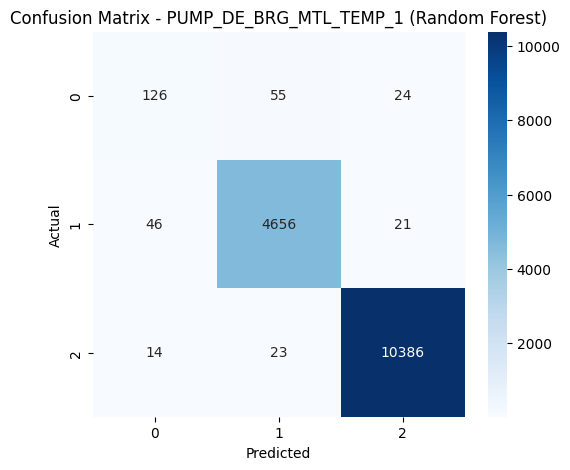

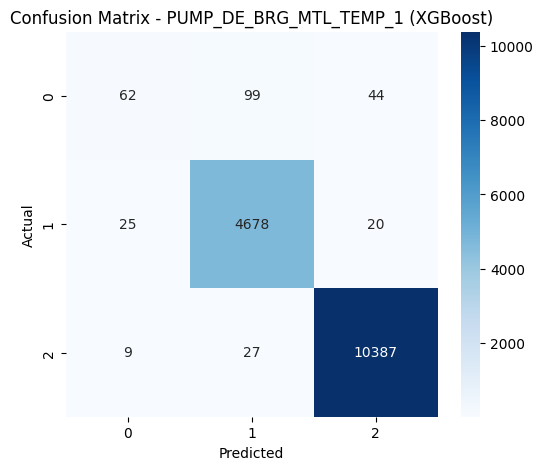

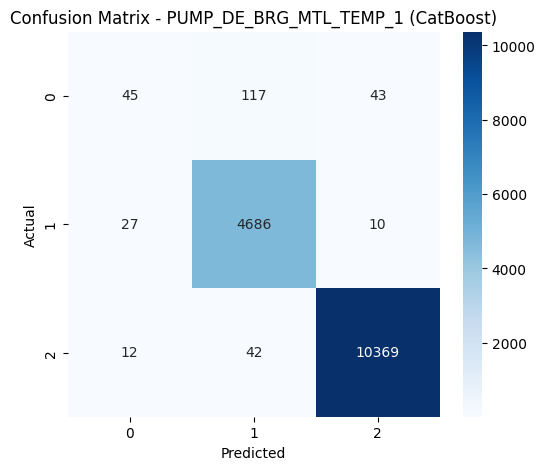


📌 Plotting Confusion Matrices for: PUMP_NDE_BRG_MTL_TEMP_1


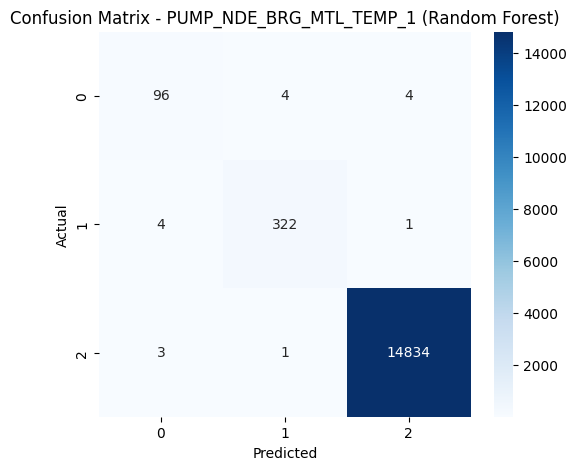

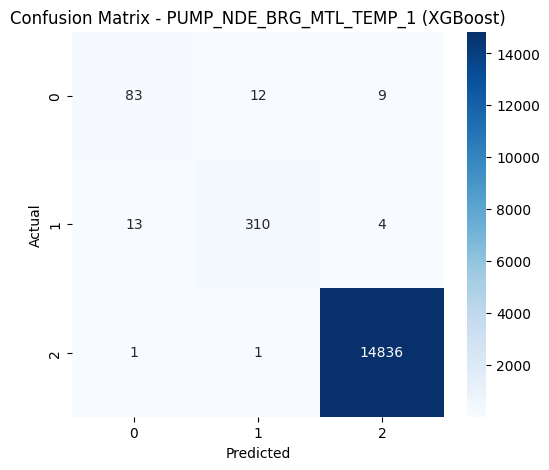

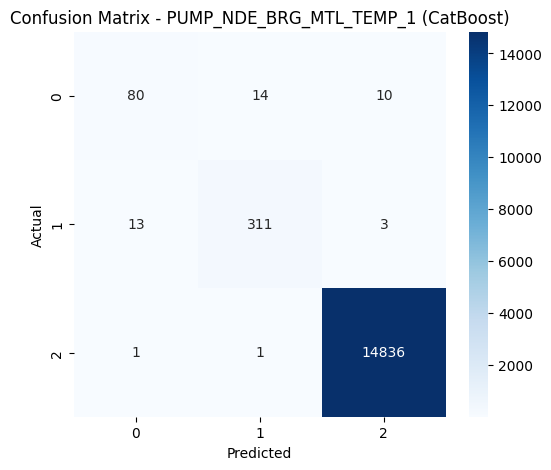


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_1


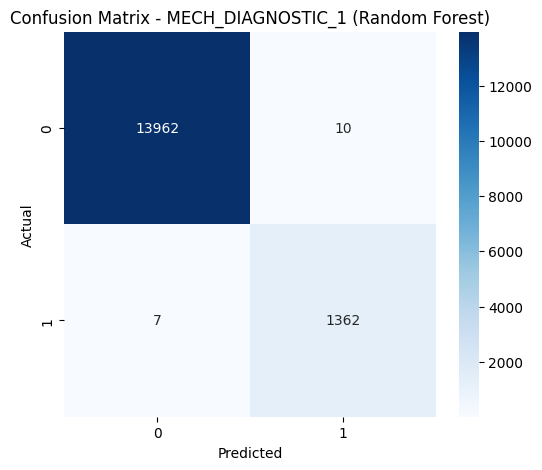

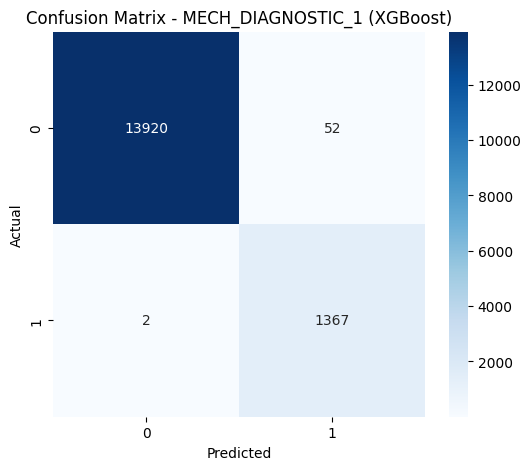

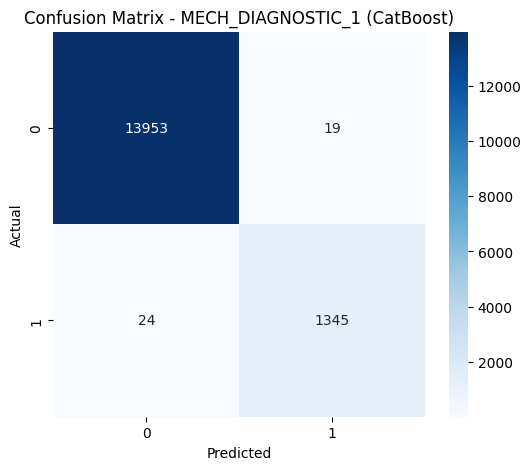


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_2


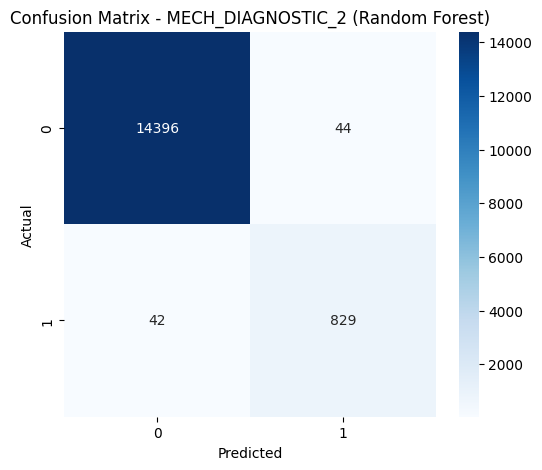

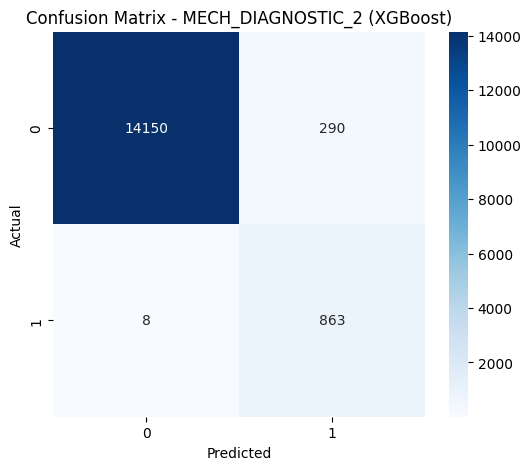

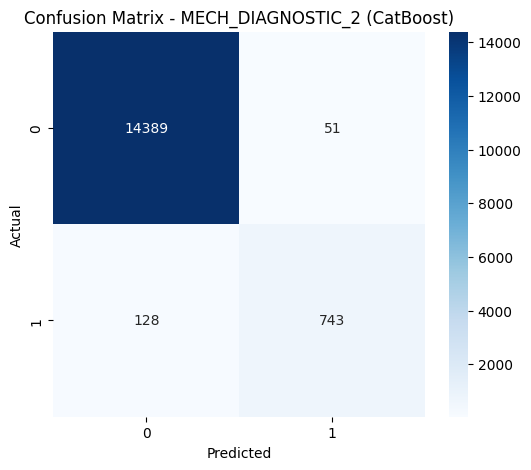


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_3


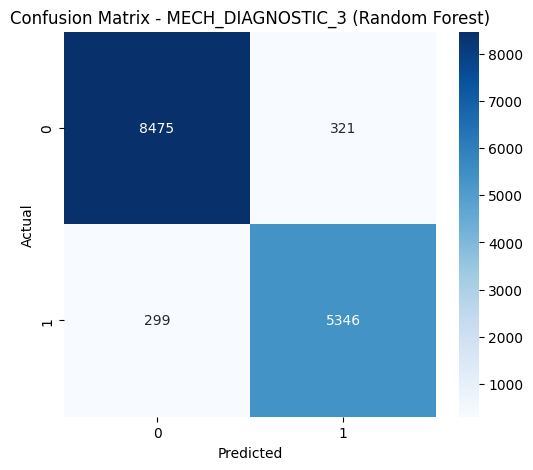

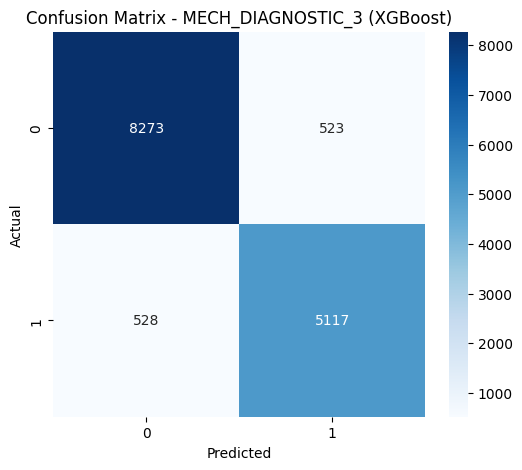

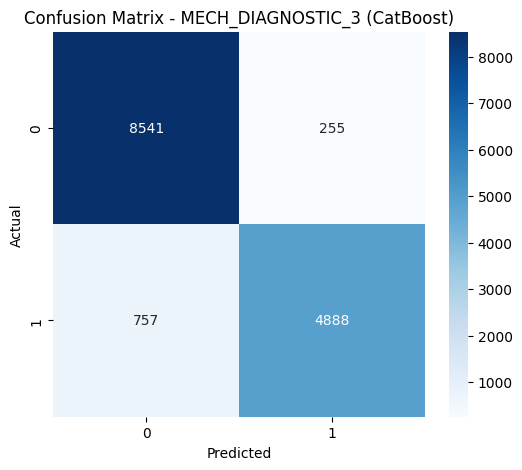


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_4


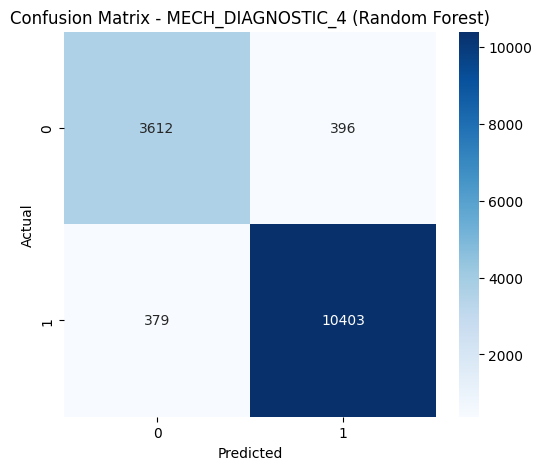

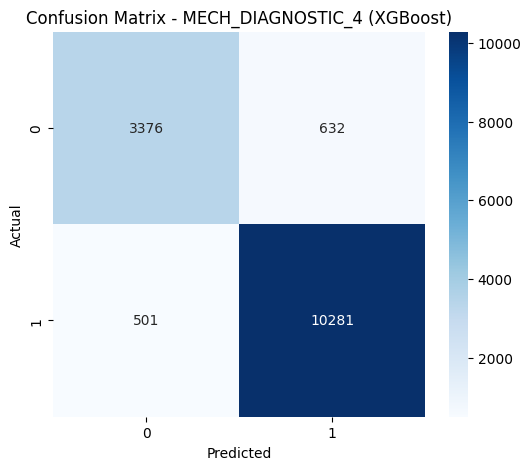

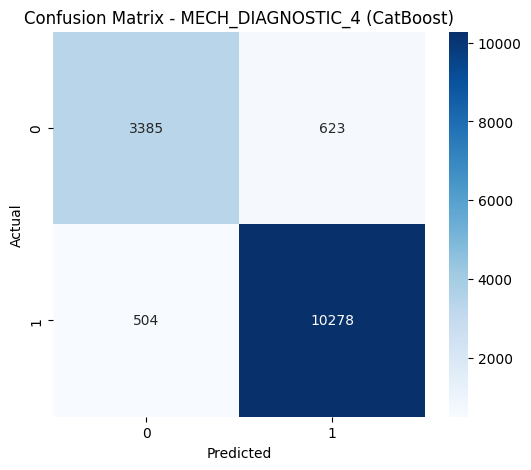

In [49]:
# Train models without hyperparameter tuning
best_models_per_sheet = {}

for sheet, df in filtered_pump_data.items():
    print(f"\n📌 Processing sheet: {sheet}")

    diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
    if diag_col:
        diag_col = diag_col[0]

        X = df.drop(columns=[diag_col])  # Features
        y = df[diag_col].values  # Target

        best_models_per_sheet[sheet] = train_models(X, y, sheet)

print("\n✅ Step 1 Complete: Models trained without hyperparameter tuning.")

# Loop through each sheet and plot confusion matrices
for sheet_name in confusion_results.keys():
    print(f"\n📌 Plotting Confusion Matrices for: {sheet_name}")
    plot_confusion_matrices({sheet_name: confusion_results[sheet_name]})

### Grid Search for Hyperparameter Tuning

In [51]:
# # Function to perform Grid Search Hyperparameter Tuning
# def perform_grid_search(X_train, y_train):
#     param_grids = {
#         "Random Forest": {
#             "n_estimators": [50, 100, 200],  # Increasing max range
#             "max_depth": [None, 5, 10, 20],  # Adding deeper trees
#             "min_samples_split": [2, 5, 10, 20],  # Prevents overfitting
#             "min_samples_leaf": [1, 2, 4, 8]  # Ensures stability
#         },
#         "XGBoost": {
#             "n_estimators": [50, 100, 200],  # More flexibility
#             "max_depth": [3, 5, 7, 10],  # Prevent overfitting with shallower trees
#             "learning_rate": [0.01, 0.05, 0.1, 0.2],  # Adjusting learning speed
#             "min_child_weight": [1, 3, 5],  # Controls complexity
#             "subsample": [0.7, 0.8, 1.0],  # Reducing overfitting risk
#             "colsample_bytree": [0.7, 0.8, 1.0],  # Balancing bias-variance
#             "gamma": [0, 0.1, 0.2]  # Regularization to prevent overfitting
#         },
#         "CatBoost": {
#             "iterations": [50, 100, 200],  # Increasing the number of boosting rounds
#             "depth": [4, 6, 8, 10],  # Testing a wider range of tree depths
#             "learning_rate": [0.01, 0.05, 0.1, 0.2],  # Keeping lower values to avoid overshooting
#             "l2_leaf_reg": [3, 5, 10, 20],  # Adjusting regularization strength
#             "border_count": [32, 64, 128]  # Feature binning to balance speed/accuracy
#         }
#     }

#     best_params = {}

#     for model_name, param_grid in param_grids.items():
#         print(f"\n🔎 Performing Grid Search for {model_name}...")

#         if model_name == "Random Forest":
#             model = RandomForestClassifier(class_weight="balanced", random_state=42)
#         elif model_name == "XGBoost":
#             model = XGBClassifier(eval_metric="mlogloss", use_label_encoder=False)
#         elif model_name == "CatBoost":
#             model = CatBoostClassifier(verbose=0)

#         grid_search = GridSearchCV(model, param_grid, cv=3, scoring="accuracy", n_jobs=-1)
#         grid_search.fit(X_train, y_train)

#         # Store best parameters
#         best_params[model_name] = grid_search.best_params_

#         print(f"✅ Best Score for {model_name}: {grid_search.best_score_:.4f}")
#         print(f"🔹 Best Params: {grid_search.best_params_}")

#     return best_params


In [52]:
# # Step 2: Perform Grid Search for Hyperparameter Tuning
# best_params_per_sheet = {}

# for sheet, (X_train, y_train) in train_results.items():
#     if X_train is None or y_train is None:
#         print(f"⚠ Skipping Grid Search for {sheet} due to missing training data.")
#         continue  # Skip this iteration

#     print(f"\n🔎 Performing Grid Search for {sheet}...")
#     best_params = perform_grid_search(X_train, y_train)
#     best_params_per_sheet[sheet] = best_params  # Store best params

# print("\n✅ Step 2 Complete: Best hyperparameters identified using Grid Search.")


### Train Models with hyperparameter tuning v5 Bayesian optimization

In [53]:
# from bayes_opt import BayesianOptimization
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import StandardScaler, LabelEncoder
# from sklearn.metrics import accuracy_score, classification_report
# from xgboost import XGBClassifier
# from catboost import CatBoostClassifier
# from sklearn.ensemble import RandomForestClassifier
# import numpy as np

# # Define Bayesian Optimization Search Space
# def rf_bo(n_estimators, max_depth, min_samples_split, min_samples_leaf, max_features):
#     """Objective function for Bayesian optimization of Random Forest."""
#     model = RandomForestClassifier(
#         n_estimators=int(n_estimators),
#         max_depth=int(max_depth),
#         min_samples_split=int(min_samples_split),
#         min_samples_leaf=int(min_samples_leaf),
#         max_features="sqrt" if max_features < 0.5 else "log2",
#         class_weight="balanced",
#         random_state=42
#     )
#     model.fit(X_train, y_train)
#     return accuracy_score(y_test, model.predict(X_test))

# def xgb_bo(n_estimators, max_depth, learning_rate, colsample_bytree, subsample, gamma):
#     """Objective function for Bayesian optimization of XGBoost."""
#     model = XGBClassifier(
#         n_estimators=int(n_estimators),
#         max_depth=int(max_depth),
#         learning_rate=learning_rate,
#         colsample_bytree=colsample_bytree,
#         subsample=subsample,
#         gamma=gamma,
#         eval_metric="mlogloss",
#         use_label_encoder=False,
#         random_state=42
#     )
#     model.fit(X_train, y_train)
#     return accuracy_score(y_test, model.predict(X_test))

# def catboost_bo(iterations, depth, learning_rate, l2_leaf_reg):
#     """Objective function for Bayesian optimization of CatBoost."""
#     model = CatBoostClassifier(
#         iterations=int(iterations),
#         depth=int(depth),
#         learning_rate=learning_rate,
#         l2_leaf_reg=l2_leaf_reg,
#         verbose=0,
#         random_state=42
#     )
#     model.fit(X_train, y_train)
#     return accuracy_score(y_test, model.predict(X_test))

# # Function to optimize models using Bayesian Optimization
# def optimize_hyperparameters(X, y, sheet):
#     """Optimize hyperparameters for each model using Bayesian Optimization."""
    
#     if len(np.unique(y)) == 1:
#         print(f"⚠ Skipping {sheet} (Single-Class Data)")
#         return {}

#     # Encode categorical target variable
#     le = LabelEncoder()
#     y = le.fit_transform(y)

#     # Feature Scaling
#     scaler = StandardScaler()
#     X = scaler.fit_transform(X)

#     # Train-test split (80-20)
#     global X_train, X_test, y_train, y_test
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

#     # Optimize Random Forest
#     print(f"\n🚀 Optimizing Random Forest on {sheet}...")
#     rf_optimizer = BayesianOptimization(
#         f=rf_bo,
#         pbounds={
#             "n_estimators": (100, 500),
#             "max_depth": (5, 30),
#             "min_samples_split": (2, 10),
#             "min_samples_leaf": (1, 5),
#             "max_features": (0, 1)  # 0 -> "sqrt", 1 -> "log2"
#         },
#         random_state=42,
#         verbose=2
#     )
#     rf_optimizer.maximize(init_points=5, n_iter=20)
#     best_rf_params = rf_optimizer.max["params"]
#     best_rf_params["n_estimators"] = int(best_rf_params["n_estimators"])
#     best_rf_params["max_depth"] = int(best_rf_params["max_depth"])
#     best_rf_params["min_samples_split"] = int(best_rf_params["min_samples_split"])
#     best_rf_params["min_samples_leaf"] = int(best_rf_params["min_samples_leaf"])
#     best_rf_params["max_features"] = "sqrt" if best_rf_params["max_features"] < 0.5 else "log2"

#     # Optimize XGBoost
#     print(f"\n🚀 Optimizing XGBoost on {sheet}...")
#     xgb_optimizer = BayesianOptimization(
#         f=xgb_bo,
#         pbounds={
#             "n_estimators": (100, 500),
#             "max_depth": (3, 15),
#             "learning_rate": (0.01, 0.3),
#             "colsample_bytree": (0.5, 1.0),
#             "subsample": (0.5, 1.0),
#             "gamma": (0, 0.5),
#         },
#         random_state=42,
#         verbose=2
#     )
#     xgb_optimizer.maximize(init_points=5, n_iter=20)
#     best_xgb_params = xgb_optimizer.max["params"]
#     best_xgb_params["n_estimators"] = int(best_xgb_params["n_estimators"])
#     best_xgb_params["max_depth"] = int(best_xgb_params["max_depth"])

#     # Optimize CatBoost
#     print(f"\n🚀 Optimizing CatBoost on {sheet}...")
#     catboost_optimizer = BayesianOptimization(
#         f=catboost_bo,
#         pbounds={
#             "iterations": (200, 500),
#             "depth": (6, 12),
#             "learning_rate": (0.01, 0.3),
#             "l2_leaf_reg": (3, 15),
#         },
#         random_state=42,
#         verbose=2
#     )
#     catboost_optimizer.maximize(init_points=5, n_iter=20)
#     best_cat_params = catboost_optimizer.max["params"]
#     best_cat_params["iterations"] = int(best_cat_params["iterations"])
#     best_cat_params["depth"] = int(best_cat_params["depth"])

#     return {
#         "Random Forest": best_rf_params,
#         "XGBoost": best_xgb_params,
#         "CatBoost": best_cat_params
#     }

# # Train models with Bayesian Optimization for each sheet
# best_params_per_sheet = {}

# for sheet, df in filtered_pump_data.items():
#     print(f"\n📌 Processing sheet: {sheet}")

#     diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
#     if diag_col:
#         diag_col = diag_col[0]

#         X = df.drop(columns=[diag_col])  # Features
#         y = df[diag_col].values  # Target

#         best_params_per_sheet[sheet] = optimize_hyperparameters(X, y, sheet)

# print("\n✅ Step 3 Complete: Hyperparameters optimized using Bayesian Optimization.")


In [54]:
# import numpy as np
# import pandas as pd
# from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
# from sklearn.preprocessing import StandardScaler, LabelEncoder
# from sklearn.ensemble import RandomForestClassifier
# from xgboost import XGBClassifier
# from catboost import CatBoostClassifier
# from skopt import BayesSearchCV
# from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# # ✅ Define Bayesian Optimization Search Space
# bayesian_params = {
#     "Random Forest": {
#         "n_estimators": (100, 300),
#         "max_depth": (10, 50),
#         "min_samples_split": (2, 10),
#         "min_samples_leaf": (1, 5),
#         "max_features": ["sqrt", "log2"]
#     },
#     "XGBoost": {
#         "n_estimators": (100, 300),
#         "max_depth": (3, 15),
#         "learning_rate": (0.01, 0.3),
#         "colsample_bytree": (0.6, 1.0),
#         "subsample": (0.6, 1.0),
#         "gamma": (0, 0.5),
#         "min_child_weight": (1, 10)
#     },
#     "CatBoost": {
#         "iterations": (100, 400),
#         "depth": (4, 12),
#         "learning_rate": (0.01, 0.3),
#         "l2_leaf_reg": (1, 20),
#         "border_count": (32, 255)
#     }
# }

# def train_models(X, y, sheet):
#     """Train models and select the best between Default, RandomizedSearch, and Bayesian Optimization."""
#     if len(np.unique(y)) == 1:
#         print(f"⚠ Skipping {sheet} (Single-Class Data)")
#         return {}

#     le = LabelEncoder()
#     y = le.fit_transform(y)

#     scaler = StandardScaler()
#     X = scaler.fit_transform(X)

#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

#     cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
#     class_counts = np.bincount(y_train)
#     class_weights = {i: max(class_counts) / count for i, count in enumerate(class_counts) if count > 0}
#     xgb_scale_pos_weight = class_weights.get(1, 1)

#     # 🔹 Define Models (Default Settings)
#     default_models = {
#         "Random Forest": RandomForestClassifier(class_weight="balanced", random_state=42),
#         "XGBoost": XGBClassifier(eval_metric="mlogloss", use_label_encoder=False),
#         "CatBoost": CatBoostClassifier(verbose=0)
#     }

#     # 🔹 Perform Bayesian Optimization
#     best_bayesian_params = {}
#     for model_name, model in default_models.items():
#         if model_name in bayesian_params:
#             print(f"🔎 Running Bayesian Optimization for {model_name} on {sheet}...")
#             opt = BayesSearchCV(
#                 model, bayesian_params[model_name], n_iter=15, cv=cv, scoring="accuracy", n_jobs=-1, random_state=42
#             )
#             opt.fit(X_train, y_train)
#             best_bayesian_params[model_name] = opt.best_params_
#             print(f"✅ Best Bayesian Params for {model_name}: {opt.best_params_}")

#     # 🔹 Define Bayesian Optimized Models
#     bayesian_models = {
#         "Random Forest": RandomForestClassifier(**best_bayesian_params.get("Random Forest", {}), class_weight="balanced", random_state=42),
#         "XGBoost": XGBClassifier(**best_bayesian_params.get("XGBoost", {}), eval_metric="mlogloss", use_label_encoder=False),
#         "CatBoost": CatBoostClassifier(**best_bayesian_params.get("CatBoost", {}), verbose=0)
#     }

#     best_models = {}

#     for model_name in default_models.keys():
#         print(f"\n🚀 Evaluating {model_name} on {sheet}...")

#         # Evaluate Default Model
#         default_model = default_models[model_name]
#         default_cv_score = cross_val_score(default_model, X_train, y_train, cv=cv, scoring="accuracy", n_jobs=-1).mean()

#         # Evaluate Bayesian Optimized Model
#         if model_name in bayesian_models:
#             bayesian_model = bayesian_models[model_name]
#             bayesian_cv_score = cross_val_score(bayesian_model, X_train, y_train, cv=cv, scoring="accuracy", n_jobs=-1).mean()
#         else:
#             bayesian_cv_score = default_cv_score

#         print(f"🔹 Default {model_name} CV Accuracy: {default_cv_score:.4f}")
#         print(f"🔹 Bayesian Optimized {model_name} CV Accuracy: {bayesian_cv_score:.4f}")

#         # Select the best model
#         if bayesian_cv_score >= default_cv_score:
#             best_model = bayesian_models[model_name]
#             print(f"✅ Using Bayesian Optimized {model_name}")
#         else:
#             best_model = default_models[model_name]
#             print(f"✅ Using Default {model_name}")

#         # Train final selected model
#         best_model.fit(X_train, y_train)
#         y_pred = best_model.predict(X_test)

#         # Test Accuracy
#         accuracy = accuracy_score(y_test, y_pred)
#         print(f"🎯 {model_name} Test Accuracy: {accuracy:.4f}")

#         # Classification Report
#         print("📊 Classification Report:")
#         print(classification_report(y_test, y_pred))

#         # Store Best Model
#         best_models[model_name] = best_model

#     return best_models


# best_models_per_sheet = {}

# for sheet, df in filtered_pump_data.items():
#     print(f"\n📌 Processing sheet: {sheet}")

#     # Simulating a target column
#     df["Diagnostic Advisory Indication"] = np.random.randint(0, 3, df.shape[0])

#     diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
#     if diag_col:
#         diag_col = diag_col[0]

#         X = df.drop(columns=[diag_col])
#         y = df[diag_col].values

#         best_models_per_sheet[sheet] = train_models(X, y, sheet)

# print("\n✅ Training Complete: Best models selected per sheet.")


### Train Models with hyperparameter tuning v4 Randomized search CV

In [55]:
# from sklearn.model_selection import RandomizedSearchCV, train_test_split, StratifiedKFold
# from sklearn.preprocessing import StandardScaler, LabelEncoder
# from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# from xgboost import XGBClassifier
# from catboost import CatBoostClassifier
# from sklearn.ensemble import RandomForestClassifier
# import numpy as np

# # Define hyperparameter search space
# rf_params = {
#     'n_estimators': [100, 200, 300],
#     'max_depth': [10, 20, 30],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4],
#     'max_features': ['sqrt', 'log2']
# }

# xgb_params = {
#     'n_estimators': [100, 200, 300],
#     'max_depth': [6, 10, 12],
#     'learning_rate': [0.01, 0.05, 0.1, 0.2],
#     'colsample_bytree': [0.7, 0.85, 1.0],
#     'subsample': [0.7, 0.85, 1.0],
#     'gamma': [0, 0.1, 0.2],
#     'min_child_weight': [1, 3, 5]
# }

# catboost_params = {
#     'iterations': [200, 300, 400],
#     'depth': [8, 10, 12],
#     'learning_rate': [0.01, 0.05, 0.1],
#     'l2_leaf_reg': [3, 10, 15],
#     'border_count': [32, 64, 128]
# }

# # Function to perform hyperparameter tuning
# def hyperparameter_tuning(model, params, X_train, y_train):
#     search = RandomizedSearchCV(model, params, cv=5, scoring="accuracy", n_iter=20, n_jobs=-1, random_state=42)
#     search.fit(X_train, y_train)
#     print(f"Best Params: {search.best_params_}")
#     return search.best_estimator_

# # Function to train models with hyperparameter tuning
# def train_models_with_tuning(X, y, sheet):
#     """Train models with hyperparameter tuning for each sheet."""

#     if len(np.unique(y)) == 1:
#         print(f"⚠ Skipping {sheet} (Single-Class Data)")
#         return {}

#     # Encode categorical target variable
#     le = LabelEncoder()
#     y = le.fit_transform(y)

#     # Feature Scaling
#     scaler = StandardScaler()
#     X = scaler.fit_transform(X)

#     # Train-test split (80-20)
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

#     # Compute Class Weights for Imbalanced Data
#     class_counts = np.bincount(y_train)
#     class_weights = {i: max(class_counts) / count for i, count in enumerate(class_counts) if count > 0}

#     # Initialize Models
#     rf_model = RandomForestClassifier(class_weight="balanced", random_state=42)
#     xgb_model = XGBClassifier(eval_metric="mlogloss", use_label_encoder=False)
#     cat_model = CatBoostClassifier(verbose=0)

#     # Apply Hyperparameter Tuning
#     print(f"\n🚀 Tuning Hyperparameters for Random Forest on {sheet}...")
#     best_rf = hyperparameter_tuning(rf_model, rf_params, X_train, y_train)

#     print(f"\n🚀 Tuning Hyperparameters for XGBoost on {sheet}...")
#     best_xgb = hyperparameter_tuning(xgb_model, xgb_params, X_train, y_train)

#     print(f"\n🚀 Tuning Hyperparameters for CatBoost on {sheet}...")
#     best_cat = hyperparameter_tuning(cat_model, catboost_params, X_train, y_train)

#     best_models = {"Random Forest": best_rf, "XGBoost": best_xgb, "CatBoost": best_cat}

#     # Evaluate Models
#     for model_name, model in best_models.items():
#         print(f"\n🚀 Training {model_name} on {sheet} (with Hyperparameter Tuning)...")
#         model.fit(X_train, y_train)
#         y_pred = model.predict(X_test)

#         # Performance Evaluation
#         accuracy = accuracy_score(y_test, y_pred)
#         print(f"✅ {model_name} Test Accuracy: {accuracy:.4f}")
#         print("📊 Classification Report:")
#         print(classification_report(y_test, y_pred))

#         # Store confusion matrix results
#         if sheet not in confusion_results:
#             confusion_results[sheet] = {}
#         confusion_results[sheet][model_name] = (y_test, y_pred)

#         # Display Confusion Matrix
#         display_confusion_matrix(y_test, y_pred, sheet, model_name)

#     return best_models

# # Train models with hyperparameter tuning for each sheet
# best_models_per_sheet = {}

# for sheet, df in filtered_pump_data.items():
#     print(f"\n📌 Processing sheet: {sheet}")

#     diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
#     if diag_col:
#         diag_col = diag_col[0]

#         X = df.drop(columns=[diag_col])  # Features
#         y = df[diag_col].values  # Target

#         best_models_per_sheet[sheet] = train_models_with_tuning(X, y, sheet)

# print("\n✅ Step 2 Complete: Models trained with hyperparameter tuning.")

# # Loop through each sheet and plot confusion matrices
# for sheet_name in confusion_results.keys():
#     print(f"\n📌 Plotting Confusion Matrices for: {sheet_name}")
#     plot_confusion_matrices({sheet_name: confusion_results[sheet_name]})


### Train Models with hyperparameter tuning v3 Manual input parameters from BayesianOpt


📌 Processing sheet: PUMP_DE_BRG_MTL_TEMP_1

🚀 Training Random Forest on PUMP_DE_BRG_MTL_TEMP_1 (with Hyperparameter Tuning)...
✅ Random Forest Cross-Validation Accuracy: 0.9888 ± 0.0008
✅ Random Forest Test Accuracy: 0.9881
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.61      0.64       205
           1       0.98      0.99      0.98      4723
           2       1.00      1.00      1.00     10423

    accuracy                           0.99     15351
   macro avg       0.88      0.87      0.87     15351
weighted avg       0.99      0.99      0.99     15351


🌀 Confusion Matrix - PUMP_DE_BRG_MTL_TEMP_1 (Random Forest):
[[  126    55    24]
 [   46  4657    20]
 [   16    22 10385]]

🚀 Training XGBoost on PUMP_DE_BRG_MTL_TEMP_1 (with Hyperparameter Tuning)...
✅ XGBoost Cross-Validation Accuracy: 0.9856 ± 0.0008


c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:59:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9855
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.38      0.47       205
           1       0.98      0.99      0.98      4723
           2       0.99      1.00      1.00     10423

    accuracy                           0.99     15351
   macro avg       0.86      0.79      0.81     15351
weighted avg       0.98      0.99      0.98     15351


🌀 Confusion Matrix - PUMP_DE_BRG_MTL_TEMP_1 (XGBoost):
[[   78    89    38]
 [   41  4665    17]
 [   11    26 10386]]

🚀 Training CatBoost on PUMP_DE_BRG_MTL_TEMP_1 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9861 ± 0.0011
✅ CatBoost Test Accuracy: 0.9853
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.31      0.41       205
           1       0.97      0.99      0.98      4723
           2       0.99      1.00      1.00     10423

    accuracy                     

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:01:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9974
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       104
           1       0.96      0.95      0.95       327
           2       1.00      1.00      1.00     14838

    accuracy                           1.00     15269
   macro avg       0.94      0.92      0.93     15269
weighted avg       1.00      1.00      1.00     15269


🌀 Confusion Matrix - PUMP_NDE_BRG_MTL_TEMP_1 (XGBoost):
[[   83    12     9]
 [   13   310     4]
 [    1     1 14836]]

🚀 Training CatBoost on PUMP_NDE_BRG_MTL_TEMP_1 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9973 ± 0.0004
✅ CatBoost Test Accuracy: 0.9973
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.79      0.82       104
           1       0.96      0.95      0.95       327
           2       1.00      1.00      1.00     14838

    accuracy                   

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:02:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9969
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13972
           1       0.98      0.98      0.98      1369

    accuracy                           1.00     15341
   macro avg       0.99      0.99      0.99     15341
weighted avg       1.00      1.00      1.00     15341


🌀 Confusion Matrix - MECH_DIAGNOSTIC_1 (XGBoost):
[[13946    26]
 [   22  1347]]

🚀 Training CatBoost on MECH_DIAGNOSTIC_1 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9975 ± 0.0004
✅ CatBoost Test Accuracy: 0.9972
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13972
           1       0.99      0.98      0.98      1369

    accuracy                           1.00     15341
   macro avg       0.99      0.99      0.99     15341
weighted avg       1.00      1.00      1.00     15341


🌀 Confusion Matrix -

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:03:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9887
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     14440
           1       0.93      0.87      0.90       871

    accuracy                           0.99     15311
   macro avg       0.96      0.93      0.95     15311
weighted avg       0.99      0.99      0.99     15311


🌀 Confusion Matrix - MECH_DIAGNOSTIC_2 (XGBoost):
[[14379    61]
 [  112   759]]

🚀 Training CatBoost on MECH_DIAGNOSTIC_2 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9876 ± 0.0006
✅ CatBoost Test Accuracy: 0.9886
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     14440
           1       0.93      0.86      0.90       871

    accuracy                           0.99     15311
   macro avg       0.96      0.93      0.94     15311
weighted avg       0.99      0.99      0.99     15311


🌀 Confusion Matrix -

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:03:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9367
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      8796
           1       0.94      0.90      0.92      5645

    accuracy                           0.94     14441
   macro avg       0.94      0.93      0.93     14441
weighted avg       0.94      0.94      0.94     14441


🌀 Confusion Matrix - MECH_DIAGNOSTIC_3 (XGBoost):
[[8457  339]
 [ 575 5070]]

🚀 Training CatBoost on MECH_DIAGNOSTIC_3 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9328 ± 0.0016
✅ CatBoost Test Accuracy: 0.9353
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      8796
           1       0.95      0.89      0.91      5645

    accuracy                           0.94     14441
   macro avg       0.94      0.93      0.93     14441
weighted avg       0.94      0.94      0.93     14441


🌀 Confusion Matrix - MEC

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:08:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9260
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.85      0.86      4008
           1       0.94      0.96      0.95     10782

    accuracy                           0.93     14790
   macro avg       0.91      0.90      0.91     14790
weighted avg       0.93      0.93      0.93     14790


🌀 Confusion Matrix - MECH_DIAGNOSTIC_4 (XGBoost):
[[ 3399   609]
 [  485 10297]]

🚀 Training CatBoost on MECH_DIAGNOSTIC_4 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9197 ± 0.0040
✅ CatBoost Test Accuracy: 0.9275
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.86      0.87      4008
           1       0.95      0.95      0.95     10782

    accuracy                           0.93     14790
   macro avg       0.91      0.91      0.91     14790
weighted avg       0.93      0.93      0.93     14790


🌀 Confusion Matrix -

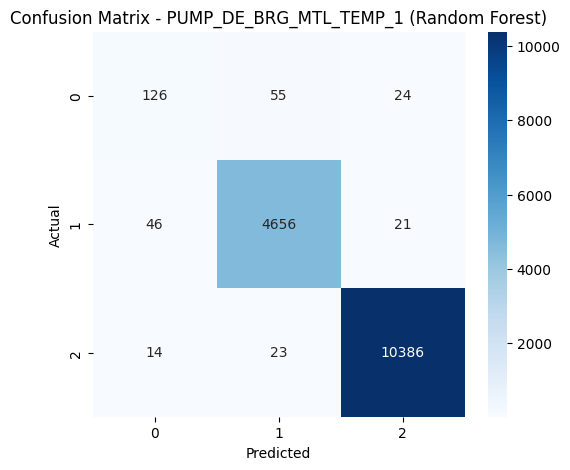

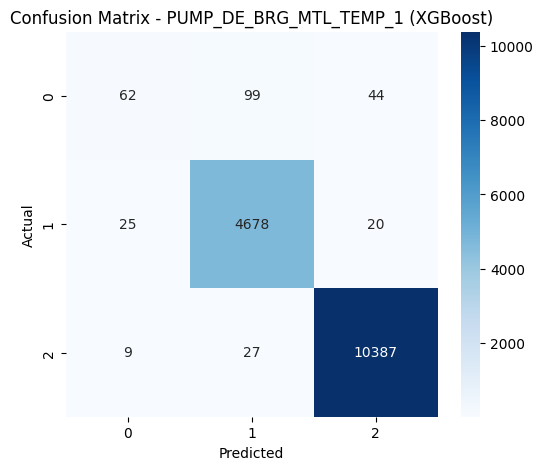

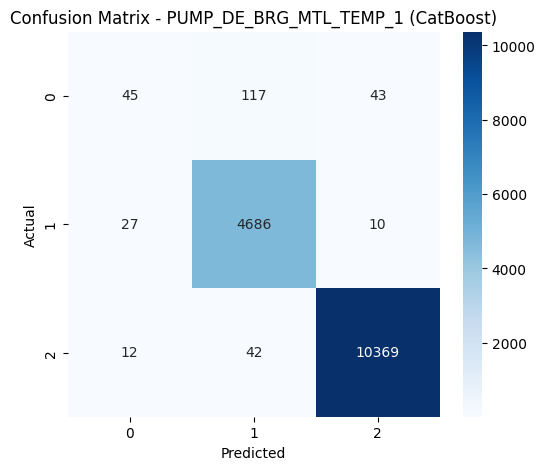


📌 Plotting Confusion Matrices for: PUMP_NDE_BRG_MTL_TEMP_1


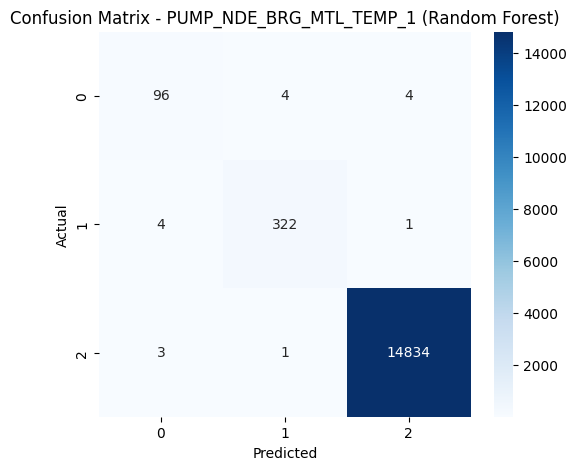

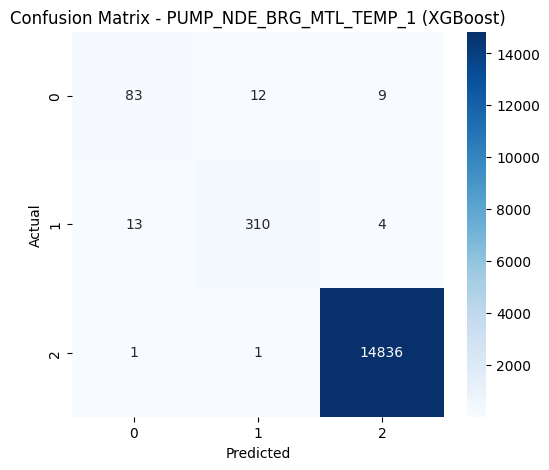

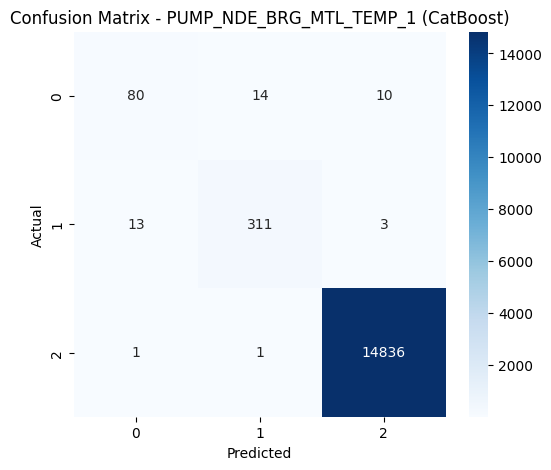


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_1


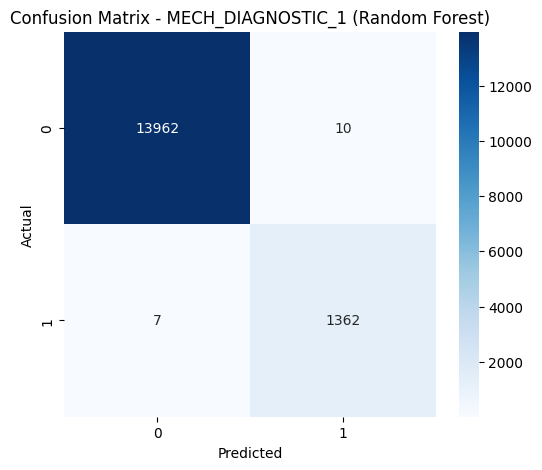

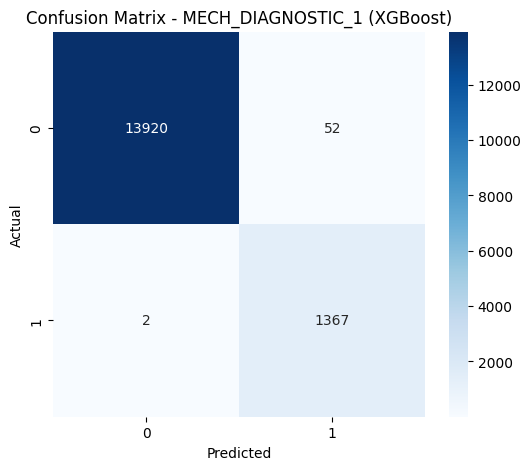

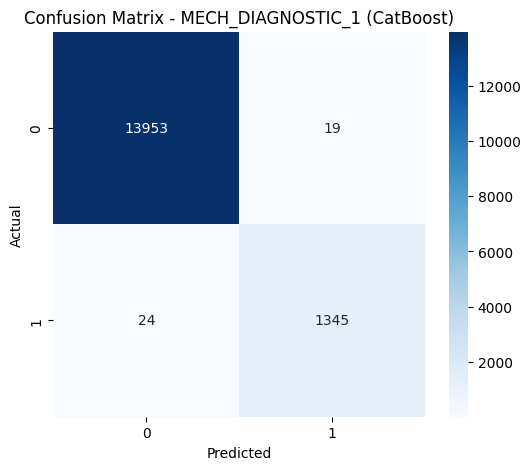


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_2


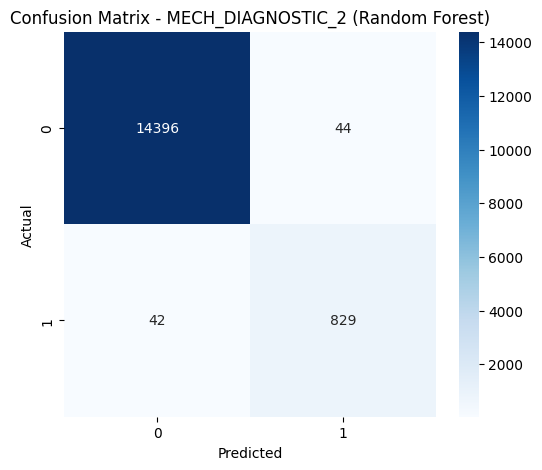

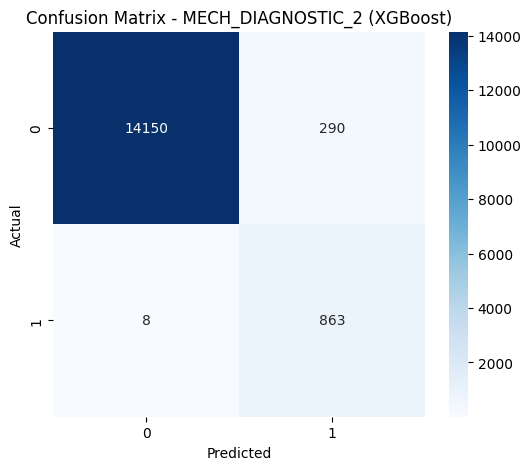

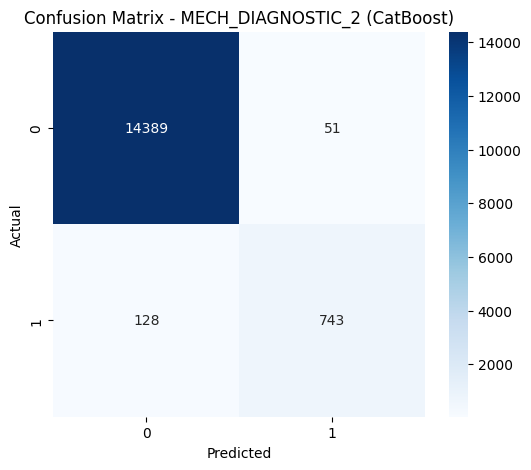


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_3


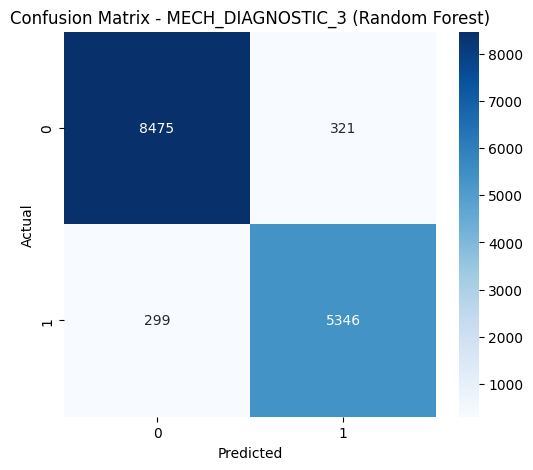

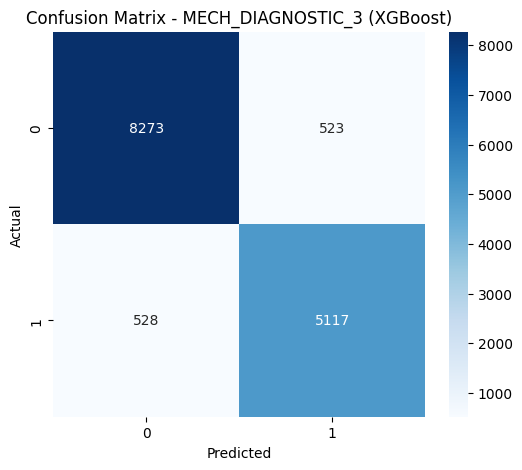

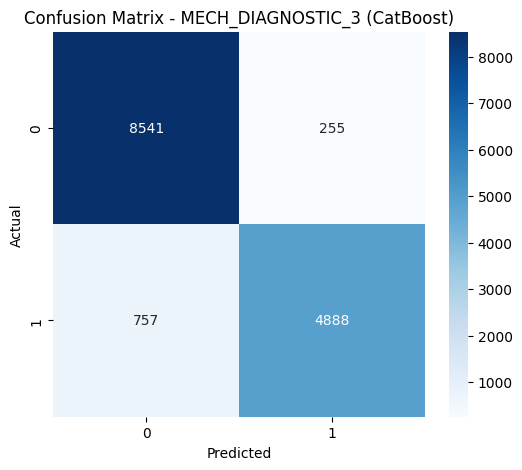


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_4


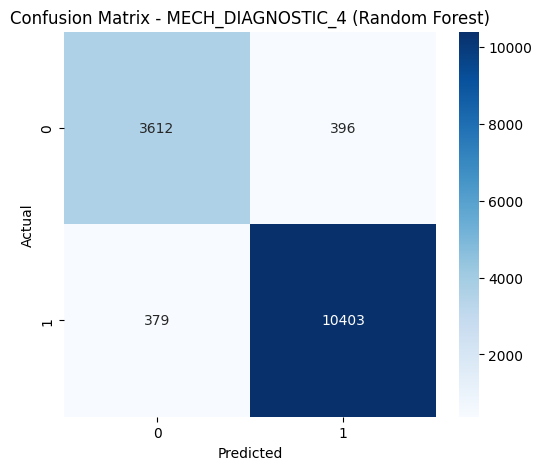

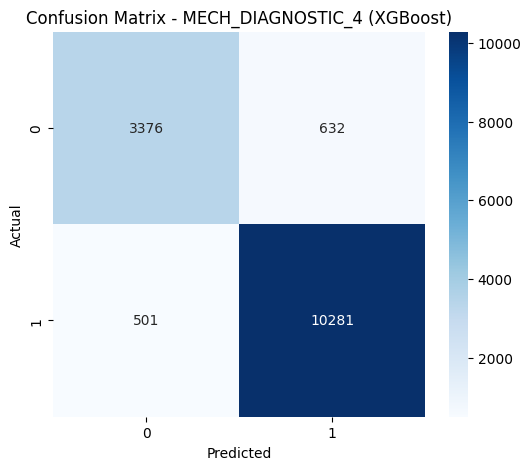

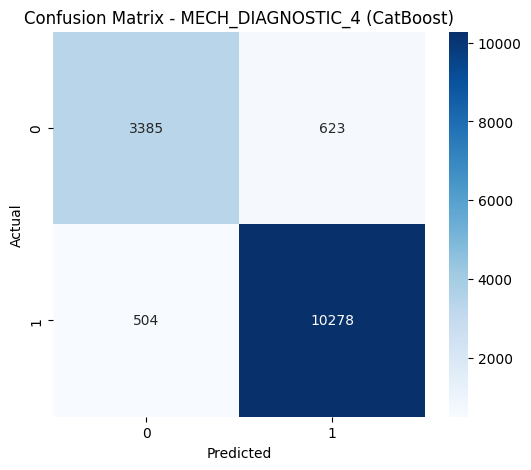

In [50]:
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler

def train_models(X, y, sheet):
    """Train models using best manually assigned hyperparameters."""
    if len(np.unique(y)) == 1:
        print(f"⚠ Skipping {sheet} (Single-Class Data)")
        return {}, None, None, None 

    # Encode categorical target variable (convert labels to numbers)
    le = LabelEncoder()
    y = le.fit_transform(y)

    # Store original feature names BEFORE scaling
    training_features_per_sheet[sheet] = X.columns.tolist()

    # Feature Scaling
    scaler = StandardScaler()
    X = scaler.fit_transform(X)


    # **Train-test split (80-20)**
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    # **Stratified K-Fold Cross-Validation (5-fold)**
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # **Compute Class Weights for Imbalanced Data**
    class_counts = np.bincount(y_train)
    class_weights = {i: max(class_counts) / count for i, count in enumerate(class_counts) if count > 0}
    xgb_scale_pos_weight = class_weights.get(1, 1)

    # **Manually Assigned Best Hyperparameters**
    hyperparams = {
        "PUMP_DE_BRG_MTL_TEMP_1": {
            "Random Forest": {
                "n_estimators": 193,  
                "max_depth": 19,  
                "min_samples_split": 2,  # Rounded from 2.836  
                "min_samples_leaf": 1,  # Rounded from 1.143  
                "max_features": 0.04778,  
            },
            "XGBoost": {
                "n_estimators": 415,  
                "max_depth": 15,  # Rounded from 14.98  
                "learning_rate": 0.1208,  
                "colsample_bytree": 0.7539,  
                "subsample": 0.513,  
                "gamma": 0.07032,  
            },
            "CatBoost": {
                "iterations": 412,  
                "depth": 10,  # Rounded from 9.607  
                "learning_rate": 0.2913,  
                "l2_leaf_reg": 3.247,  
            },
        },

        "PUMP_NDE_BRG_MTL_TEMP_1": {
            "Random Forest": {
                "n_estimators": 282,  
                "max_depth": 20,  # Rounded from 20.3  
                "min_samples_split": 5,  # Rounded from 4.931  
                "min_samples_leaf": 2,  # Rounded from 2.169  
                "max_features": 0.1395,  
            },
            "XGBoost": {
                "n_estimators": 319,  
                "max_depth": 14,  # Rounded from 14.29  
                "learning_rate": 0.1074,  
                "colsample_bytree": 0.9378,  
                "subsample": 0.6121,  
                "gamma": 0.1673,  
            },
            "CatBoost": {
                "iterations": 412,  
                "depth": 10,  # Rounded from 9.607  
                "learning_rate": 0.2913,  
                "l2_leaf_reg": 3.247,  
            },
        },

        "MECH_DIAGNOSTIC_1": {
            "Random Forest": {
                "n_estimators": 186,  
                "max_depth": 29,  # Rounded from 29.07  
                "min_samples_split": 5,  # Rounded from 5.035  
                "min_samples_leaf": 2,  # Rounded from 1.504  
                "max_features": 0.9497,  
            },
            "XGBoost": {
                "n_estimators": 304,  
                "max_depth": 15,  # Rounded from 14.92  
                "learning_rate": 0.2458,  
                "colsample_bytree": 0.8762,  
                "subsample": 0.5152,  
                "gamma": 0.2623,  
            },
            "CatBoost": {
                "iterations": 357,  
                "depth": 8,  # Rounded from 7.881  
                "learning_rate": 0.1934,  
                "l2_leaf_reg": 8.312,  
            },
        },

        "MECH_DIAGNOSTIC_2": {
            "Random Forest": {
                "n_estimators": 282,  
                "max_depth": 20,  # Rounded from 20.3  
                "min_samples_split": 5,  # Rounded from 4.931  
                "min_samples_leaf": 2,  # Rounded from 2.169  
                "max_features": 0.1395,  
            },
            "XGBoost": {
                "n_estimators": 342,  
                "max_depth": 15,  # Rounded from 14.59  
                "learning_rate": 0.205,  
                "colsample_bytree": 0.9707,  
                "subsample": 0.8579,  
                "gamma": 0.0111,  
            },
            "CatBoost": {
                "iterations": 247,  
                "depth": 7,  # Rounded from 6.936  
                "learning_rate": 0.27,  
                "l2_leaf_reg": 3.697,  
            },
        },

        "MECH_DIAGNOSTIC_3": {
            "Random Forest": {
                "n_estimators": 282,  
                "max_depth": 20,  # Rounded from 20.3  
                "min_samples_split": 5,  # Rounded from 4.931  
                "min_samples_leaf": 2,  # Rounded from 2.169  
                "max_features": 0.1395,  
            },
            "XGBoost": {
                "n_estimators": 334,  
                "max_depth": 11,  # Rounded from 11.11  
                "learning_rate": 0.278,  
                "colsample_bytree": 0.7647,  
                "subsample": 0.5926,  
                "gamma": 0.2815,  
            },
            "CatBoost": {
                "iterations": 415,  
                "depth": 12,  # Rounded from 11.85  
                "learning_rate": 0.1595,  
                "l2_leaf_reg": 8.147,  
            },
        },

        "MECH_DIAGNOSTIC_4": {
            "Random Forest": {
                "n_estimators": 416,  
                "max_depth": 28,  # Rounded from 27.64  
                "min_samples_split": 3,  # Rounded from 2.504  
                "min_samples_leaf": 2,  # Rounded from 2.498  
                "max_features": 0.6696,  
            },
            "XGBoost": {
                "n_estimators": 297,  
                "max_depth": 14,  # Rounded from 14.18  
                "learning_rate": 0.2937,  
                "colsample_bytree": 0.8157,  
                "subsample": 0.7579,  
                "gamma": 0.1085,  
            },
            "CatBoost": {
                "iterations": 412,  
                "depth": 10,  # Rounded from 10.4  
                "learning_rate": 0.1872,  
                "l2_leaf_reg": 3.107,  
            },
        },
    }

    # Select best parameters for the current sheet
    best_params = hyperparams.get(sheet, {})

    # **Define Models with Manually Assigned Hyperparameters**
    models = {
        "Random Forest": RandomForestClassifier(
            **best_params.get("Random Forest", {}),
            class_weight="balanced", random_state=42
        ),
        "XGBoost": XGBClassifier(
            **best_params.get("XGBoost", {}),
            eval_metric="mlogloss", use_label_encoder=False
        ),
        "CatBoost": CatBoostClassifier(
            **best_params.get("CatBoost", {}),
            verbose=0
        )
    }

    best_models = {}

    for model_name, model in models.items():
        print(f"\n🚀 Training {model_name} on {sheet} (with Hyperparameter Tuning)...")

        # **Apply Cross-Validation**
        cv_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring="accuracy", n_jobs=-1)
        print(f"✅ {model_name} Cross-Validation Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")

        # **Train the model on training data**
        model.fit(X_train, y_train)

        # **Predictions on test data**
        y_pred = model.predict(X_test)

        # **Final Test Accuracy**
        accuracy = accuracy_score(y_test, y_pred)
        print(f"✅ {model_name} Test Accuracy: {accuracy:.4f}")

        # **Classification Report**
        print("📊 Classification Report:")
        print(classification_report(y_test, y_pred))

        # **Display Confusion Matrix**
        display_confusion_matrix(y_test, y_pred, sheet, model_name)

        best_models[model_name] = model

    return best_models, X_test, y_test, le, scaler

# **Loop Through Each Sheet and Train Models with Manually Assigned Hyperparameters**
best_models_per_sheet = {}
test_data_per_sheet = {}  # Store test data
label_encoders = {}  # Store label encoders
scalers = {}  # Store scalers

for sheet, df in filtered_pump_data.items():
    print(f"\n📌 Processing sheet: {sheet}")

    diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
    if diag_col:
        diag_col = diag_col[0]

        X = df.drop(columns=[diag_col])
        y = df[diag_col].values

        # Train models and get test data
        models, X_test, y_test, le, scaler = train_models(X, y, sheet)
      
        best_models_per_sheet[sheet] = models
        test_data_per_sheet[sheet] = (X_test, y_test)
        label_encoders[sheet] = le
        scalers[sheet] = scaler

# Loop through each sheet and plot confusion matrices
for sheet_name in confusion_results.keys():
    print(f"\n📌 Plotting Confusion Matrices for: {sheet_name}")
    plot_confusion_matrices({sheet_name: confusion_results[sheet_name]})



📌 Processing sheet: PUMP_DE_BRG_MTL_TEMP_1

🚀 Training Random Forest on PUMP_DE_BRG_MTL_TEMP_1 (with Hyperparameter Tuning)...
✅ Random Forest Cross-Validation Accuracy: 0.9888 ± 0.0008
✅ Random Forest Test Accuracy: 0.9881
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.61      0.64       205
           1       0.98      0.99      0.98      4723
           2       1.00      1.00      1.00     10423

    accuracy                           0.99     15351
   macro avg       0.88      0.87      0.87     15351
weighted avg       0.99      0.99      0.99     15351


🌀 Confusion Matrix - PUMP_DE_BRG_MTL_TEMP_1 (Random Forest):
[[  126    55    24]
 [   46  4657    20]
 [   16    22 10385]]

🚀 Training XGBoost on PUMP_DE_BRG_MTL_TEMP_1 (with Hyperparameter Tuning)...
✅ XGBoost Cross-Validation Accuracy: 0.9856 ± 0.0008


c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [13:58:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9855
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.38      0.47       205
           1       0.98      0.99      0.98      4723
           2       0.99      1.00      1.00     10423

    accuracy                           0.99     15351
   macro avg       0.86      0.79      0.81     15351
weighted avg       0.98      0.99      0.98     15351


🌀 Confusion Matrix - PUMP_DE_BRG_MTL_TEMP_1 (XGBoost):
[[   78    89    38]
 [   41  4665    17]
 [   11    26 10386]]

🚀 Training CatBoost on PUMP_DE_BRG_MTL_TEMP_1 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9861 ± 0.0011
✅ CatBoost Test Accuracy: 0.9853
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.31      0.41       205
           1       0.97      0.99      0.98      4723
           2       0.99      1.00      1.00     10423

    accuracy                     

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [14:00:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9974
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       104
           1       0.96      0.95      0.95       327
           2       1.00      1.00      1.00     14838

    accuracy                           1.00     15269
   macro avg       0.94      0.92      0.93     15269
weighted avg       1.00      1.00      1.00     15269


🌀 Confusion Matrix - PUMP_NDE_BRG_MTL_TEMP_1 (XGBoost):
[[   83    12     9]
 [   13   310     4]
 [    1     1 14836]]

🚀 Training CatBoost on PUMP_NDE_BRG_MTL_TEMP_1 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9973 ± 0.0004
✅ CatBoost Test Accuracy: 0.9973
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.79      0.82       104
           1       0.96      0.95      0.95       327
           2       1.00      1.00      1.00     14838

    accuracy                   

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [14:02:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9969
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13972
           1       0.98      0.98      0.98      1369

    accuracy                           1.00     15341
   macro avg       0.99      0.99      0.99     15341
weighted avg       1.00      1.00      1.00     15341


🌀 Confusion Matrix - MECH_DIAGNOSTIC_1 (XGBoost):
[[13946    26]
 [   22  1347]]

🚀 Training CatBoost on MECH_DIAGNOSTIC_1 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9975 ± 0.0004
✅ CatBoost Test Accuracy: 0.9972
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13972
           1       0.99      0.98      0.98      1369

    accuracy                           1.00     15341
   macro avg       0.99      0.99      0.99     15341
weighted avg       1.00      1.00      1.00     15341


🌀 Confusion Matrix -

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [14:02:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9887
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     14440
           1       0.93      0.87      0.90       871

    accuracy                           0.99     15311
   macro avg       0.96      0.93      0.95     15311
weighted avg       0.99      0.99      0.99     15311


🌀 Confusion Matrix - MECH_DIAGNOSTIC_2 (XGBoost):
[[14379    61]
 [  112   759]]

🚀 Training CatBoost on MECH_DIAGNOSTIC_2 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9876 ± 0.0006
✅ CatBoost Test Accuracy: 0.9886
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     14440
           1       0.93      0.86      0.90       871

    accuracy                           0.99     15311
   macro avg       0.96      0.93      0.94     15311
weighted avg       0.99      0.99      0.99     15311


🌀 Confusion Matrix -

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [14:03:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9367
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      8796
           1       0.94      0.90      0.92      5645

    accuracy                           0.94     14441
   macro avg       0.94      0.93      0.93     14441
weighted avg       0.94      0.94      0.94     14441


🌀 Confusion Matrix - MECH_DIAGNOSTIC_3 (XGBoost):
[[8457  339]
 [ 575 5070]]

🚀 Training CatBoost on MECH_DIAGNOSTIC_3 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9328 ± 0.0016
✅ CatBoost Test Accuracy: 0.9353
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      8796
           1       0.95      0.89      0.91      5645

    accuracy                           0.94     14441
   macro avg       0.94      0.93      0.93     14441
weighted avg       0.94      0.94      0.93     14441


🌀 Confusion Matrix - MEC

c:\Users\HP OMEN\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [14:07:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


✅ XGBoost Test Accuracy: 0.9260
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.85      0.86      4008
           1       0.94      0.96      0.95     10782

    accuracy                           0.93     14790
   macro avg       0.91      0.90      0.91     14790
weighted avg       0.93      0.93      0.93     14790


🌀 Confusion Matrix - MECH_DIAGNOSTIC_4 (XGBoost):
[[ 3399   609]
 [  485 10297]]

🚀 Training CatBoost on MECH_DIAGNOSTIC_4 (with Hyperparameter Tuning)...
✅ CatBoost Cross-Validation Accuracy: 0.9197 ± 0.0040
✅ CatBoost Test Accuracy: 0.9275
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.86      0.87      4008
           1       0.95      0.95      0.95     10782

    accuracy                           0.93     14790
   macro avg       0.91      0.91      0.91     14790
weighted avg       0.93      0.93      0.93     14790


🌀 Confusion Matrix -

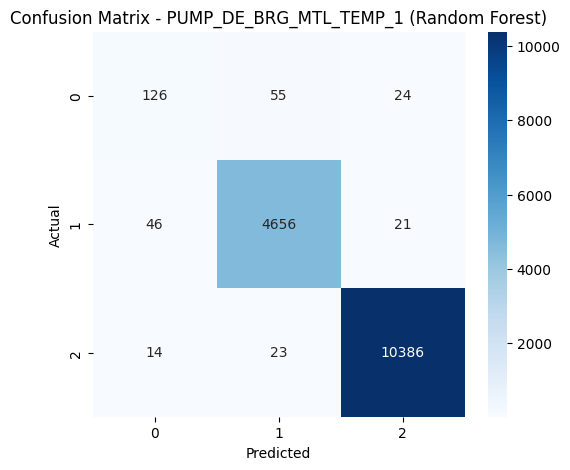

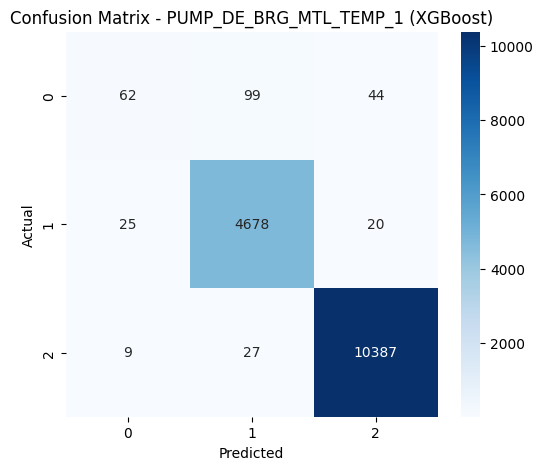

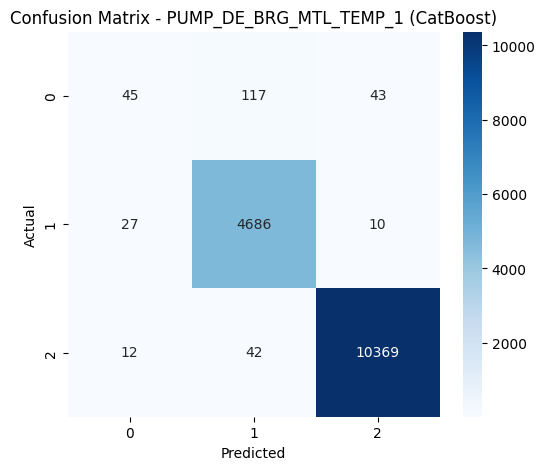

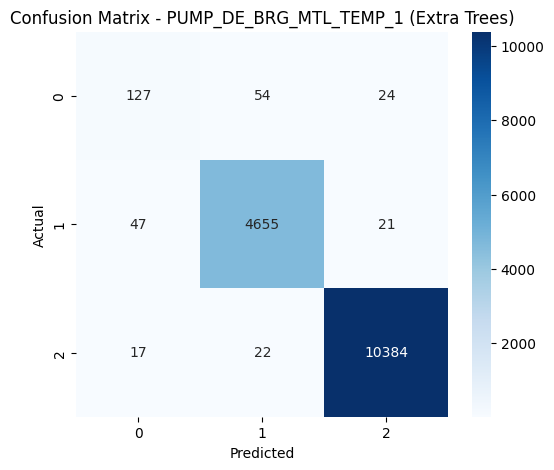

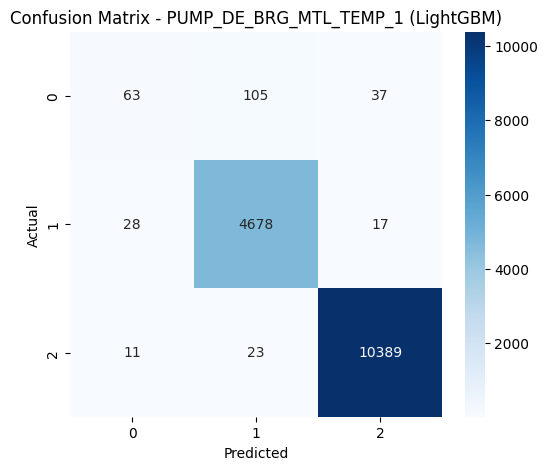

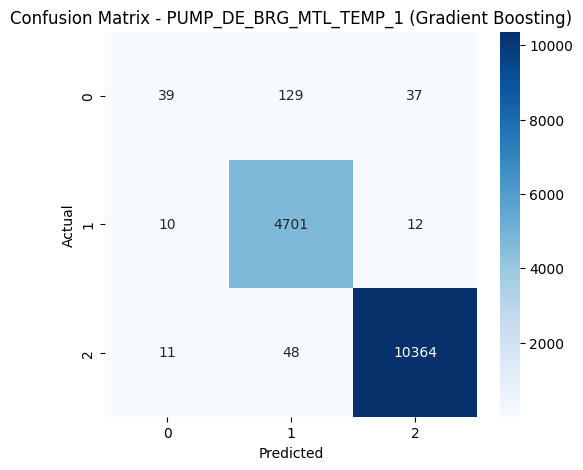

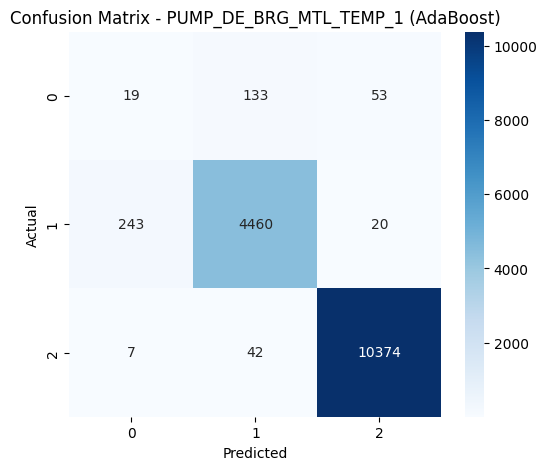

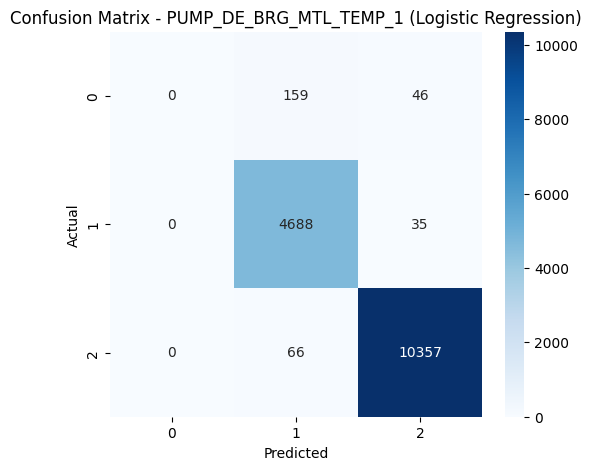

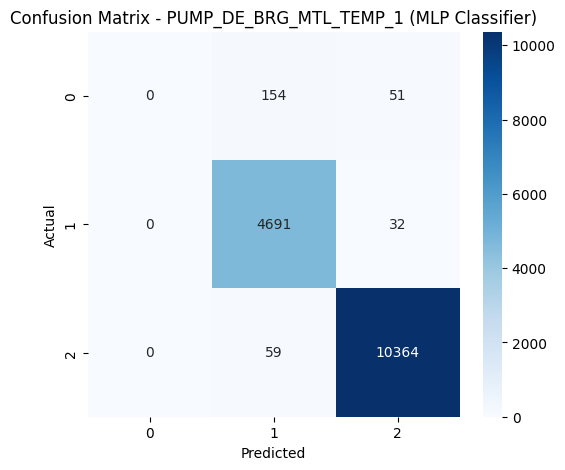


📌 Plotting Confusion Matrices for: PUMP_NDE_BRG_MTL_TEMP_1


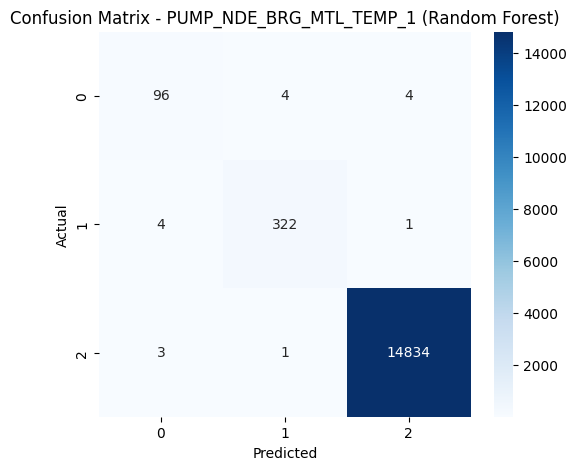

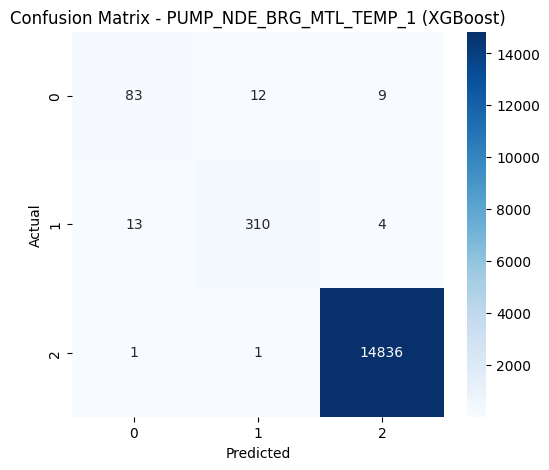

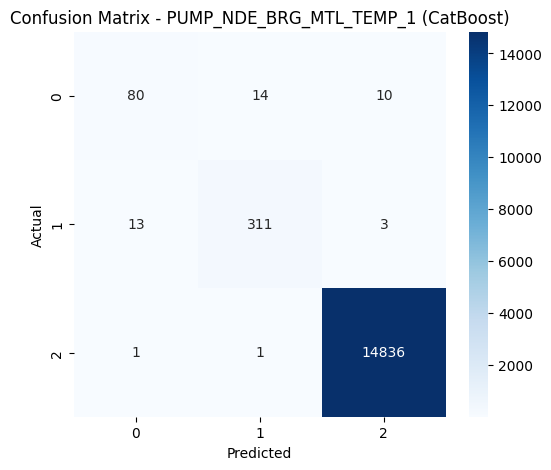

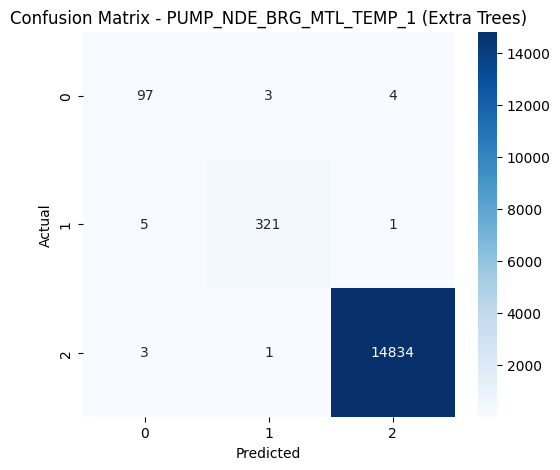

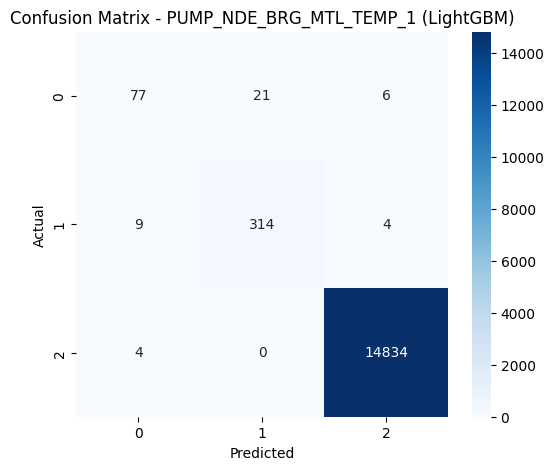

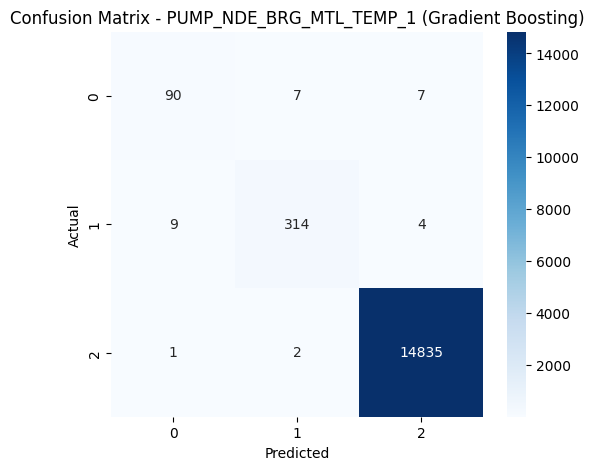

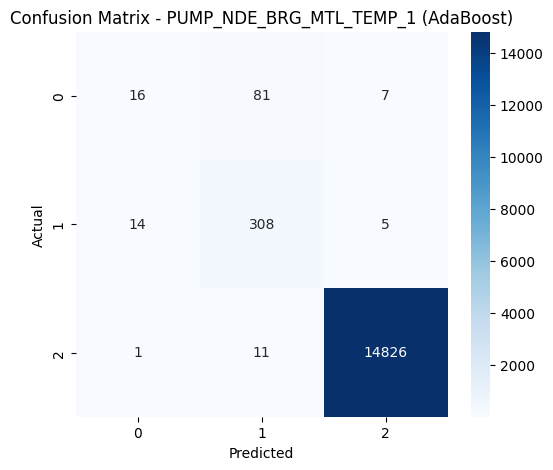

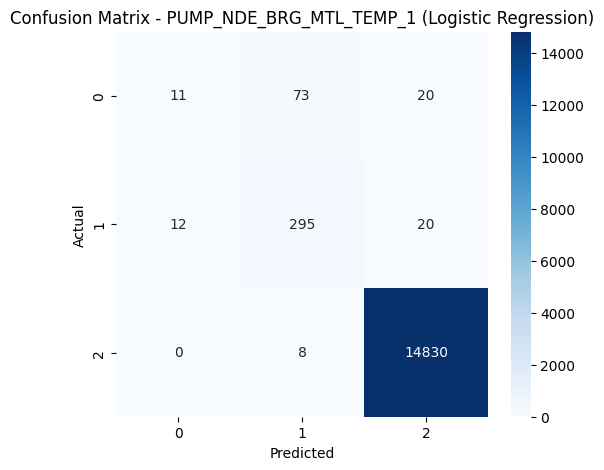

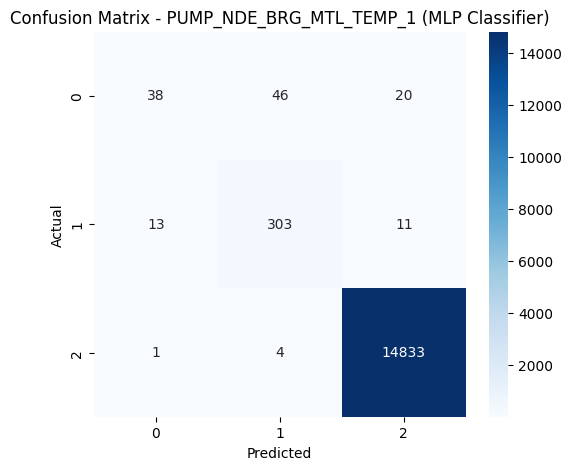


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_1


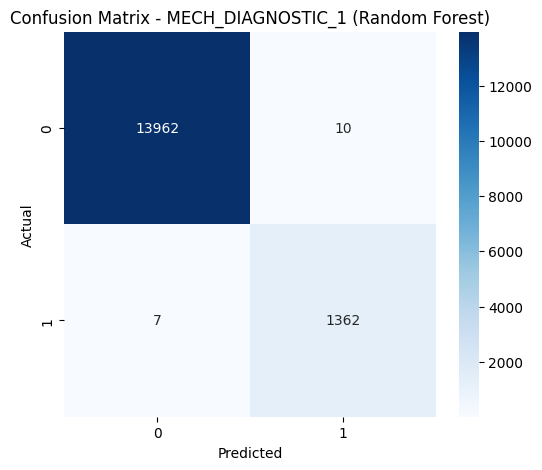

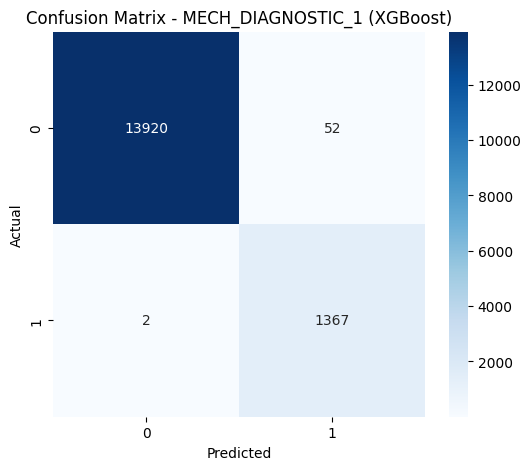

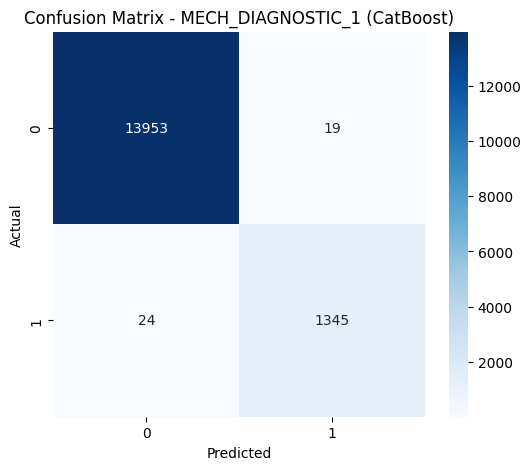

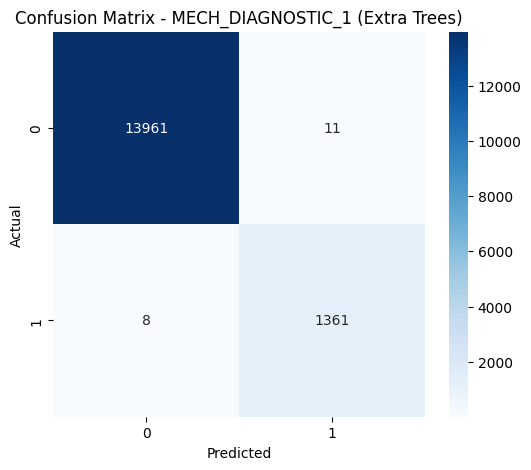

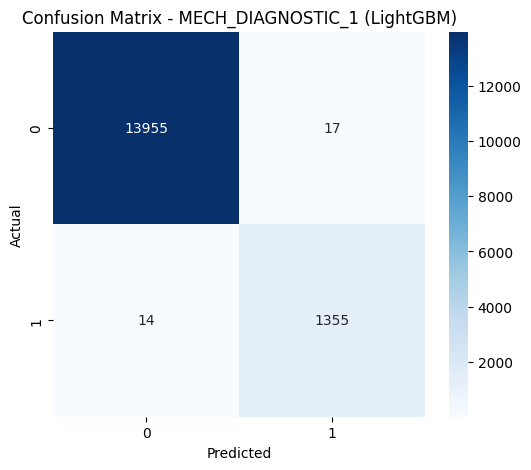

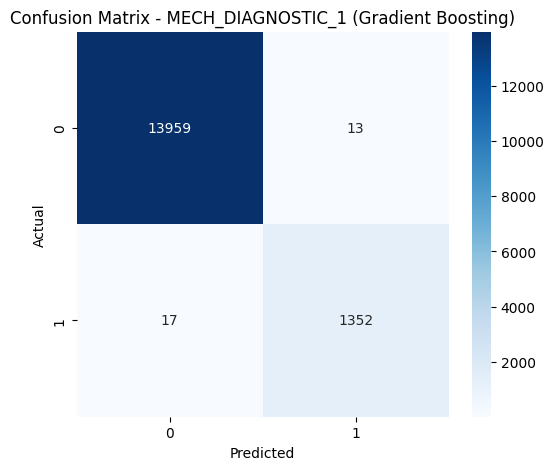

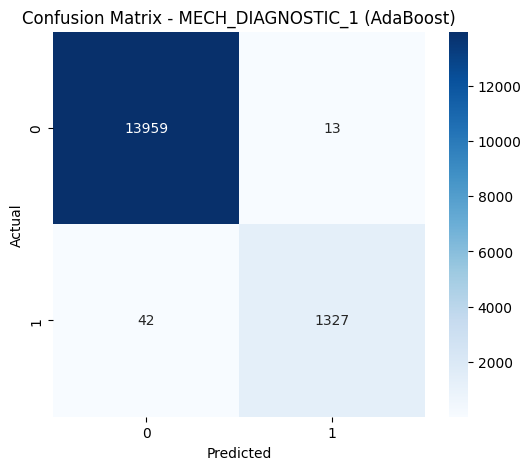

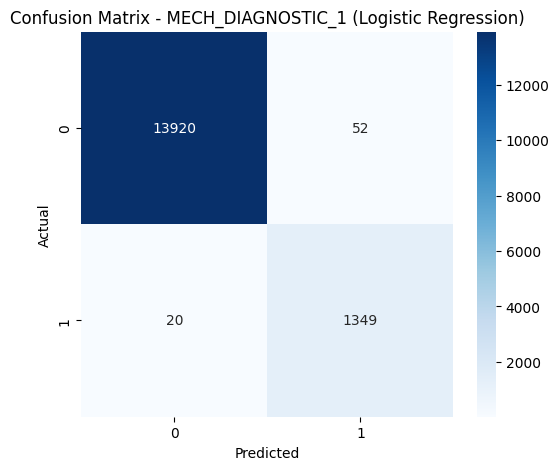

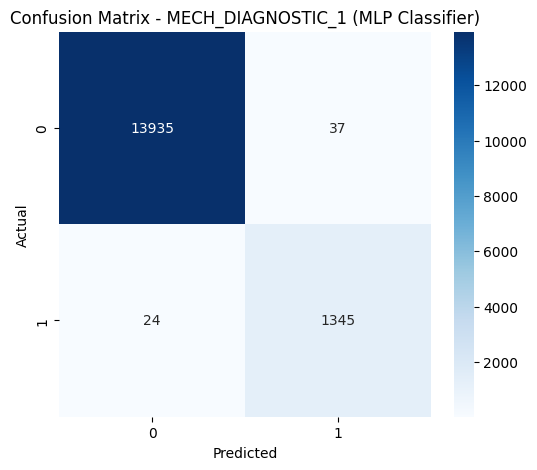


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_2


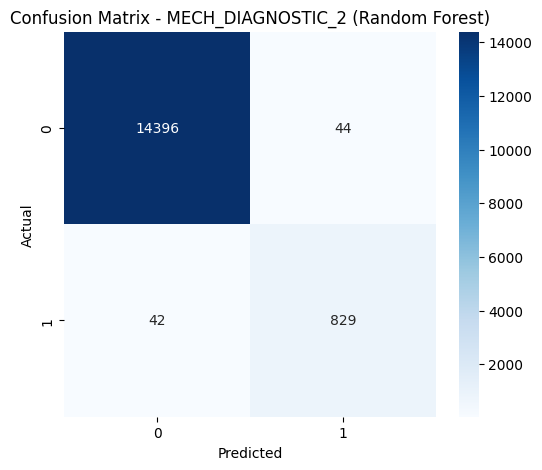

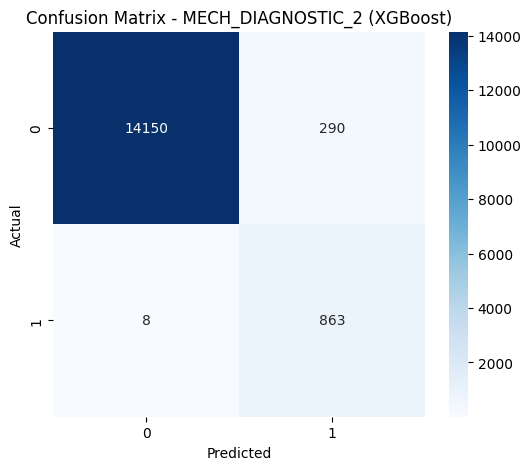

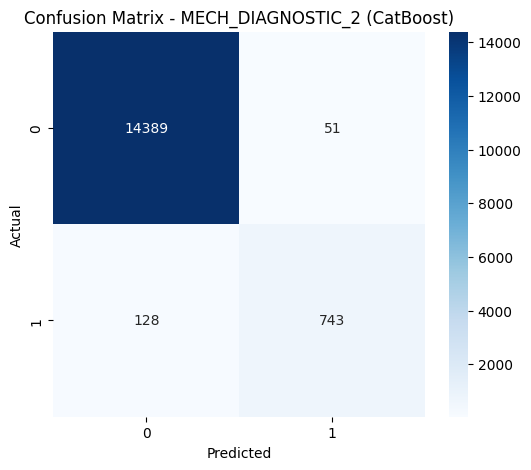

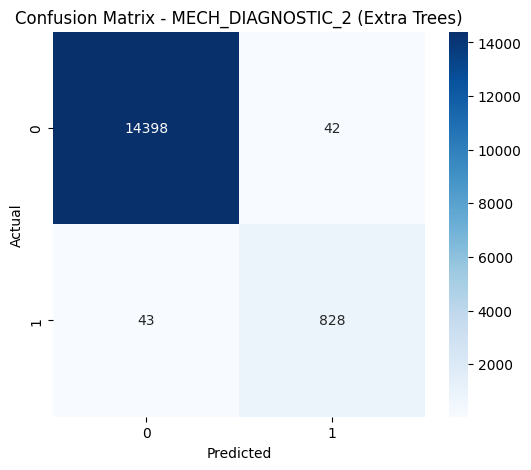

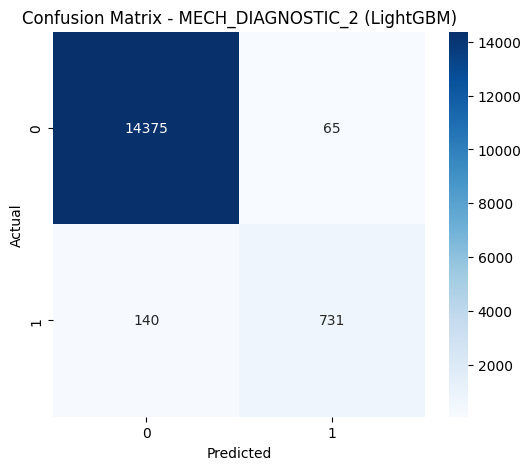

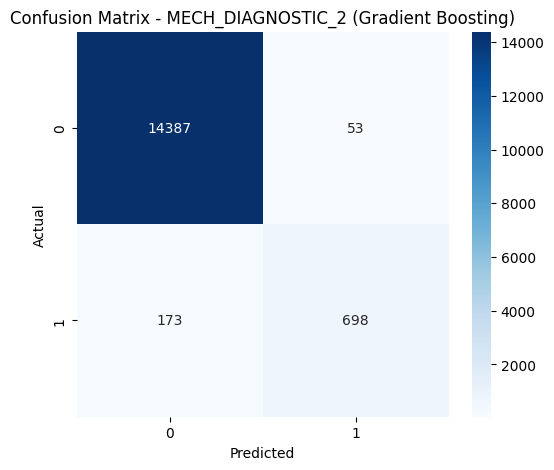

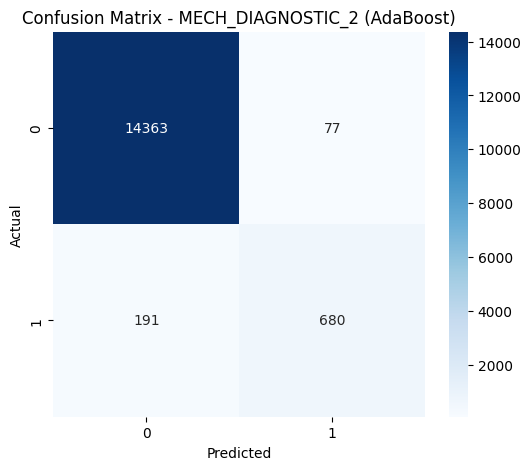

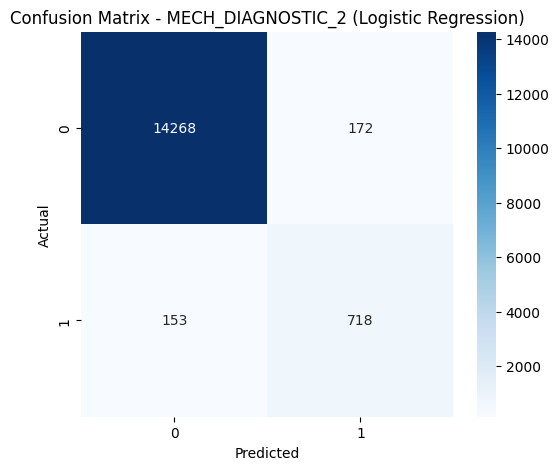

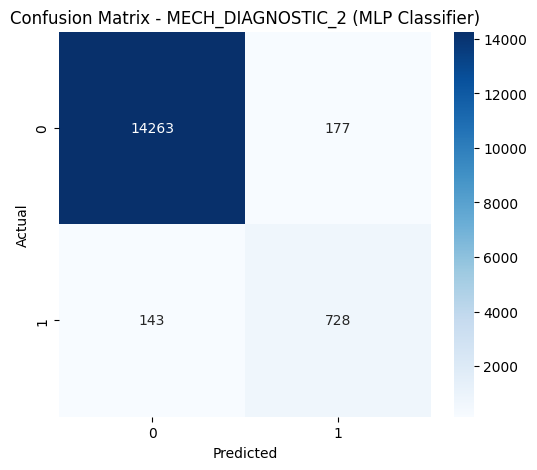


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_3


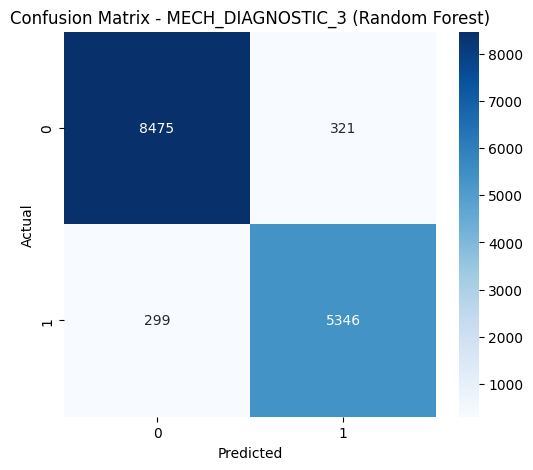

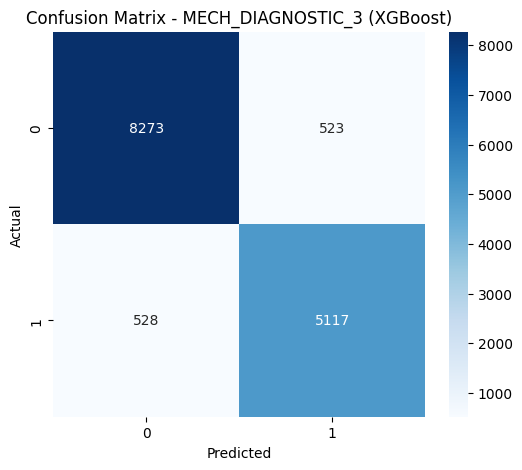

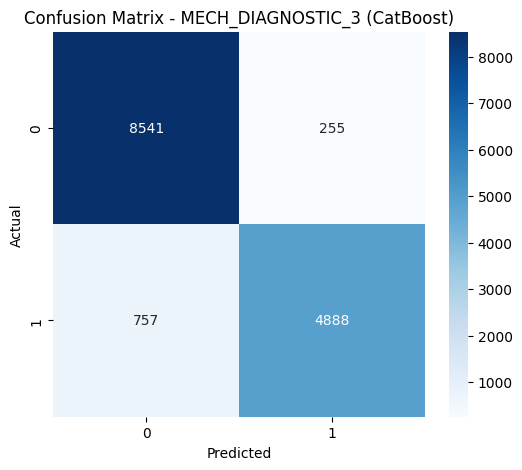

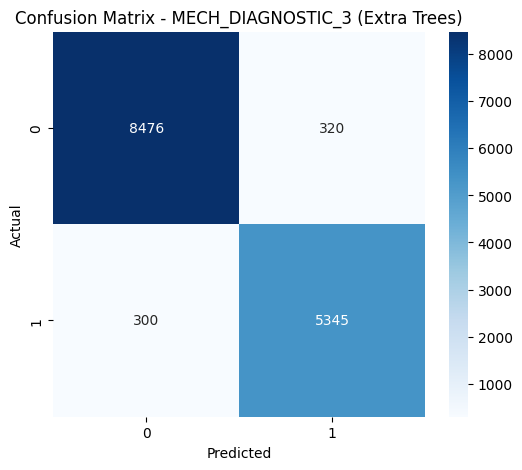

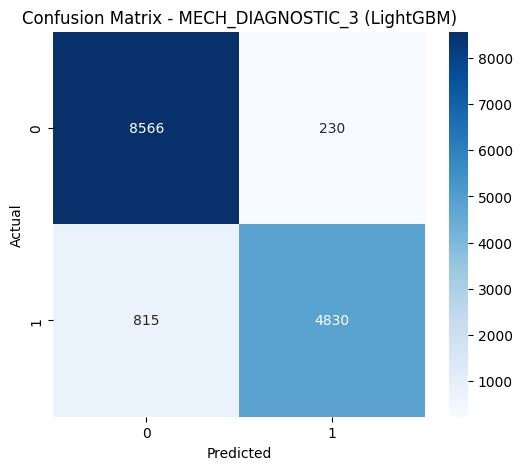

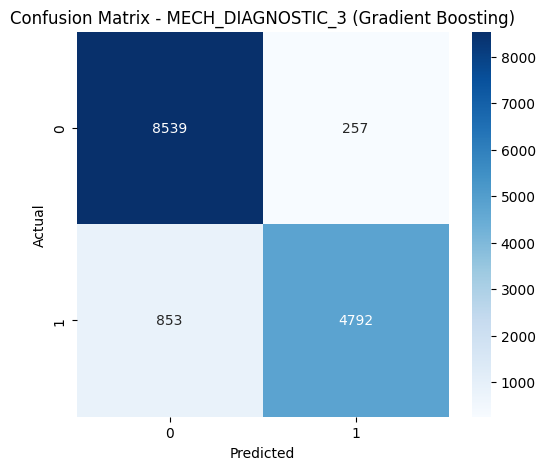

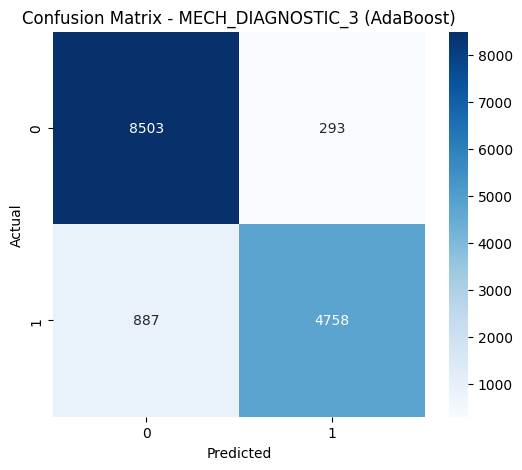

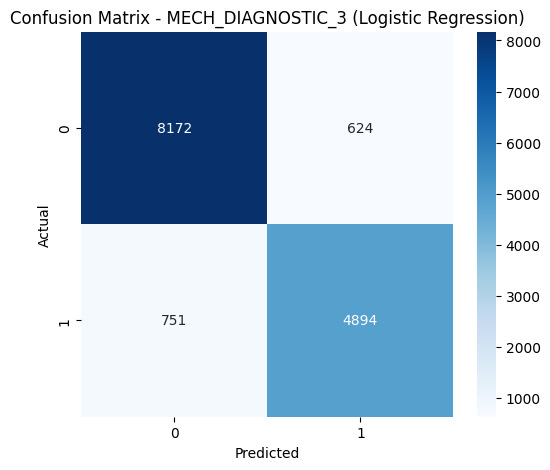

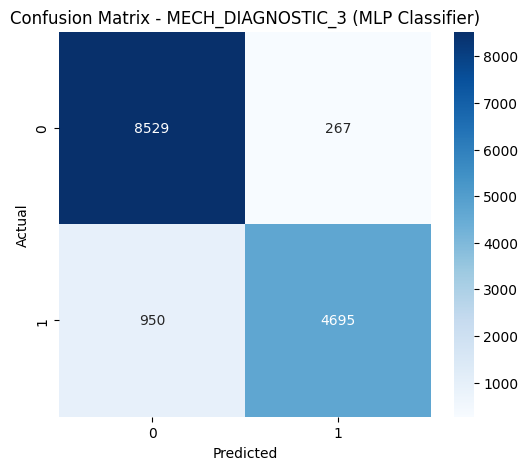


📌 Plotting Confusion Matrices for: MECH_DIAGNOSTIC_4


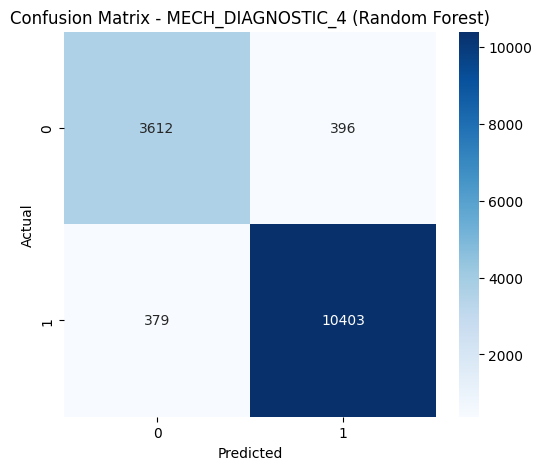

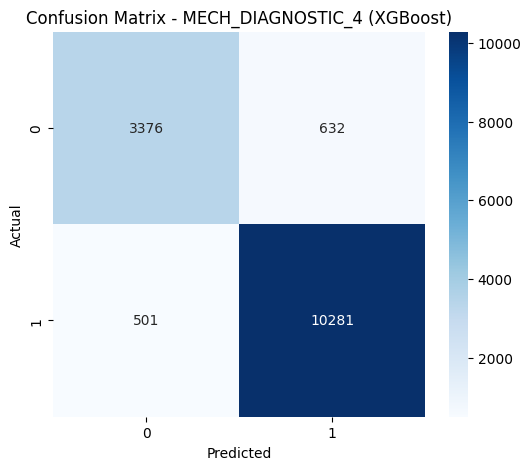

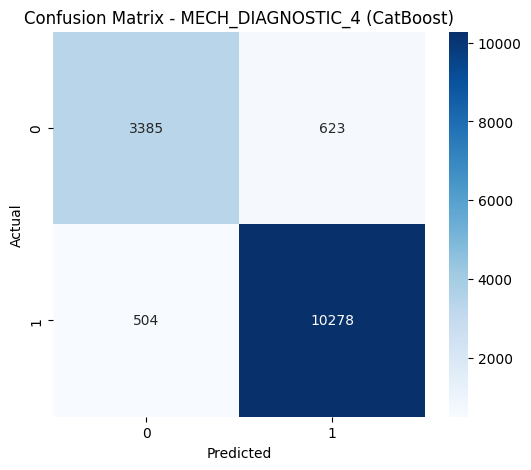

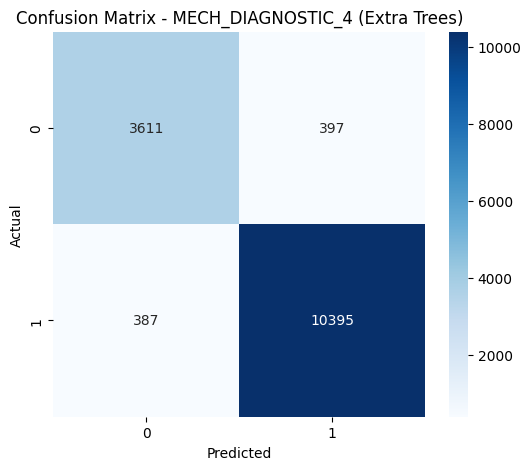

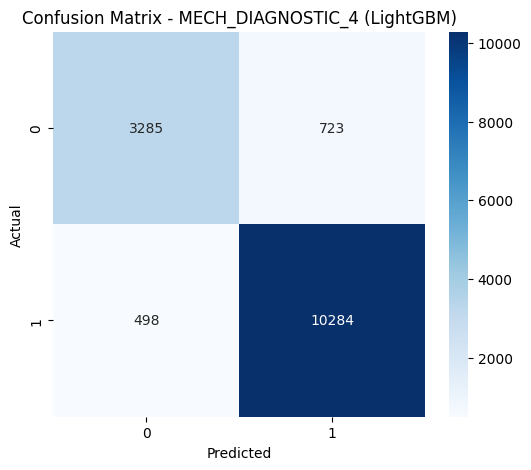

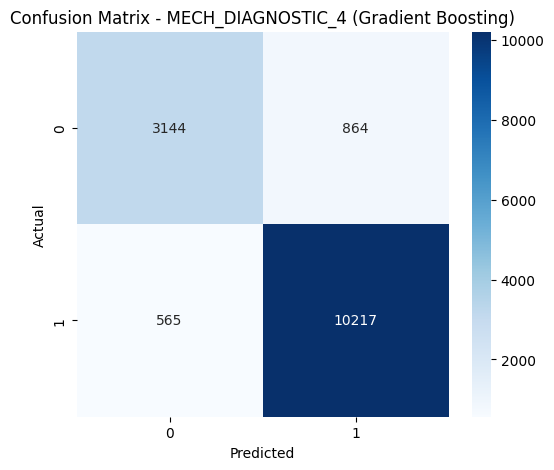

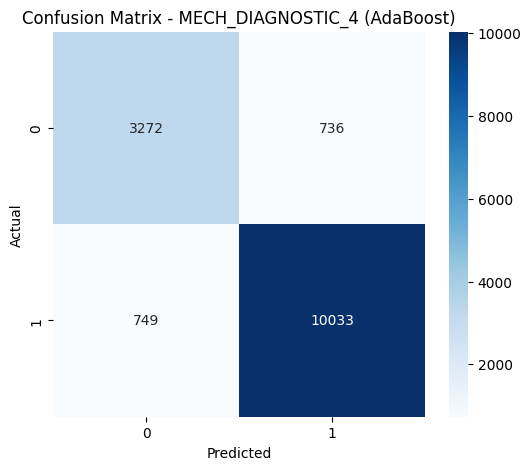

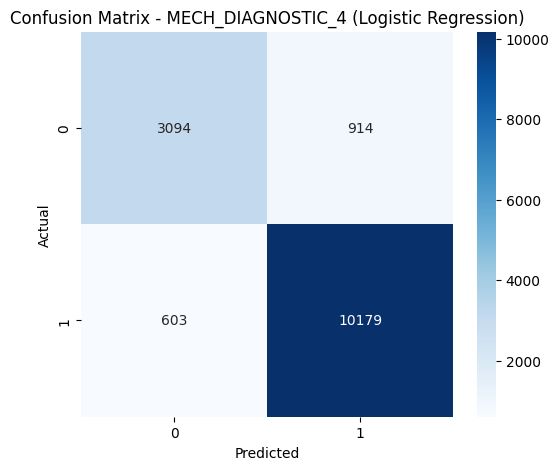

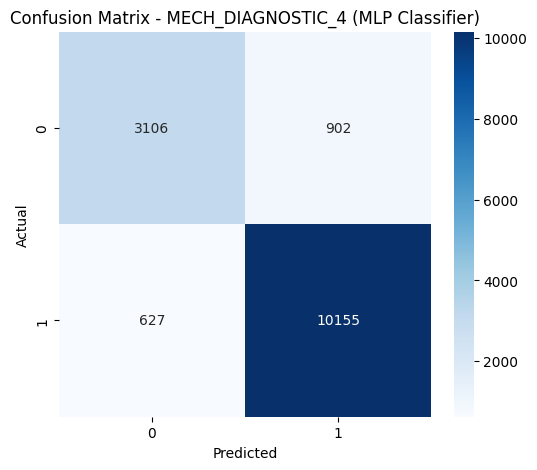

In [56]:
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler

def train_models(X, y, sheet):
    """Train models using best manually assigned hyperparameters."""
    if len(np.unique(y)) == 1:
        print(f"⚠ Skipping {sheet} (Single-Class Data)")
        return {}, None, None 

    # Encode categorical target variable (convert labels to numbers)
    le = LabelEncoder()
    y = le.fit_transform(y)

    # Store original feature names BEFORE scaling
    training_features_per_sheet[sheet] = X.columns.tolist()

    # Feature Scaling
    scaler = StandardScaler()
    X = scaler.fit_transform(X)


    # **Train-test split (80-20)**
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    # **Stratified K-Fold Cross-Validation (5-fold)**
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # **Compute Class Weights for Imbalanced Data**
    class_counts = np.bincount(y_train)
    class_weights = {i: max(class_counts) / count for i, count in enumerate(class_counts) if count > 0}
    xgb_scale_pos_weight = class_weights.get(1, 1)

    # **Manually Assigned Best Hyperparameters**
    hyperparams = {
        "PUMP_DE_BRG_MTL_TEMP_1": {
            "Random Forest": {
                "n_estimators": 193,  
                "max_depth": 19,  
                "min_samples_split": 2,  # Rounded from 2.836  
                "min_samples_leaf": 1,  # Rounded from 1.143  
                "max_features": 0.04778,  
            },
            "XGBoost": {
                "n_estimators": 415,  
                "max_depth": 15,  # Rounded from 14.98  
                "learning_rate": 0.1208,  
                "colsample_bytree": 0.7539,  
                "subsample": 0.513,  
                "gamma": 0.07032,  
            },
            "CatBoost": {
                "iterations": 412,  
                "depth": 10,  # Rounded from 9.607  
                "learning_rate": 0.2913,  
                "l2_leaf_reg": 3.247,  
            },
        },

        "PUMP_NDE_BRG_MTL_TEMP_1": {
            "Random Forest": {
                "n_estimators": 282,  
                "max_depth": 20,  # Rounded from 20.3  
                "min_samples_split": 5,  # Rounded from 4.931  
                "min_samples_leaf": 2,  # Rounded from 2.169  
                "max_features": 0.1395,  
            },
            "XGBoost": {
                "n_estimators": 319,  
                "max_depth": 14,  # Rounded from 14.29  
                "learning_rate": 0.1074,  
                "colsample_bytree": 0.9378,  
                "subsample": 0.6121,  
                "gamma": 0.1673,  
            },
            "CatBoost": {
                "iterations": 412,  
                "depth": 10,  # Rounded from 9.607  
                "learning_rate": 0.2913,  
                "l2_leaf_reg": 3.247,  
            },
        },

        "MECH_DIAGNOSTIC_1": {
            "Random Forest": {
                "n_estimators": 186,  
                "max_depth": 29,  # Rounded from 29.07  
                "min_samples_split": 5,  # Rounded from 5.035  
                "min_samples_leaf": 2,  # Rounded from 1.504  
                "max_features": 0.9497,  
            },
            "XGBoost": {
                "n_estimators": 304,  
                "max_depth": 15,  # Rounded from 14.92  
                "learning_rate": 0.2458,  
                "colsample_bytree": 0.8762,  
                "subsample": 0.5152,  
                "gamma": 0.2623,  
            },
            "CatBoost": {
                "iterations": 357,  
                "depth": 8,  # Rounded from 7.881  
                "learning_rate": 0.1934,  
                "l2_leaf_reg": 8.312,  
            },
        },

        "MECH_DIAGNOSTIC_2": {
            "Random Forest": {
                "n_estimators": 282,  
                "max_depth": 20,  # Rounded from 20.3  
                "min_samples_split": 5,  # Rounded from 4.931  
                "min_samples_leaf": 2,  # Rounded from 2.169  
                "max_features": 0.1395,  
            },
            "XGBoost": {
                "n_estimators": 342,  
                "max_depth": 15,  # Rounded from 14.59  
                "learning_rate": 0.205,  
                "colsample_bytree": 0.9707,  
                "subsample": 0.8579,  
                "gamma": 0.0111,  
            },
            "CatBoost": {
                "iterations": 247,  
                "depth": 7,  # Rounded from 6.936  
                "learning_rate": 0.27,  
                "l2_leaf_reg": 3.697,  
            },
        },

        "MECH_DIAGNOSTIC_3": {
            "Random Forest": {
                "n_estimators": 282,  
                "max_depth": 20,  # Rounded from 20.3  
                "min_samples_split": 5,  # Rounded from 4.931  
                "min_samples_leaf": 2,  # Rounded from 2.169  
                "max_features": 0.1395,  
            },
            "XGBoost": {
                "n_estimators": 334,  
                "max_depth": 11,  # Rounded from 11.11  
                "learning_rate": 0.278,  
                "colsample_bytree": 0.7647,  
                "subsample": 0.5926,  
                "gamma": 0.2815,  
            },
            "CatBoost": {
                "iterations": 415,  
                "depth": 12,  # Rounded from 11.85  
                "learning_rate": 0.1595,  
                "l2_leaf_reg": 8.147,  
            },
        },

        "MECH_DIAGNOSTIC_4": {
            "Random Forest": {
                "n_estimators": 416,  
                "max_depth": 28,  # Rounded from 27.64  
                "min_samples_split": 3,  # Rounded from 2.504  
                "min_samples_leaf": 2,  # Rounded from 2.498  
                "max_features": 0.6696,  
            },
            "XGBoost": {
                "n_estimators": 297,  
                "max_depth": 14,  # Rounded from 14.18  
                "learning_rate": 0.2937,  
                "colsample_bytree": 0.8157,  
                "subsample": 0.7579,  
                "gamma": 0.1085,  
            },
            "CatBoost": {
                "iterations": 412,  
                "depth": 10,  # Rounded from 10.4  
                "learning_rate": 0.1872,  
                "l2_leaf_reg": 3.107,  
            },
        },
    }

    # Select best parameters for the current sheet
    best_params = hyperparams.get(sheet, {})

    # **Define Models with Manually Assigned Hyperparameters**
    models = {
        "Random Forest": RandomForestClassifier(
            **best_params.get("Random Forest", {}),
            class_weight="balanced", random_state=42
        ),
        "XGBoost": XGBClassifier(
            **best_params.get("XGBoost", {}),
            eval_metric="mlogloss", use_label_encoder=False
        ),
        "CatBoost": CatBoostClassifier(
            **best_params.get("CatBoost", {}),
            verbose=0
        )
    }

    best_models = {}

    for model_name, model in models.items():
        print(f"\n🚀 Training {model_name} on {sheet} (with Hyperparameter Tuning)...")

        # **Apply Cross-Validation**
        cv_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring="accuracy", n_jobs=-1)
        print(f"✅ {model_name} Cross-Validation Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")

        # **Train the model on training data**
        model.fit(X_train, y_train)

        # **Predictions on test data**
        y_pred = model.predict(X_test)

        # **Final Test Accuracy**
        accuracy = accuracy_score(y_test, y_pred)
        print(f"✅ {model_name} Test Accuracy: {accuracy:.4f}")

        # **Classification Report**
        print("📊 Classification Report:")
        print(classification_report(y_test, y_pred))

        # **Display Confusion Matrix**
        display_confusion_matrix(y_test, y_pred, sheet, model_name)

        best_models[model_name] = model

    return best_models, X_test, y_test

# **Loop Through Each Sheet and Train Models with Manually Assigned Hyperparameters**
best_models_per_sheet = {}
test_data_per_sheet = {}  # Store test data

for sheet, df in filtered_pump_data.items():
    print(f"\n📌 Processing sheet: {sheet}")

    diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
    if diag_col:
        diag_col = diag_col[0]

        X = df.drop(columns=[diag_col])
        y = df[diag_col].values

        # Train models and get test data
        models, X_test, y_test = train_models(X, y, sheet)

        best_models_per_sheet[sheet] = models
        test_data_per_sheet[sheet] = (X_test, y_test)  # Store test data

# Loop through each sheet and plot confusion matrices
for sheet_name in confusion_results.keys():
    print(f"\n📌 Plotting Confusion Matrices for: {sheet_name}")
    plot_confusion_matrices({sheet_name: confusion_results[sheet_name]})


In [57]:
# #With extra diagnostics (Early Failure Indication)
# from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
# from sklearn.preprocessing import StandardScaler

# def train_models(X, y, sheet):
#     """Train models using best manually assigned hyperparameters."""
#     if len(np.unique(y)) == 1:
#         print(f"⚠ Skipping {sheet} (Single-Class Data)")
#         return {}, None, None 

#     # Encode categorical target variable (convert labels to numbers)
#     le = LabelEncoder()
#     y = le.fit_transform(y)

#     # **Feature Scaling**
#     scaler = StandardScaler()
#     X = scaler.fit_transform(X)

#     # **Train-test split (80-20)**
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

#     # **Stratified K-Fold Cross-Validation (5-fold)**
#     cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

#     # **Compute Class Weights for Imbalanced Data**
#     class_counts = np.bincount(y_train)
#     class_weights = {i: max(class_counts) / count for i, count in enumerate(class_counts) if count > 0}
#     xgb_scale_pos_weight = class_weights.get(1, 1)

#     # **Manually Assigned Best Hyperparameters**
#     hyperparams = {
#         "PUMP_DE_BRG_MTL_TEMP_1": {
#             "Random Forest": {
#                 "n_estimators": 193,  
#                 "max_depth": 19,  
#                 "min_samples_split": 2,  # Rounded from 2.836  
#                 "min_samples_leaf": 1,  # Rounded from 1.143  
#                 "max_features": 0.04778,  
#             },
#             "XGBoost": {
#                 "n_estimators": 415,  
#                 "max_depth": 15,  # Rounded from 14.98  
#                 "learning_rate": 0.1208,  
#                 "colsample_bytree": 0.7539,  
#                 "subsample": 0.513,  
#                 "gamma": 0.07032,  
#             },
#             "CatBoost": {
#                 "iterations": 412,  
#                 "depth": 10,  # Rounded from 9.607  
#                 "learning_rate": 0.2913,  
#                 "l2_leaf_reg": 3.247,  
#             },
#         },

#         "PUMP_NDE_BRG_MTL_TEMP_1": {
#             "Random Forest": {
#                 "n_estimators": 282,  
#                 "max_depth": 20,  # Rounded from 20.3  
#                 "min_samples_split": 5,  # Rounded from 4.931  
#                 "min_samples_leaf": 2,  # Rounded from 2.169  
#                 "max_features": 0.1395,  
#             },
#             "XGBoost": {
#                 "n_estimators": 319,  
#                 "max_depth": 14,  # Rounded from 14.29  
#                 "learning_rate": 0.1074,  
#                 "colsample_bytree": 0.9378,  
#                 "subsample": 0.6121,  
#                 "gamma": 0.1673,  
#             },
#             "CatBoost": {
#                 "iterations": 412,  
#                 "depth": 10,  # Rounded from 9.607  
#                 "learning_rate": 0.2913,  
#                 "l2_leaf_reg": 3.247,  
#             },
#         },

#         "MECH_DIAGNOSTIC_1": {
#             "Random Forest": {
#                 "n_estimators": 282,
#                 "max_depth": 20,  # Rounded from 20.3
#                 "min_samples_split": 5,  # Rounded from 4.931
#                 "min_samples_leaf": 2,  # Rounded from 2.169
#                 "max_features": 0.1395,
#             },
#             "XGBoost": {
#                 "n_estimators": 234,
#                 "max_depth": 3,  # Rounded from 3.367
#                 "learning_rate": 0.107,
#                 "colsample_bytree": 0.8925,
#                 "subsample": 0.5738,
#                 "gamma": 0.3319,
#             },
#             "CatBoost": {
#                 "iterations": 264,
#                 "depth": 11,
#                 "learning_rate": 0.06319,
#                 "l2_leaf_reg": 5.182,
#             },
#         },

#         "MECH_DIAGNOSTIC_2": {
#             "Random Forest": {
#                 "n_estimators": 282,  
#                 "max_depth": 20,  # Rounded from 20.3  
#                 "min_samples_split": 5,  # Rounded from 4.931  
#                 "min_samples_leaf": 2,  # Rounded from 2.169  
#                 "max_features": 0.1395,  
#             },
#             "XGBoost": {
#                 "n_estimators": 269,
#                 "max_depth": 8,  # Rounded from 8.488
#                 "learning_rate": 0.2695,
#                 "colsample_bytree": 0.8948,
#                 "subsample": 0.8269,
#                 "gamma": 0.2678,
#             },
#             "CatBoost": {
#                 "iterations": 412,
#                 "depth": 10,  # Rounded from 9.607
#                 "learning_rate": 0.2913,
#                 "l2_leaf_reg": 3.247,
#             },
#         },

#         "MECH_DIAGNOSTIC_3": {
#             "Random Forest": {
#                 "n_estimators": 282,  
#                 "max_depth": 20,  # Rounded from 20.3  
#                 "min_samples_split": 5,  # Rounded from 4.931  
#                 "min_samples_leaf": 2,  # Rounded from 2.169  
#                 "max_features": 0.1395,  
#             },
#             "XGBoost": {
#                 "n_estimators": 334,  
#                 "max_depth": 11,  # Rounded from 11.11  
#                 "learning_rate": 0.278,  
#                 "colsample_bytree": 0.7647,  
#                 "subsample": 0.5926,  
#                 "gamma": 0.2815,  
#             },
#             "CatBoost": {
#                 "iterations": 412,
#                 "depth": 10,
#                 "learning_rate": 0.2608,
#                 "l2_leaf_reg": 4.146,
#             },
#         },

#         "MECH_DIAGNOSTIC_4": {
#             "Random Forest": {
#                 "n_estimators": 237,
#                 "max_depth": 30,  # Rounded from 29.66
#                 "min_samples_split": 6,  # Rounded from 5.849
#                 "min_samples_leaf": 2,  # Rounded from 2.284
#                 "max_features": 0.5368,
#             },
#             "XGBoost": {
#                 "n_estimators": 365,
#                 "max_depth": 15,  # Rounded from 14.96
#                 "learning_rate": 0.2451,
#                 "colsample_bytree": 0.9771,
#                 "subsample": 0.9489,
#                 "gamma": 0.2367,
#             },
#             "CatBoost": {
#                 "iterations": 412,  
#                 "depth": 10,  # Rounded from 10.4  
#                 "learning_rate": 0.1872,  
#                 "l2_leaf_reg": 3.107,  
#             },
#         },
#     }

#     # Select best parameters for the current sheet
#     best_params = hyperparams.get(sheet, {})

#     # **Define Models with Manually Assigned Hyperparameters**
#     models = {
#         "Random Forest": RandomForestClassifier(
#             **best_params.get("Random Forest", {}),
#             class_weight="balanced", random_state=42
#         ),
#         "XGBoost": XGBClassifier(
#             **best_params.get("XGBoost", {}),
#             eval_metric="mlogloss", use_label_encoder=False
#         ),
#         "CatBoost": CatBoostClassifier(
#             **best_params.get("CatBoost", {}),
#             verbose=0
#         )
#     }

#     best_models = {}

#     for model_name, model in models.items():
#         print(f"\n🚀 Training {model_name} on {sheet} (with Hyperparameter Tuning)...")

#         # **Apply Cross-Validation**
#         cv_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring="accuracy", n_jobs=-1)
#         print(f"✅ {model_name} Cross-Validation Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")

#         # **Train the model on training data**
#         model.fit(X_train, y_train)

#         # **Predictions on test data**
#         y_pred = model.predict(X_test)

#         # **Final Test Accuracy**
#         accuracy = accuracy_score(y_test, y_pred)
#         print(f"✅ {model_name} Test Accuracy: {accuracy:.4f}")

#         # **Classification Report**
#         print("📊 Classification Report:")
#         print(classification_report(y_test, y_pred))

#         # **Display Confusion Matrix**
#         display_confusion_matrix(y_test, y_pred, sheet, model_name)

#         best_models[model_name] = model

#     return best_models, X_test, y_test

# # **Loop Through Each Sheet and Train Models with Manually Assigned Hyperparameters**
# best_models_per_sheet = {}
# test_data_per_sheet = {}  # Store test data

# for sheet, df in filtered_pump_data.items():
#     print(f"\n📌 Processing sheet: {sheet}")

#     diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
#     if diag_col:
#         diag_col = diag_col[0]

#         X = df.drop(columns=[diag_col])
#         y = df[diag_col].values

#         # Train models and get test data
#         models, X_test, y_test = train_models(X, y, sheet)

#         best_models_per_sheet[sheet] = models
#         test_data_per_sheet[sheet] = (X_test, y_test)  # Store test data

# # Loop through each sheet and plot confusion matrices
# for sheet_name in confusion_results.keys():
#     print(f"\n📌 Plotting Confusion Matrices for: {sheet_name}")
#     plot_confusion_matrices({sheet_name: confusion_results[sheet_name]})


In [58]:
# from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
# from sklearn.preprocessing import StandardScaler
# from sklearn.ensemble import RandomForestClassifier
# from xgboost import XGBClassifier
# from catboost import CatBoostClassifier
# from sklearn.metrics import accuracy_score, classification_report

# def train_models(X, y, sheet):
#     """Train models and compare default vs manually tuned hyperparameters."""
#     if len(np.unique(y)) == 1:
#         print(f"⚠ Skipping {sheet} (Single-Class Data)")
#         return {}

#     # Encode categorical target variable
#     le = LabelEncoder()
#     y = le.fit_transform(y)

#     # Feature Scaling
#     scaler = StandardScaler()
#     X = scaler.fit_transform(X)

#     # Train-test split (80-20)
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

#     # Stratified K-Fold Cross-Validation (5-fold)
#     cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

#     # Compute Class Weights for Imbalanced Data
#     class_counts = np.bincount(y_train)
#     class_weights = {i: max(class_counts) / count for i, count in enumerate(class_counts) if count > 0}
#     xgb_scale_pos_weight = class_weights.get(1, 1)

#     # Manually Assigned Best Hyperparameters
#     hyperparams = {
#         "PUMP_DE_BRG_MTL_TEMP_1": {
#             "Random Forest": {"n_estimators": 200, "max_depth": None, "min_samples_split": 2, "min_samples_leaf": 1, "max_features": "sqrt"},
#             "XGBoost": {"n_estimators": 200, "max_depth": 12, "learning_rate": 0.075, "colsample_bytree": 0.7, "subsample": 0.85, "gamma": 0.1, "min_child_weight": 2, "scale_pos_weight": xgb_scale_pos_weight},
#             "CatBoost": {"iterations": 300, "depth": 12, "learning_rate": 0.1, "l2_leaf_reg": 15, "border_count": 128}
#         },
#         "PUMP_NDE_BRG_MTL_TEMP_1": {
#             "Random Forest": {"n_estimators": 200, "max_depth": 30, "min_samples_split": 2, "min_samples_leaf": 1, "max_features": "sqrt"},
#             "XGBoost": {"n_estimators": 100, "max_depth": 12, "learning_rate": 0.1, "colsample_bytree": 1.0, "subsample": 0.75, "gamma": 0.1, "min_child_weight": 2, "scale_pos_weight": xgb_scale_pos_weight},
#             "CatBoost": {"iterations": 300, "depth": 12, "learning_rate": 0.1, "l2_leaf_reg": 15, "border_count": 128}
#         },
#         "MECH_DIAGNOSTIC_1": {
#             "Random Forest": {"n_estimators": 200, "max_depth": 30, "min_samples_split": 2, "min_samples_leaf": 1, "max_features": "sqrt"},
#             "XGBoost": {"n_estimators": 250, "max_depth": 12, "learning_rate": 0.075, "colsample_bytree": 1.0, "subsample": 0.7, "gamma": 0.1, "min_child_weight": 3, "scale_pos_weight": xgb_scale_pos_weight},
#             "CatBoost": {"iterations": 300, "depth": 12, "learning_rate": 0.1, "l2_leaf_reg": 15, "border_count": 128}
#         },
#         "MECH_DIAGNOSTIC_2": {
#             "Random Forest": {"n_estimators": 200, "max_depth": 30, "min_samples_split": 2, "min_samples_leaf": 1},
#             "XGBoost": {"n_estimators": 250, "max_depth": 12, "learning_rate": 0.075, "colsample_bytree": 1.0, "subsample": 0.85, "gamma": 0.1, "min_child_weight": 3, "scale_pos_weight": xgb_scale_pos_weight},
#             "CatBoost": {"iterations": 300, "depth": 12, "learning_rate": 0.1, "l2_leaf_reg": 15, "border_count": 128}
#         },
#         "MECH_DIAGNOSTIC_3": {
#             "Random Forest": {"n_estimators": 200, "max_depth": 30, "min_samples_split": 2, "min_samples_leaf": 2, "max_features": "sqrt"},
#             "XGBoost": {"n_estimators": 250, "max_depth": 12, "learning_rate": 0.1, "colsample_bytree": 0.7, "subsample": 0.8, "gamma": 0.1, "min_child_weight": 2, "scale_pos_weight": xgb_scale_pos_weight},
#             "CatBoost": {"iterations": 300, "depth": 12, "learning_rate": 0.1, "l2_leaf_reg": 15, "border_count": 128}
#         },
#         "MECH_DIAGNOSTIC_4": {
#             "Random Forest": {"n_estimators": 200, "max_depth": 30, "min_samples_split": 2, "min_samples_leaf": 1},
#             "XGBoost": {"n_estimators": 250, "max_depth": 12, "learning_rate": 0.1, "colsample_bytree": 1.0, "subsample": 0.85, "gamma": 0.1, "min_child_weight": 2, "scale_pos_weight": xgb_scale_pos_weight},
#             "CatBoost": {"iterations": 400, "depth": 12, "learning_rate": 0.1, "l2_leaf_reg": 15, "border_count": 128}
#         }
#     }

#     # Select best parameters for the current sheet
#     best_params = hyperparams.get(sheet, {})

#     # Define Models (Default Settings)
#     default_models = {
#         "Random Forest": RandomForestClassifier(class_weight="balanced", random_state=42),
#         "XGBoost": XGBClassifier(eval_metric="mlogloss", use_label_encoder=False),
#         "CatBoost": CatBoostClassifier(verbose=0)
#     }

#     # Define Models (Tuned Settings)
#     tuned_models = {
#         "Random Forest": RandomForestClassifier(**best_params.get("Random Forest", {}), class_weight="balanced", random_state=42),
#         "XGBoost": XGBClassifier(**best_params.get("XGBoost", {}), eval_metric="mlogloss", use_label_encoder=False),
#         "CatBoost": CatBoostClassifier(**best_params.get("CatBoost", {}), verbose=0)
#     }

#     best_models = {}

#     for model_name in default_models.keys():
#         print(f"\n🚀 Evaluating {model_name} on {sheet}...")

#         # Evaluate Default Model
#         default_model = default_models[model_name]
#         default_cv_score = cross_val_score(default_model, X_train, y_train, cv=cv, scoring="accuracy", n_jobs=-1).mean()

#         # Evaluate Tuned Model (if hyperparameters exist)
#         if model_name in tuned_models:
#             tuned_model = tuned_models[model_name]
#             tuned_cv_score = cross_val_score(tuned_model, X_train, y_train, cv=cv, scoring="accuracy", n_jobs=-1).mean()
#         else:
#             tuned_cv_score = default_cv_score

#         print(f"🔹 Default {model_name} CV Accuracy: {default_cv_score:.4f}")
#         print(f"🔹 Tuned {model_name} CV Accuracy: {tuned_cv_score:.4f}")

#         # Select the best model
#         if tuned_cv_score >= default_cv_score:
#             best_model = tuned_models[model_name]
#             print(f"✅ Using Tuned {model_name}")
#         else:
#             best_model = default_models[model_name]
#             print(f"✅ Using Default {model_name}")

#         # Train the final selected model
#         best_model.fit(X_train, y_train)
#         y_pred = best_model.predict(X_test)

#         # Test Accuracy
#         accuracy = accuracy_score(y_test, y_pred)
#         print(f"🎯 {model_name} Test Accuracy: {accuracy:.4f}")

#         # Classification Report
#         print("📊 Classification Report:")
#         print(classification_report(y_test, y_pred))

#         # Store the best model
#         best_models[model_name] = best_model

#     return best_models


# # **Loop Through Each Sheet and Train Models**
# best_models_per_sheet = {}

# for sheet, df in filtered_pump_data.items():
#     print(f"\n📌 Processing sheet: {sheet}")

#     diag_col = [col for col in df.columns if "Diagnostic Advisory Indication" in col]
#     if diag_col:
#         diag_col = diag_col[0]

#         X = df.drop(columns=[diag_col])
#         y = df[diag_col].values

#         best_models_per_sheet[sheet] = train_models(X, y, sheet)

# # **Loop Through Each Sheet and Plot Confusion Matrices**
# for sheet_name in confusion_results.keys():
#     print(f"\n📌 Plotting Confusion Matrices for: {sheet_name}")
#     plot_confusion_matrices({sheet_name: confusion_results[sheet_name]})


### Model Evaluations


📌 Evaluating models for: PUMP_DE_BRG_MTL_TEMP_1

🔹 Evaluating Random Forest on PUMP_DE_BRG_MTL_TEMP_1...
✅ Test Accuracy: 0.9881
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.61      0.64       205
           1       0.98      0.99      0.98      4723
           2       1.00      1.00      1.00     10423

    accuracy                           0.99     15351
   macro avg       0.88      0.87      0.87     15351
weighted avg       0.99      0.99      0.99     15351

🔸 Multiclass Classification Metrics


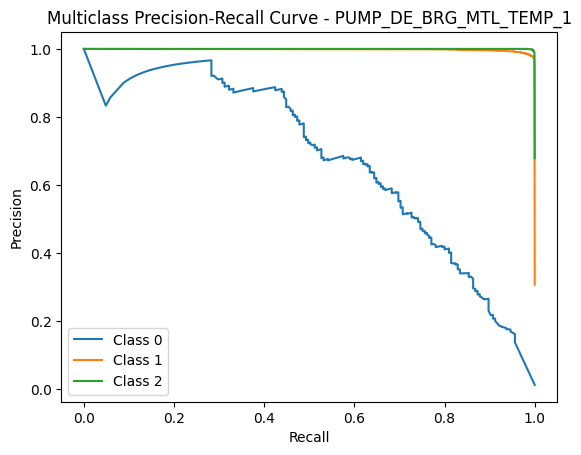


🔹 Evaluating XGBoost on PUMP_DE_BRG_MTL_TEMP_1...
✅ Test Accuracy: 0.9855
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.38      0.47       205
           1       0.98      0.99      0.98      4723
           2       0.99      1.00      1.00     10423

    accuracy                           0.99     15351
   macro avg       0.86      0.79      0.81     15351
weighted avg       0.98      0.99      0.98     15351

🔸 Multiclass Classification Metrics


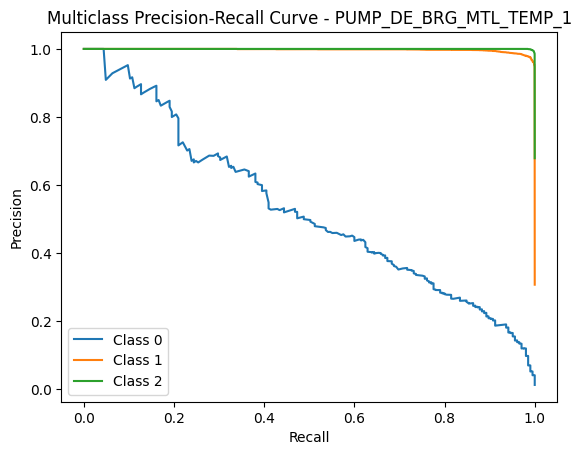


🔹 Evaluating CatBoost on PUMP_DE_BRG_MTL_TEMP_1...
✅ Test Accuracy: 0.9853
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.31      0.41       205
           1       0.97      0.99      0.98      4723
           2       0.99      1.00      1.00     10423

    accuracy                           0.99     15351
   macro avg       0.86      0.76      0.79     15351
weighted avg       0.98      0.99      0.98     15351

🔸 Multiclass Classification Metrics


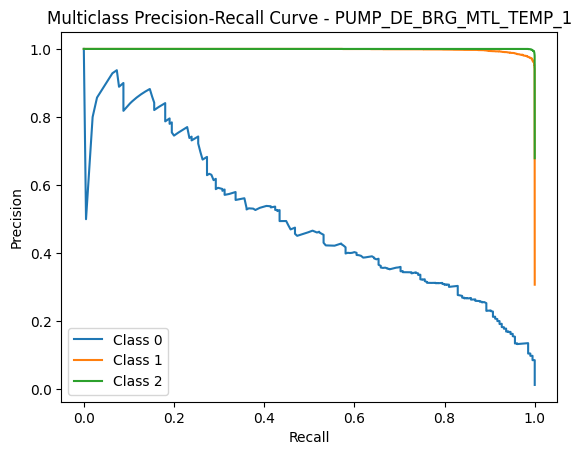


📌 Evaluating models for: PUMP_NDE_BRG_MTL_TEMP_1

🔹 Evaluating Random Forest on PUMP_NDE_BRG_MTL_TEMP_1...
✅ Test Accuracy: 0.9989
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.94      0.93       104
           1       0.99      0.98      0.99       327
           2       1.00      1.00      1.00     14838

    accuracy                           1.00     15269
   macro avg       0.97      0.98      0.97     15269
weighted avg       1.00      1.00      1.00     15269

🔸 Multiclass Classification Metrics


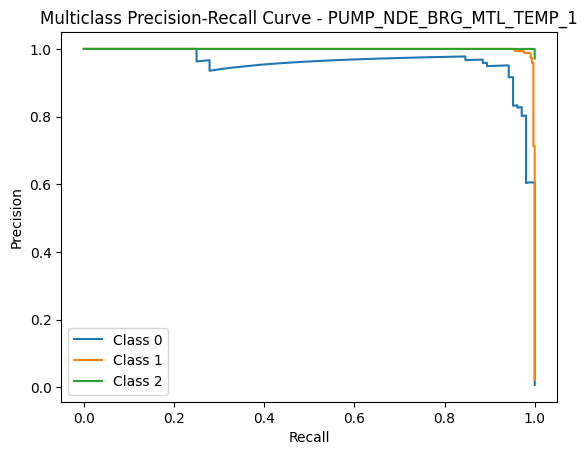


🔹 Evaluating XGBoost on PUMP_NDE_BRG_MTL_TEMP_1...
✅ Test Accuracy: 0.9974
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       104
           1       0.96      0.95      0.95       327
           2       1.00      1.00      1.00     14838

    accuracy                           1.00     15269
   macro avg       0.94      0.92      0.93     15269
weighted avg       1.00      1.00      1.00     15269

🔸 Multiclass Classification Metrics


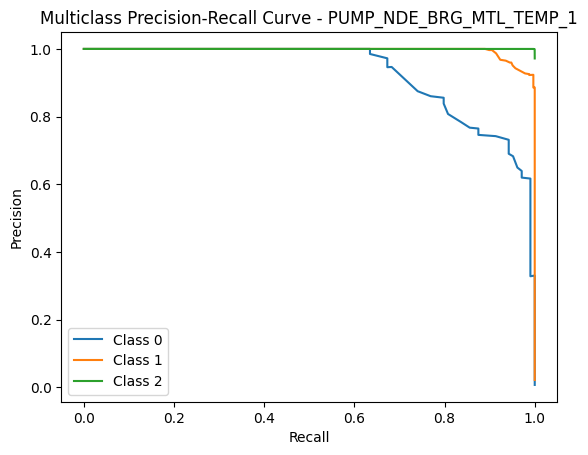


🔹 Evaluating CatBoost on PUMP_NDE_BRG_MTL_TEMP_1...
✅ Test Accuracy: 0.9973
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.79      0.82       104
           1       0.96      0.95      0.95       327
           2       1.00      1.00      1.00     14838

    accuracy                           1.00     15269
   macro avg       0.94      0.91      0.92     15269
weighted avg       1.00      1.00      1.00     15269

🔸 Multiclass Classification Metrics


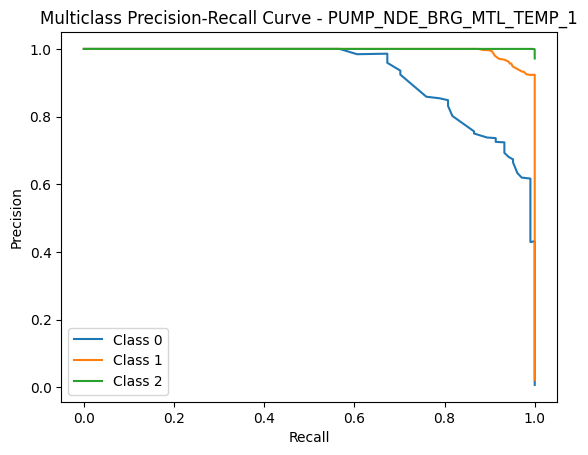


📌 Evaluating models for: MECH_DIAGNOSTIC_1

🔹 Evaluating Random Forest on MECH_DIAGNOSTIC_1...
✅ Test Accuracy: 0.9989
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13972
           1       0.99      1.00      0.99      1369

    accuracy                           1.00     15341
   macro avg       0.99      1.00      1.00     15341
weighted avg       1.00      1.00      1.00     15341

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9999


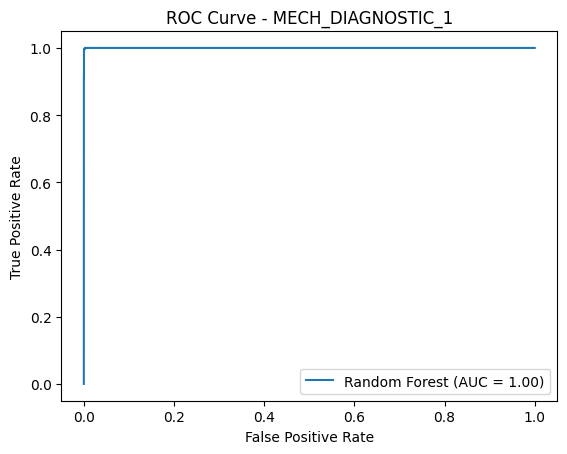

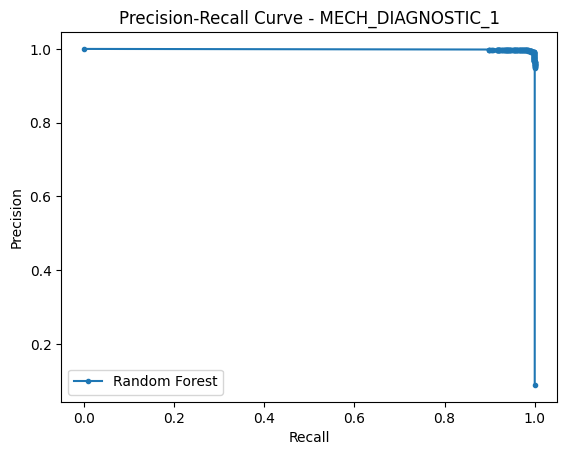

📈 Matthews Correlation Coefficient: 0.9932

🔹 Evaluating XGBoost on MECH_DIAGNOSTIC_1...
✅ Test Accuracy: 0.9969
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13972
           1       0.98      0.98      0.98      1369

    accuracy                           1.00     15341
   macro avg       0.99      0.99      0.99     15341
weighted avg       1.00      1.00      1.00     15341

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9999


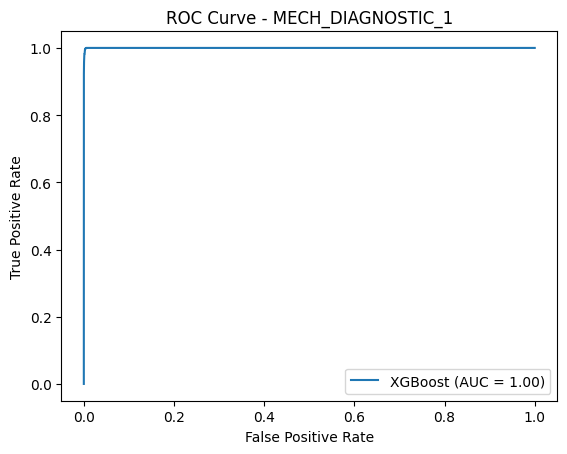

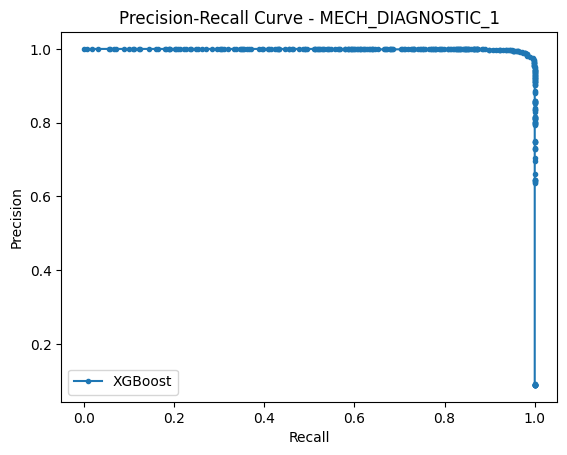

📈 Matthews Correlation Coefficient: 0.9808

🔹 Evaluating CatBoost on MECH_DIAGNOSTIC_1...
✅ Test Accuracy: 0.9972
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13972
           1       0.99      0.98      0.98      1369

    accuracy                           1.00     15341
   macro avg       0.99      0.99      0.99     15341
weighted avg       1.00      1.00      1.00     15341

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9999


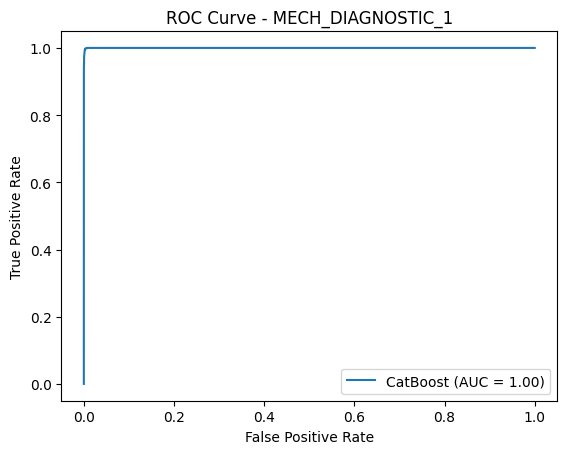

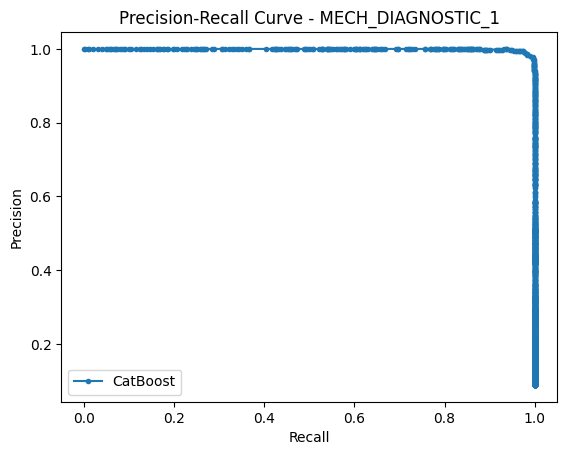

📈 Matthews Correlation Coefficient: 0.9827

📌 Evaluating models for: MECH_DIAGNOSTIC_2

🔹 Evaluating Random Forest on MECH_DIAGNOSTIC_2...
✅ Test Accuracy: 0.9946
📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14440
           1       0.93      0.97      0.95       871

    accuracy                           0.99     15311
   macro avg       0.97      0.98      0.98     15311
weighted avg       0.99      0.99      0.99     15311

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9988


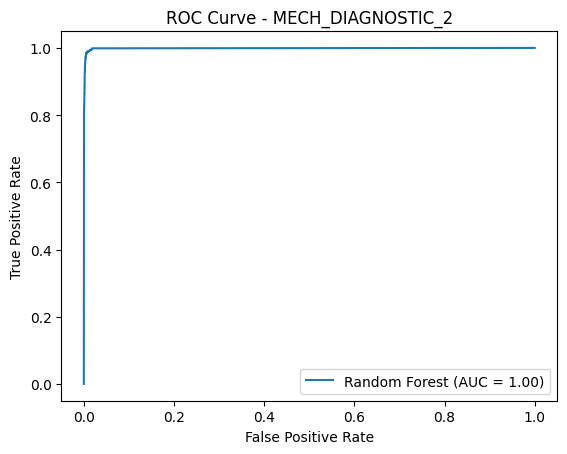

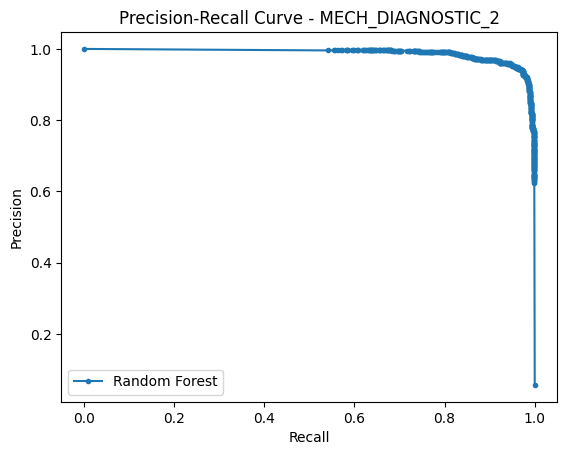

📈 Matthews Correlation Coefficient: 0.9507

🔹 Evaluating XGBoost on MECH_DIAGNOSTIC_2...
✅ Test Accuracy: 0.9887
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     14440
           1       0.93      0.87      0.90       871

    accuracy                           0.99     15311
   macro avg       0.96      0.93      0.95     15311
weighted avg       0.99      0.99      0.99     15311

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9983


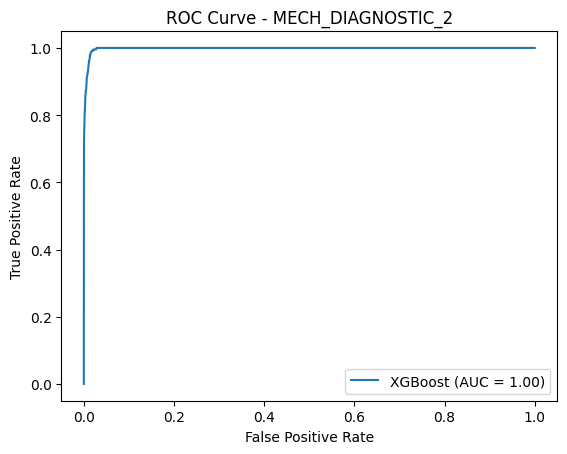

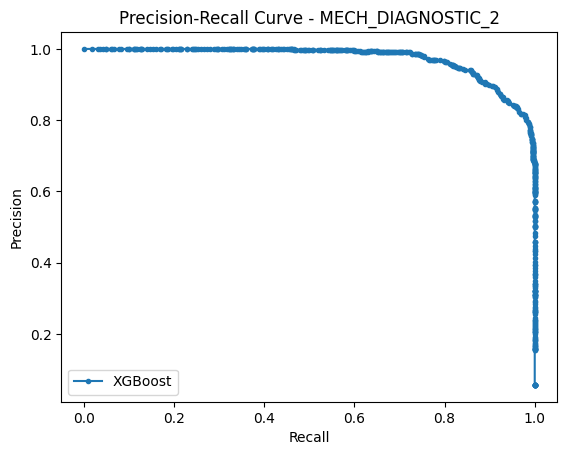

📈 Matthews Correlation Coefficient: 0.8922

🔹 Evaluating CatBoost on MECH_DIAGNOSTIC_2...
✅ Test Accuracy: 0.9886
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     14440
           1       0.93      0.86      0.90       871

    accuracy                           0.99     15311
   macro avg       0.96      0.93      0.94     15311
weighted avg       0.99      0.99      0.99     15311

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9983


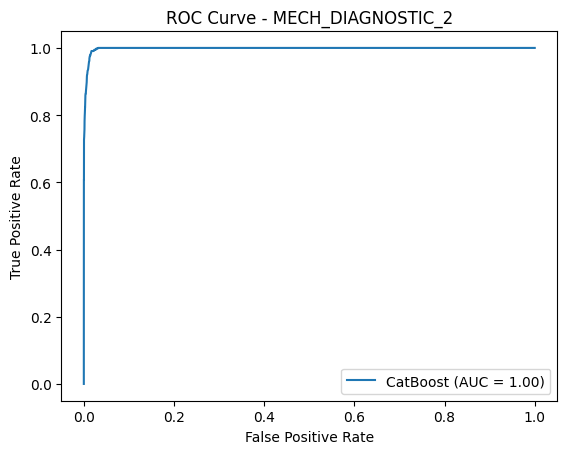

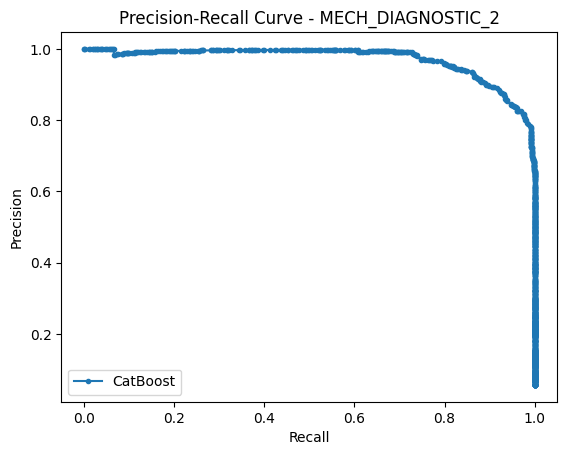

📈 Matthews Correlation Coefficient: 0.8904

📌 Evaluating models for: MECH_DIAGNOSTIC_3

🔹 Evaluating Random Forest on MECH_DIAGNOSTIC_3...
✅ Test Accuracy: 0.9612
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      8796
           1       0.95      0.95      0.95      5645

    accuracy                           0.96     14441
   macro avg       0.96      0.96      0.96     14441
weighted avg       0.96      0.96      0.96     14441

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9939


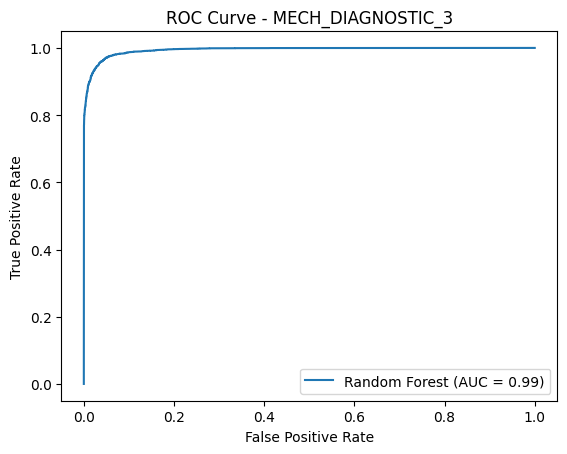

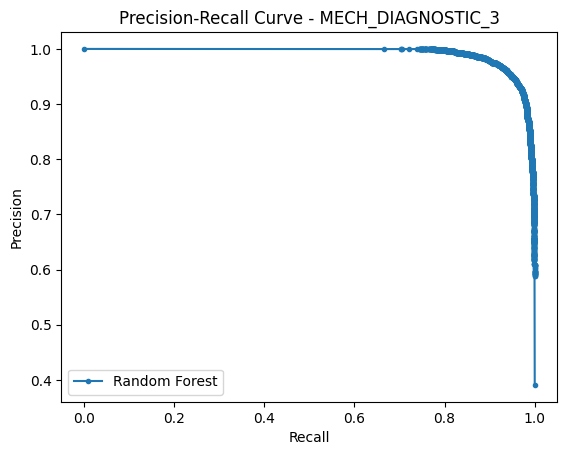

📈 Matthews Correlation Coefficient: 0.9187

🔹 Evaluating XGBoost on MECH_DIAGNOSTIC_3...
✅ Test Accuracy: 0.9367
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      8796
           1       0.94      0.90      0.92      5645

    accuracy                           0.94     14441
   macro avg       0.94      0.93      0.93     14441
weighted avg       0.94      0.94      0.94     14441

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9868


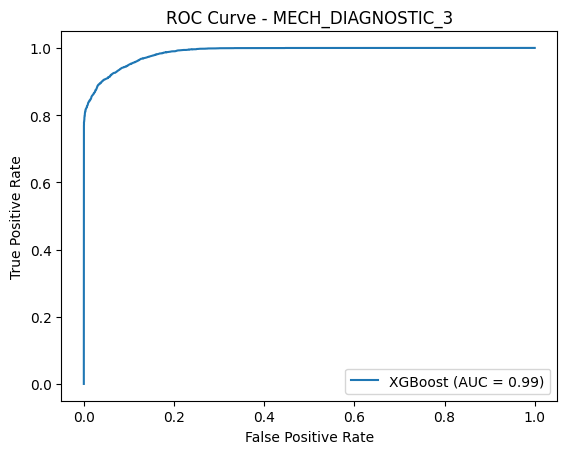

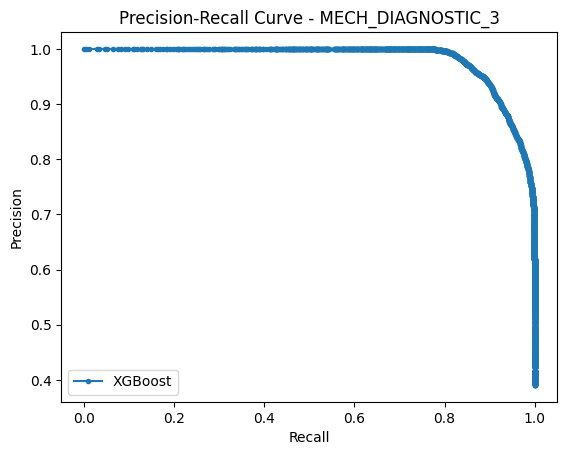

📈 Matthews Correlation Coefficient: 0.8666

🔹 Evaluating CatBoost on MECH_DIAGNOSTIC_3...
✅ Test Accuracy: 0.9353
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      8796
           1       0.95      0.89      0.91      5645

    accuracy                           0.94     14441
   macro avg       0.94      0.93      0.93     14441
weighted avg       0.94      0.94      0.93     14441

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9858


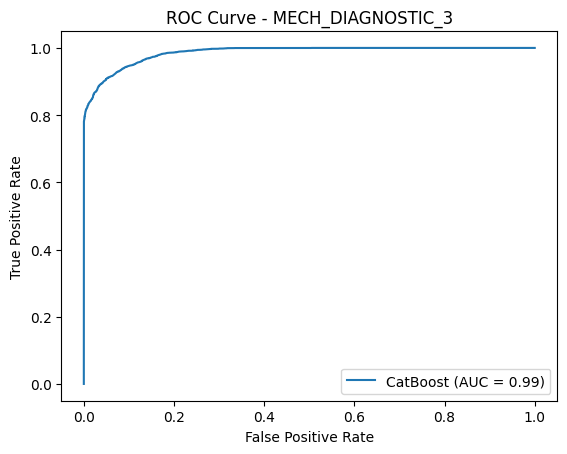

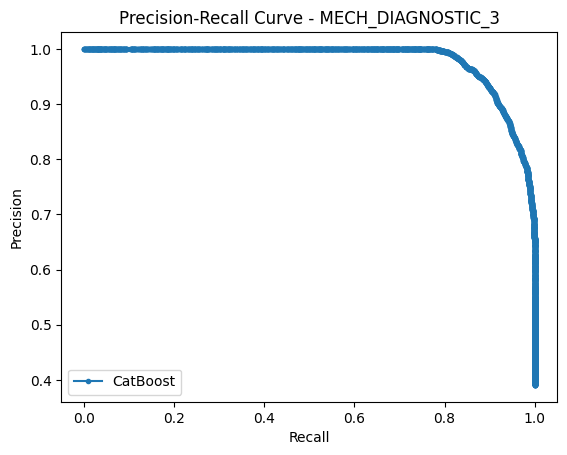

📈 Matthews Correlation Coefficient: 0.8638

📌 Evaluating models for: MECH_DIAGNOSTIC_4

🔹 Evaluating Random Forest on MECH_DIAGNOSTIC_4...
✅ Test Accuracy: 0.9481
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.92      0.91      4008
           1       0.97      0.96      0.96     10782

    accuracy                           0.95     14790
   macro avg       0.93      0.94      0.93     14790
weighted avg       0.95      0.95      0.95     14790

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9897


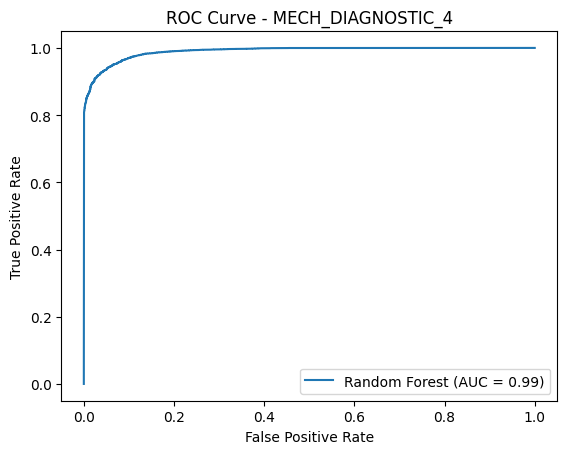

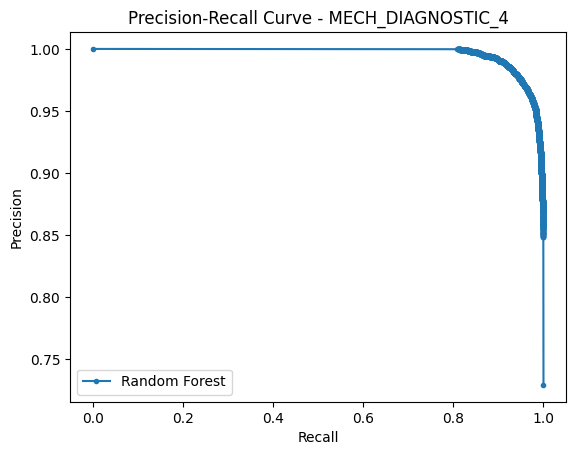

📈 Matthews Correlation Coefficient: 0.8702

🔹 Evaluating XGBoost on MECH_DIAGNOSTIC_4...
✅ Test Accuracy: 0.9260
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.85      0.86      4008
           1       0.94      0.96      0.95     10782

    accuracy                           0.93     14790
   macro avg       0.91      0.90      0.91     14790
weighted avg       0.93      0.93      0.93     14790

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9825


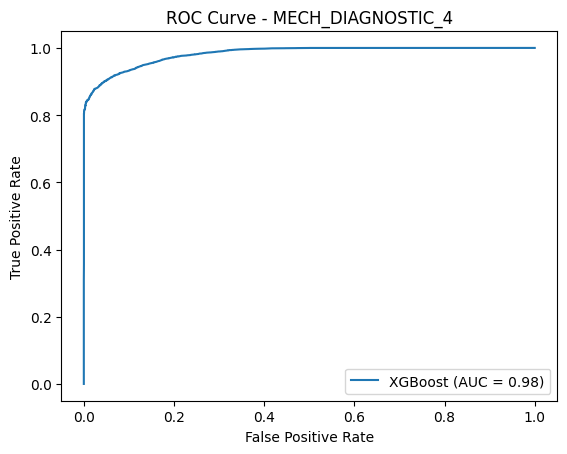

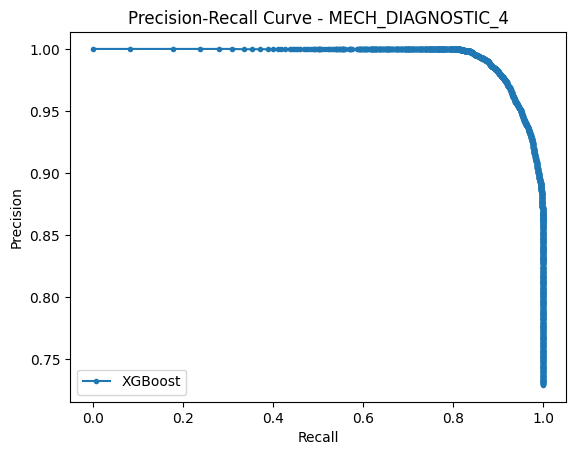

📈 Matthews Correlation Coefficient: 0.8111

🔹 Evaluating CatBoost on MECH_DIAGNOSTIC_4...
✅ Test Accuracy: 0.9275
📊 Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.86      0.87      4008
           1       0.95      0.95      0.95     10782

    accuracy                           0.93     14790
   macro avg       0.91      0.91      0.91     14790
weighted avg       0.93      0.93      0.93     14790

🔸 Binary Classification Metrics
🎯 ROC-AUC Score: 0.9826


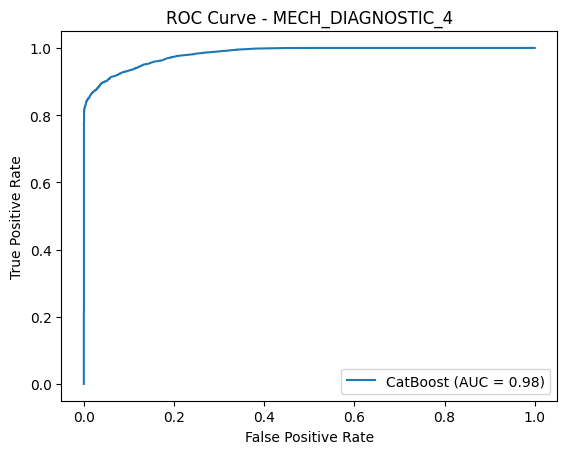

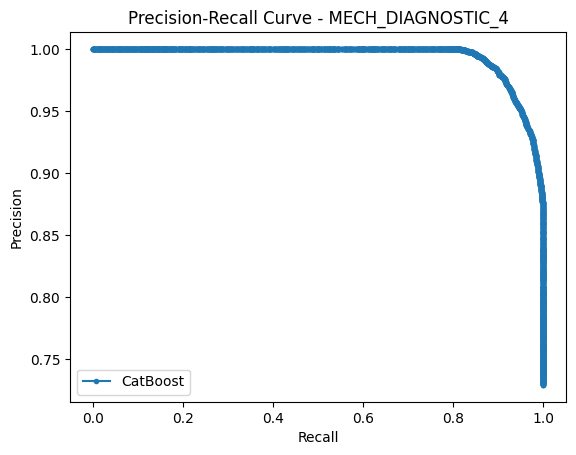

📈 Matthews Correlation Coefficient: 0.8159


In [51]:
from sklearn.metrics import (
    accuracy_score, classification_report, precision_recall_curve, roc_curve, auc,
    matthews_corrcoef
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

# Define which sheets are binary vs. multiclass
binary_sheets = ["MECH_DIAGNOSTIC_1", "MECH_DIAGNOSTIC_2", "MECH_DIAGNOSTIC_3", "MECH_DIAGNOSTIC_4"]
multiclass_sheets = ["PUMP_DE_BRG_MTL_TEMP_1", "PUMP_NDE_BRG_MTL_TEMP_1"]

def evaluate_models(best_models_per_sheet, test_data_per_sheet):
    """
    Evaluates trained models using selected metrics and visualizations.
    """
    for sheet, models in best_models_per_sheet.items():
        print(f"\n📌 Evaluating models for: {sheet}")

        # Get test data
        X_test, y_test = test_data_per_sheet[sheet]

        for model_name, model in models.items():
            print(f"\n🔹 Evaluating {model_name} on {sheet}...")

            # Predictions
            y_pred = model.predict(X_test)
            y_probs = model.predict_proba(X_test)

            # Accuracy
            accuracy = accuracy_score(y_test, y_pred)
            print(f"✅ Test Accuracy: {accuracy:.4f}")

            # Classification Report
            print("📊 Classification Report:")
            print(classification_report(y_test, y_pred))

            if sheet in binary_sheets:
                print("🔸 Binary Classification Metrics")

                # ROC-AUC
                fpr, tpr, _ = roc_curve(y_test, y_probs[:, 1])
                roc_auc = auc(fpr, tpr)
                print(f"🎯 ROC-AUC Score: {roc_auc:.4f}")
                plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')
                plt.xlabel('False Positive Rate')
                plt.ylabel('True Positive Rate')
                plt.title(f'ROC Curve - {sheet}')
                plt.legend()
                plt.show()

                # Precision-Recall Curve
                precision, recall, _ = precision_recall_curve(y_test, y_probs[:, 1])
                plt.plot(recall, precision, marker='.', label=model_name)
                plt.xlabel('Recall')
                plt.ylabel('Precision')
                plt.title(f'Precision-Recall Curve - {sheet}')
                plt.legend()
                plt.show()

                # Matthews Correlation Coefficient
                mcc = matthews_corrcoef(y_test, y_pred)
                print(f"📈 Matthews Correlation Coefficient: {mcc:.4f}")

            elif sheet in multiclass_sheets:
                print("🔸 Multiclass Classification Metrics")

                # One-vs-rest Precision-Recall
                y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
                n_classes = y_test_binarized.shape[1]

                for i in range(n_classes):
                    precision, recall, _ = precision_recall_curve(y_test_binarized[:, i], y_probs[:, i])
                    plt.plot(recall, precision, label=f'Class {i}')

                plt.xlabel('Recall')
                plt.ylabel('Precision')
                plt.title(f'Multiclass Precision-Recall Curve - {sheet}')
                plt.legend()
                plt.show()

# **Run Evaluation**
evaluate_models(best_models_per_sheet, test_data_per_sheet)

## Save Models

In [ ]:
#New Prototype
import joblib
import os

# Create folders if they don't exist
os.makedirs("saved_models", exist_ok=True)
os.makedirs("saved_models/label_encoders", exist_ok=True)
os.makedirs("saved_models/scalers", exist_ok=True)
os.makedirs("saved_models/features", exist_ok=True)  # New folder for feature names

# Save models, label encoders, scalers, and features
for sheet, models in best_models_per_sheet.items():
    # Save models
    for model_name, model in models.items():
        model_filename = f"saved_models/{sheet}_{model_name}.pkl"
        joblib.dump(model, model_filename)
        print(f"✅ Saved model: {model_filename}")
    
    # Save label encoder
    if sheet in label_encoders and label_encoders[sheet] is not None:
        le_filename = f"saved_models/label_encoders/{sheet}_label_encoder.pkl"
        joblib.dump(label_encoders[sheet], le_filename)
        print(f"✅ Saved label encoder: {le_filename}")
    
    # Save scaler
    if sheet in scalers and scalers[sheet] is not None:
        scaler_filename = f"saved_models/scalers/{sheet}_scaler.pkl"
        joblib.dump(scalers[sheet], scaler_filename)
        print(f"✅ Saved scaler: {scaler_filename}")
    
    # Save feature names for this sheet (NEW)
    if sheet in training_features_per_sheet:
        features_filename = f"saved_models/features/{sheet}_features.pkl"
        joblib.dump(training_features_per_sheet[sheet], features_filename)
        print(f"✅ Saved features: {features_filename}")

print("✅ All model components saved successfully")

In [ ]:
import joblib
import os

# Create folders if they don't exist
os.makedirs("saved_models", exist_ok=True)
os.makedirs("saved_models/label_encoders", exist_ok=True)
os.makedirs("saved_models/scalers", exist_ok=True)

# Save models, label encoders, and scalers
for sheet, models in best_models_per_sheet.items():
    # Save models
    for model_name, model in models.items():
        model_filename = f"saved_models/{sheet}_{model_name}.pkl"
        joblib.dump(model, model_filename)
        print(f"✅ Saved model: {model_filename}")
    
    # Save label encoder
    if sheet in label_encoders and label_encoders[sheet] is not None:
        le_filename = f"saved_models/label_encoders/{sheet}_label_encoder.pkl"
        joblib.dump(label_encoders[sheet], le_filename)
        print(f"✅ Saved label encoder: {le_filename}")
    
    # Save scaler
    if sheet in scalers and scalers[sheet] is not None:
        scaler_filename = f"saved_models/scalers/{sheet}_scaler.pkl"
        joblib.dump(scalers[sheet], scaler_filename)
        print(f"✅ Saved scaler: {scaler_filename}")

# Save training features
joblib.dump(training_features_per_sheet, "saved_models/training_features_per_sheet.pkl")
print("✅ Saved training features")

✅ Saved model: saved_models/PUMP_DE_BRG_MTL_TEMP_1_Random Forest.pkl
✅ Saved model: saved_models/PUMP_DE_BRG_MTL_TEMP_1_XGBoost.pkl
✅ Saved model: saved_models/PUMP_DE_BRG_MTL_TEMP_1_CatBoost.pkl
✅ Saved label encoder: saved_models/label_encoders/PUMP_DE_BRG_MTL_TEMP_1_label_encoder.pkl
✅ Saved scaler: saved_models/scalers/PUMP_DE_BRG_MTL_TEMP_1_scaler.pkl
✅ Saved features: saved_models/features/PUMP_DE_BRG_MTL_TEMP_1_features.pkl
✅ Saved model: saved_models/PUMP_NDE_BRG_MTL_TEMP_1_Random Forest.pkl
✅ Saved model: saved_models/PUMP_NDE_BRG_MTL_TEMP_1_XGBoost.pkl
✅ Saved model: saved_models/PUMP_NDE_BRG_MTL_TEMP_1_CatBoost.pkl
✅ Saved label encoder: saved_models/label_encoders/PUMP_NDE_BRG_MTL_TEMP_1_label_encoder.pkl
✅ Saved scaler: saved_models/scalers/PUMP_NDE_BRG_MTL_TEMP_1_scaler.pkl
✅ Saved features: saved_models/features/PUMP_NDE_BRG_MTL_TEMP_1_features.pkl
✅ Saved model: saved_models/MECH_DIAGNOSTIC_1_Random Forest.pkl
✅ Saved model: saved_models/MECH_DIAGNOSTIC_1_XGBoost.pkl
✅ 

In [54]:
import joblib
import os

# Create a folder to store the models
os.makedirs("saved_models", exist_ok=True)

# Save each model and its features
for sheet, models in best_models_per_sheet.items():
    for model_name, model in models.items():
        model_filename = f"saved_models/{sheet}_{model_name}.pkl"
        joblib.dump(model, model_filename)
        print(f"✅ Saved: {model_filename}")

    # Also save the features used during training for this sheet
    if sheet in training_features_per_sheet:  # Ensure feature list exists
        feature_list = training_features_per_sheet[sheet]  # This should be a list of feature names (strings)
        feature_filename = f"saved_models/{sheet}_features.pkl"
        joblib.dump(feature_list, feature_filename)
        print(f"📦 Saved features for {sheet}: {feature_filename}")
    else:
        print(f"⚠️ No feature list found for {sheet}, skipping feature save.")

# ✅ Save overall model metadata
joblib.dump(best_models_per_sheet, "saved_models/models_metadata.pkl")
print("✅ Saved models metadata: saved_models/models_metadata.pkl")


✅ Saved: saved_models/PUMP_DE_BRG_MTL_TEMP_1_Random Forest.pkl
✅ Saved: saved_models/PUMP_DE_BRG_MTL_TEMP_1_XGBoost.pkl
✅ Saved: saved_models/PUMP_DE_BRG_MTL_TEMP_1_CatBoost.pkl
📦 Saved features for PUMP_DE_BRG_MTL_TEMP_1: saved_models/PUMP_DE_BRG_MTL_TEMP_1_features.pkl
✅ Saved: saved_models/PUMP_NDE_BRG_MTL_TEMP_1_Random Forest.pkl
✅ Saved: saved_models/PUMP_NDE_BRG_MTL_TEMP_1_XGBoost.pkl
✅ Saved: saved_models/PUMP_NDE_BRG_MTL_TEMP_1_CatBoost.pkl
📦 Saved features for PUMP_NDE_BRG_MTL_TEMP_1: saved_models/PUMP_NDE_BRG_MTL_TEMP_1_features.pkl
✅ Saved: saved_models/MECH_DIAGNOSTIC_1_Random Forest.pkl
✅ Saved: saved_models/MECH_DIAGNOSTIC_1_XGBoost.pkl
✅ Saved: saved_models/MECH_DIAGNOSTIC_1_CatBoost.pkl
📦 Saved features for MECH_DIAGNOSTIC_1: saved_models/MECH_DIAGNOSTIC_1_features.pkl
✅ Saved: saved_models/MECH_DIAGNOSTIC_2_Random Forest.pkl
✅ Saved: saved_models/MECH_DIAGNOSTIC_2_XGBoost.pkl
✅ Saved: saved_models/MECH_DIAGNOSTIC_2_CatBoost.pkl
📦 Saved features for MECH_DIAGNOSTIC_2: s

In [53]:
import pandas as pd
import os

# Load the Excel file
excel_file = "PUMP-DATA-HPS-1008.xlsx"  # Replace with your actual file
sheets_dict = pd.read_excel(excel_file, sheet_name=None)  # Read all sheets

# Create a folder for CSV files
output_folder = "csv_sheets"
os.makedirs(output_folder, exist_ok=True)

# Loop through each sheet and save as CSV
for sheet_name, df in sheets_dict.items():
    csv_filename = os.path.join(output_folder, f"{sheet_name}.csv")
    df.to_csv(csv_filename, index=False)
    print(f"✅ Saved: {csv_filename}")

print("\n🎉 All sheets have been saved as separate CSV files!")


✅ Saved: csv_sheets\SUCTION_PRESS_MT1_CV.csv
✅ Saved: csv_sheets\DISCHARGE_PRESS_MT1_CV.csv
✅ Saved: csv_sheets\DISCHARGE_FLOW_MT1_CV.csv
✅ Saved: csv_sheets\PUMP_INPUT_POWER_CV.csv
✅ Saved: csv_sheets\PUMP_DE_BRG_MTL_TEMP_1.csv
✅ Saved: csv_sheets\PUMP_DE_BRG_VIB_1_SEIS_OVERALL.csv
✅ Saved: csv_sheets\PUMP_DE_BRG_VIB_2_SEIS_OVERALL.csv
✅ Saved: csv_sheets\PUMP_NDE_BRG_MTL_TEMP_1.csv
✅ Saved: csv_sheets\PUMP_NDE_BRG_VIB_1_SEIS_OVERALL.csv
✅ Saved: csv_sheets\PUMP_NDE_BRG_VIB_2_SEIS_OVERALL.csv
✅ Saved: csv_sheets\MECH_DIAGNOSTIC_1.csv
✅ Saved: csv_sheets\MECH_DIAGNOSTIC_2.csv
✅ Saved: csv_sheets\MECH_DIAGNOSTIC_3.csv
✅ Saved: csv_sheets\MECH_DIAGNOSTIC_4.csv

🎉 All sheets have been saved as separate CSV files!
